![portada](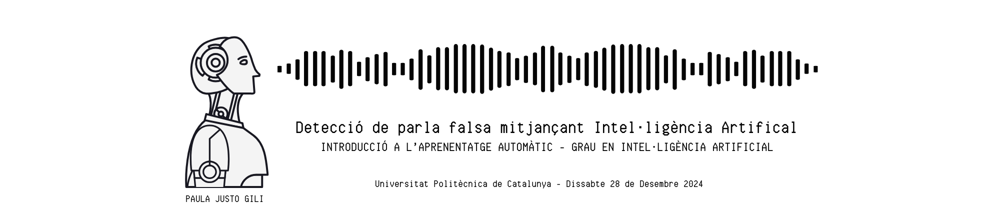
)

In [1]:
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

# Map 1 library
import plotly.express as px

# Map 2 libraries
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

# Librosa Libraries
import librosa
import librosa.display
import IPython.display as ipd

import sklearn

import warnings
warnings.filterwarnings('ignore')

## 0. Lectura de les bases de dades 

In [2]:
# Importem les bases de dades 
train_csv = pd.read_csv('./training_set.csv')
test_csv = pd.read_csv('./test_set.csv')
full_csv = pd.read_csv('./full_habla_updated_metadata.csv')
smile_csv = pd.read_csv('./smile_feature_selected.csv')

## 1. Anàlisi i preprocessat de dades

In [3]:
train_csv.head()

,F_path,Category,Source_ID,Target_ID,Source_Sex,Source_Country,Target_Sex,Target_Country,ID,Sex,Country,UniqueID,Realornot
0,FinalDataset_16khz/Real/Argentina/arf_00295/ar...,Real,NaN,NaN,NaN,NaN,NaN,NaN,arf_00295,Female,Argentina,73932,1
1,FinalDataset_16khz/Real/Argentina/arf_00295/ar...,Real,NaN,NaN,NaN,NaN,NaN,NaN,arf_00295,Female,Argentina,55678,1
2,FinalDataset_16khz/Real/Argentina/arf_00295/ar...,Real,NaN,NaN,NaN,NaN,NaN,NaN,arf_00295,Female,Argentina,67831,1
3,FinalDataset_16khz/Real/Argentina/arf_00295/ar...,Real,NaN,NaN,NaN,NaN,NaN,NaN,arf_00295,Female,Argentina,71460,1
4,FinalDataset_16khz/Real/Argentina/arf_00295/ar...,Real,NaN,NaN,NaN,NaN,NaN,NaN,arf_00295,Female,Argentina,61757,1


Unifiquem la informació de les variables `Sex`, `Country`, i `ID` amb les seves respectives versions `Target`, creant columnes combinades (`Combined_Sex`, `Combined_Country`, `Combined_ID`) per evitar redundàncies i treballar amb dades més netes i consistents.

In [4]:
df = pd.DataFrame(index=train_csv.index)

df['ID'] = train_csv['ID']
df['Target_ID'] = train_csv['Target_ID']
df['Category'] = train_csv['Category']
df['Target_Sex'] = train_csv['Target_Sex']
df['Target_Country'] = train_csv['Target_Country']
df['Sex'] = train_csv['Sex']
df['Category'] = train_csv['Category']
df['Country'] = train_csv['Country']
df['UniqueID'] = train_csv['UniqueID']
df['Realornot'] = train_csv['Realornot']

df['Combined_Sex'] = df['Sex'].combine_first(df['Target_Sex'])
df = df.drop(columns=['Sex', 'Target_Sex'])

df['Combined_Country'] = df['Country'].combine_first(df['Target_Country'])
df = df.drop(columns=['Country', 'Target_Country'])

df['Combined_ID'] = df['ID'].combine_first(df['Target_ID'])
df = df.drop(columns=['ID', 'Target_ID'])

df.head()

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID
0,Real,73932,1,Female,Argentina,arf_00295
1,Real,55678,1,Female,Argentina,arf_00295
2,Real,67831,1,Female,Argentina,arf_00295
3,Real,71460,1,Female,Argentina,arf_00295
4,Real,61757,1,Female,Argentina,arf_00295


In [5]:
smile_csv.head()

,Unnamed: 0,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,loudness_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,jitterLocal_sma3nz_amean,slopeUV500-1500_sma3nz_amean,UniqueID
0,0,13.655039,31.285376,31.285376,16.190195,0.338007,1.871209,19.641603,0.671554,12.977986,1.174820,15.133403,1.055712,0.024725,0.013012,12887
1,1,33.807160,42.137940,42.137940,22.348753,0.481519,1.837113,19.642485,0.632724,7.225969,2.289886,14.791618,1.183340,0.020789,0.009675,16019
2,2,16.206518,26.210506,26.210506,12.744358,0.268581,1.936138,23.789776,0.523593,12.097356,1.287826,10.082766,1.598042,0.012824,0.013230,19916
3,3,74.068300,39.873170,39.873170,20.845293,0.169376,1.752427,19.072332,0.680972,11.948067,1.284195,14.839839,1.081400,0.024667,0.022918,35287
4,4,14.972388,22.553352,22.553352,11.603700,0.313857,1.848405,21.528349,0.616796,10.465217,1.392769,17.536242,0.903966,0.014983,0.016212,3608


Juntem **df** (el DataFrame amb les variables combinades) amb **smile_csv** utilitzant `UniqueID`

In [6]:
df_train = pd.merge(df, smile_csv, on='UniqueID', how='inner')

df_train.head()

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID,Unnamed: 0,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1,...,loudness_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,jitterLocal_sma3nz_amean,slopeUV500-1500_sma3nz_amean
0,Real,73932,1,Female,Argentina,arf_00295,73931,59.642597,80.991450,80.991450,...,0.300763,1.568339,17.253256,0.925168,17.812492,0.500698,14.972096,1.021553,0.022768,0.024434
1,Real,55678,1,Female,Argentina,arf_00295,55677,7.781728,32.577520,32.577520,...,0.312016,1.864721,12.843270,0.998090,18.405964,0.540551,18.569187,0.752821,0.024398,0.025589
2,Real,67831,1,Female,Argentina,arf_00295,67830,14.860586,18.454376,18.454376,...,0.354954,1.580724,15.459043,0.978528,16.688513,0.688499,19.077845,0.595128,0.019707,0.026735
3,Real,71460,1,Female,Argentina,arf_00295,71459,13.270463,85.602270,85.602270,...,0.372097,1.337209,20.966034,0.712422,14.891723,0.889105,16.558605,0.840130,0.018888,0.021093
4,Real,61757,1,Female,Argentina,arf_00295,61756,43.167866,22.110174,22.110174,...,0.468941,1.398896,21.116756,0.774850,13.436496,1.110517,12.953899,1.262700,0.015973,0.021942


### 1.1. Partició del dataset

Fem particions del dataset per dividir les dades en **train**, **validation** i **test**, assegurant una distribució representativa de la variable objectiu `Realornot` mitjançant l'estratificació. 

En una primera partició separem un conjunt de **test** (20%) per avaluar el rendiment final del model, mentre que 80% (**train_data**) restant el subdividim en **train_sub** (70% del **train_data**) i **validation** (30% del **train_data**) per entrenar i ajustar els hiperparàmetres del model de manera fiable sense tocar les dades de test. Això garanteix una avaluació justa i prevé sobreajustament.

In [7]:
from sklearn.model_selection import train_test_split

In [8]:
# Particionar en train i test (80%-20%)
train_data, test_data = train_test_split(
    df_train, 
    test_size=0.2,         
    random_state=42,       
    stratify=df_train['Realornot']
)

print(f'\n\033[1mMida del conjunt de train:\033[0m {len(train_data)}')
print(f'\033[1mMida del conjunt de test:\033[0m {len(test_data)}')


Mida del conjunt de train: 14243
Mida del conjunt de test: 3561


In [9]:
# Divisió del conjunt de train en sub-train i validació
train_sub, val_data = train_test_split(
    train_data, 
    test_size=0.3,          
    random_state=42,        
    stratify=train_data['Realornot']  
)

print(f'\n\033[1mMida del sub-train:\033[0m {len(train_sub)}')
print(f'\033[1mMida del conjunt de validació:\033[0m {len(val_data)}')
print(f'\033[1mMida del conjunt de test:\033[0m {len(test_data)}')


Mida del sub-train: 9970
Mida del conjunt de validació: 4273
Mida del conjunt de test: 3561


### 1.2. Anàlisis estadístic de les variables

In [10]:
train_sub.describe()

,UniqueID,Realornot,Unnamed: 0,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,loudness_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,jitterLocal_sma3nz_amean,slopeUV500-1500_sma3nz_amean
count,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000
mean,48313.525075,0.502106,48293.935005,111.319083,40.458489,40.458489,43.346769,0.495234,1.385563,18.063542,0.950296,9.249655,22.525991,12.230977,0.728775,0.020980,0.022307
std,23580.689275,0.500021,23646.138866,153.826842,109.602633,109.602633,124.844511,0.278844,0.365781,4.498728,0.299778,5.379099,2204.628571,4.944548,55.046176,0.007465,0.006469
min,4.000000,0.000000,120.000000,0.000000,-1933.929300,-1933.929300,0.000000,0.041620,0.715352,-1.798633,-5.672723,-10.317350,-7098.178700,-9.022558,-5294.333500,0.006465,-0.000079
25%,29974.500000,0.000000,28750.750000,27.249571,17.208741,17.208741,8.334077,0.320740,1.096969,14.977383,0.762864,5.756119,0.803930,9.342239,0.802944,0.016081,0.018108
50%,56433.000000,1.000000,56432.000000,82.690365,24.215085,24.215085,13.245071,0.434145,1.343288,17.914537,0.898190,9.809751,1.183497,12.721884,1.067422,0.019491,0.022044
75%,67268.500000,1.000000,67267.500000,141.748690,35.376104,35.376104,25.670986,0.593516,1.610221,21.022514,1.068124,13.217399,1.961444,15.668128,1.511905,0.024086,0.025736
max,80810.000000,1.000000,80809.000000,2005.566500,2964.744000,2964.744000,2027.281900,3.204929,3.401293,36.043198,5.413955,23.924866,219881.690000,27.686117,372.812350,0.112440,0.058923


Generem els gràfics de les distribucions de les variables categòriques del conjunt d’entrenament per observar-ne la distribució. A més, analitzem els valors numèrics corresponents a aquestes distribucions per obtenir una visió més completa.

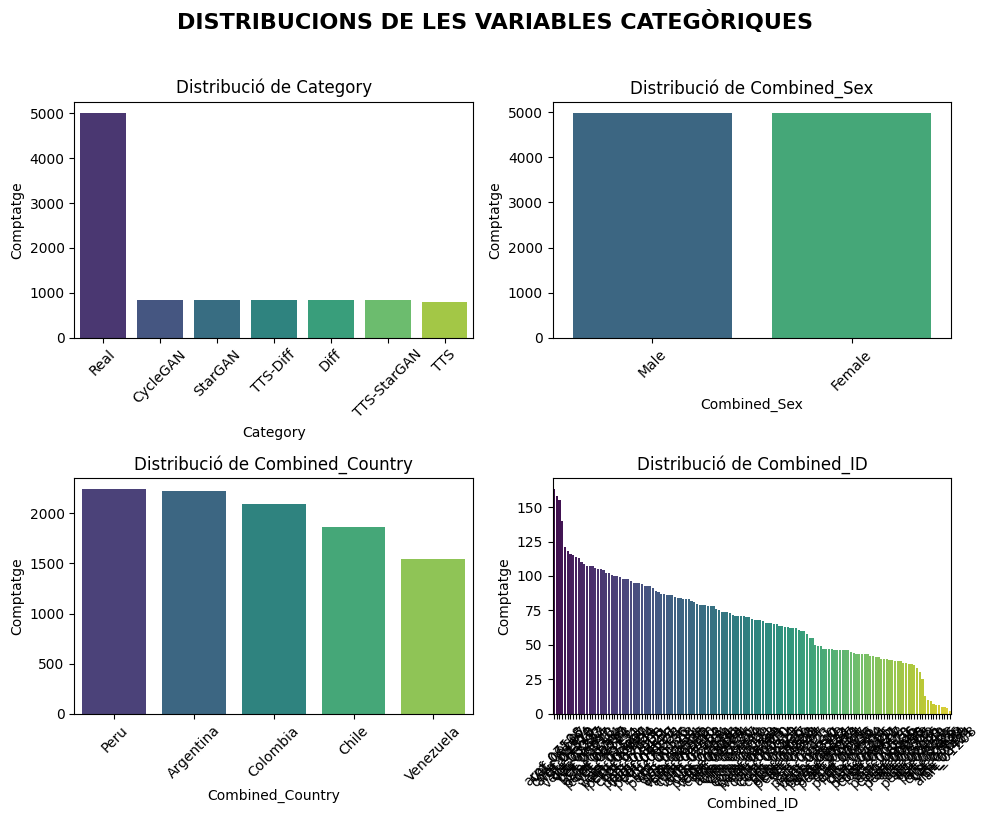

In [11]:
categorical_columns = [col for col in train_sub.columns if col not in ['UniqueID', 'ID', 'F_path']]
cat_features = [feature for feature in categorical_columns if train_sub[feature].dtypes == 'object']

grafics_fila = 2
fig, axes = plt.subplots(len(cat_features) // grafics_fila + len(cat_features) % grafics_fila, grafics_fila, figsize=(10, 8))
axes = axes.flatten()

for i, col in enumerate(cat_features):
    sns.countplot(
        ax=axes[i],
        x=col, 
        data=train_sub, 
        order=train_sub[col].value_counts().index,
        palette='viridis'
    )
    axes[i].set_title(f'Distribució de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Comptatge')
    axes[i].tick_params(axis='x', rotation=45)

fig.suptitle('DISTRIBUCIONS DE LES VARIABLES CATEGÒRIQUES', fontsize=16, y=1.02, fontweight='bold')

plt.tight_layout()
plt.show()


In [12]:
for i, col in enumerate(cat_features):

    distribucio = train_sub[col].value_counts(normalize=True) * 100
    print(f'\n\033[1mDistribució de {col}:\033[0m')
    print(distribucio)



Distribució de Category:
Category
Real           50.210632
CycleGAN        8.425276
StarGAN         8.375125
TTS-Diff        8.365095
Diff            8.345035
TTS-StarGAN     8.304915
TTS             7.973922
Name: proportion, dtype: float64

Distribució de Combined_Sex:
Combined_Sex
Male      50.01003
Female    49.98997
Name: proportion, dtype: float64

Distribució de Combined_Country:
Combined_Country
Peru         22.477432
Argentina    22.326981
Colombia     20.982949
Chile        18.726179
Venezuela    15.486459
Name: proportion, dtype: float64

Distribució de Combined_ID:
Combined_ID
arm_07508    1.634905
cof_06136    1.584754
vef_09697    1.554664
com_08784    1.404213
arm_01523    1.213641
               ...   
cof_03034    0.060181
vef_07508    0.050150
arm_08421    0.050150
clf_02484    0.040120
arf_01208    0.020060
Name: proportion, Length: 145, dtype: float64


Mirem també les distribucions de les variables numèriques en el conjunt d'entrenament.

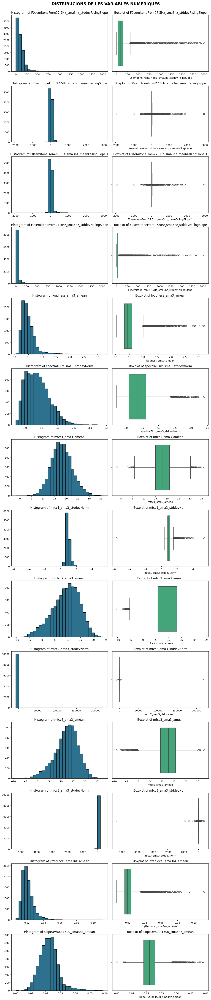

In [13]:
import matplotlib.cm as cm
c = cm.viridis(0.37)
c1 = cm.viridis(0.66)

numeric_colums = [feature for feature in train_sub.columns if train_sub[feature].dtypes != 'object']
numeric_colums= numeric_colums[3:]

fig, axes = plt.subplots(len(numeric_colums), 2, figsize=(12, len(numeric_colums) * 4))

for i, column in enumerate(numeric_colums):
    # Subplot per a l'histograma
    plt.subplot(len(numeric_colums), 2, 2*i + 1)
    plt.hist(train_sub[column], bins=30, color=c, edgecolor='black')
    plt.title(f'Histogram of {column}')
   
    # Subplot per al boxplot
    plt.subplot(len(numeric_colums), 2, 2*i + 2)
    sns.boxplot(x=train_sub[column], color=c1)
    plt.title(f'Boxplot of {column}')


fig.suptitle('DISTRIBUCIONS DE LES VARIABLES NUMÈRIQUES', fontsize=16, y=1.00, fontweight='bold')

plt.tight_layout()
plt.show()

### 1.3. Balanceig de la variable objectiu

La variable objectiu seleccionada és `Realornot`, que identifica si una veu és real (**1**) o no (**0**). Per aquest motiu, és important verificar que aquesta variable estigui equilibrada en els conjunts de dades de train, validació i test.

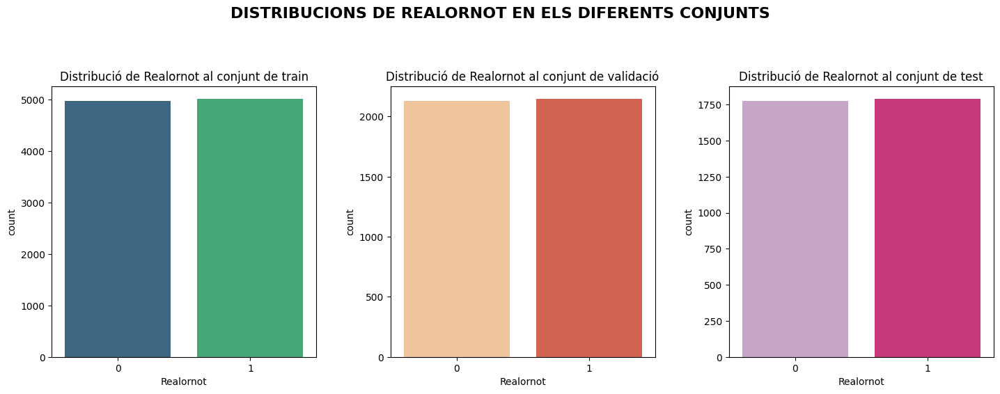

In [14]:
fig, axes = plt.subplots(1, 3, figsize=(15, 6))

# Gràfic 1: Conjunt de train
sns.countplot(ax=axes[0], x='Realornot', data=train_sub, palette='viridis')
axes[0].set_title("Distribució de Realornot al conjunt de train")

# Gràfic 2: Conjunt de validació
sns.countplot(ax=axes[1], x='Realornot', data=val_data, palette='OrRd')
axes[1].set_title("Distribució de Realornot al conjunt de validació")

# Gràfic 3: Conjunt de test
sns.countplot(ax=axes[2], x='Realornot', data=test_data, palette='PuRd')
axes[2].set_title("Distribució de Realornot al conjunt de test")

fig.suptitle('DISTRIBUCIONS DE REALORNOT EN ELS DIFERENTS CONJUNTS', fontsize=16, y=0.98, fontweight='bold')

plt.tight_layout(pad=3.0)
plt.show()

In [15]:
print('\n\033[1;4mCONJUNT DE TRAIN\033[0m')
print(train_sub['Realornot'].value_counts(normalize=True))

print('\n\033[1;4mCONJUNT DE VALIDACIÓ\033[0m')
print(val_data['Realornot'].value_counts(normalize=True))

print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print(test_data['Realornot'].value_counts(normalize=True))


CONJUNT DE TRAIN
Realornot
1    0.502106
0    0.497894
Name: proportion, dtype: float64

CONJUNT DE VALIDACIÓ
Realornot
1    0.501989
0    0.498011
Name: proportion, dtype: float64

CONJUNT DE TEST
Realornot
1    0.502106
0    0.497894
Name: proportion, dtype: float64


Analitzem com es distribueixen les variables `Combined_Sex`, `Combined_Country` i `Category` en relació amb la variable objectiu `Realornot`. Els gràfics resultants ens ajuden a identificar possibles patrons o correlacions visuals entre les categories d'aquestes variables i la classe objectiu. Aquesta informació pot ser valuosa tant per entendre millor el conjunt de dades com per optimitzar el desenvolupament d'un model predictiu.

A més, fem el mateix anàlisi amb els conjunts de dades **test_data** i **val_data** per observar com es comporten aquestes variables en funció de `Realornot`. Això ens permet verificar si les distribucions de les variables en el conjunt de test són similars a les del conjunt de train, cosa essencial per assegurar que el model pugui generalitzar adequadament a noves dades.

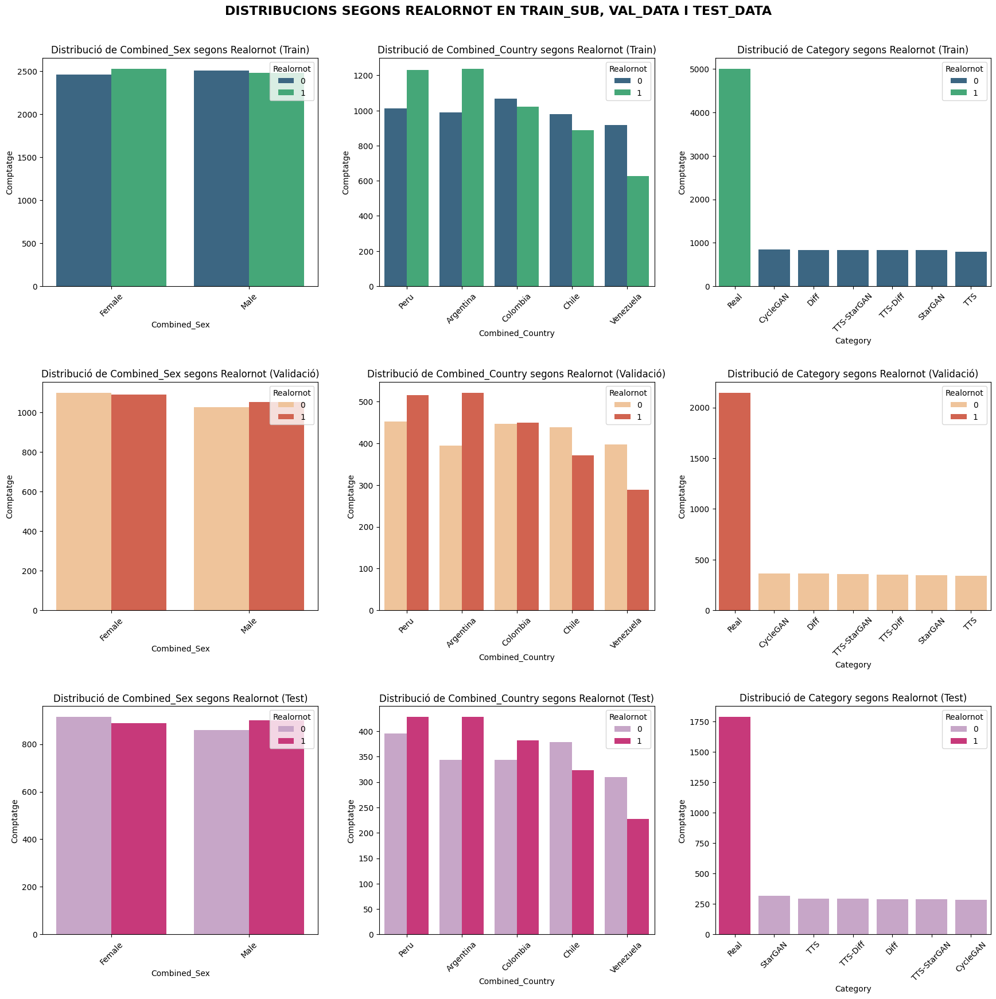

"\nPer fer una anàlisi més detallada de variables categòriques en relació amb la variable objectiu Realornot, has de seleccionar aquelles que:\n\nTinguin sentit en el context de la tasca. Variables com Combined_Sex i Combined_Country poden ser significatives, ja que podrien influir en si una veu és real o falsa.\nTinguin prou variabilitat. Evita variables amb una única categoria o molt poc variades, ja que no aporten informació útil.\nPoden mostrar diferències entre les classes de Realornot. Això és rellevant per identificar patrons o relacions significatives.\nVariables a seleccionar\nCombined_Sex:\nPer què escollir-la?\nRepresenta el sexe de les veus, una característica que pot estar relacionada amb el tipus de veu (real o falsa).\nÉs una variable categòrica amb poques categories (per exemple, Male, Female), fàcil d'interpretar.\nCombined_Country:\nPer què escollir-la?\nMostra el país de les veus i pot reflectir patrons regionals o culturals associats amb les veus reals o falses.\nTé

In [16]:
variables = ['Combined_Sex', 'Combined_Country', 'Category']

fig, axes = plt.subplots(3, 3, figsize=(18, 18))

# Primera fila: Gràfics per train_data
for i, col in enumerate(variables):
    sns.countplot(ax=axes[0, i], x=col, hue='Realornot', data=train_sub, 
                  order=train_data[col].value_counts().index, palette='viridis')
    axes[0, i].set_title(f'Distribució de {col} segons Realornot (Train)')
    axes[0, i].set_xlabel(col)
    axes[0, i].set_ylabel('Comptatge')
    axes[0, i].tick_params(axis='x', rotation=45)

# Segona fila: Gràfics per val_data
for i, col in enumerate(variables):
    sns.countplot(ax=axes[1, i], x=col, hue='Realornot', data=val_data, 
                  order=val_data[col].value_counts().index, palette='OrRd')
    axes[1, i].set_title(f'Distribució de {col} segons Realornot (Validació)')
    axes[1, i].set_xlabel(col)
    axes[1, i].set_ylabel('Comptatge')
    axes[1, i].tick_params(axis='x', rotation=45)

# Tercera fila: Gràfics per test_data
for i, col in enumerate(variables):
    sns.countplot(ax=axes[2, i], x=col, hue='Realornot', data=test_data, 
                  order=test_data[col].value_counts().index, palette='PuRd')
    axes[2, i].set_title(f'Distribució de {col} segons Realornot (Test)')
    axes[2, i].set_xlabel(col)
    axes[2, i].set_ylabel('Comptatge')
    axes[2, i].tick_params(axis='x', rotation=45)

fig.suptitle('DISTRIBUCIONS SEGONS REALORNOT EN TRAIN_SUB, VAL_DATA I TEST_DATA', fontsize=16, y=0.98, fontweight='bold')

plt.tight_layout(pad=3.0)
plt.show()

'''
Per fer una anàlisi més detallada de variables categòriques en relació amb la variable objectiu Realornot, has de seleccionar aquelles que:

Tinguin sentit en el context de la tasca. Variables com Combined_Sex i Combined_Country poden ser significatives, ja que podrien influir en si una veu és real o falsa.
Tinguin prou variabilitat. Evita variables amb una única categoria o molt poc variades, ja que no aporten informació útil.
Poden mostrar diferències entre les classes de Realornot. Això és rellevant per identificar patrons o relacions significatives.
Variables a seleccionar
Combined_Sex:
Per què escollir-la?
Representa el sexe de les veus, una característica que pot estar relacionada amb el tipus de veu (real o falsa).
És una variable categòrica amb poques categories (per exemple, Male, Female), fàcil d'interpretar.
Combined_Country:
Per què escollir-la?
Mostra el país de les veus i pot reflectir patrons regionals o culturals associats amb les veus reals o falses.
Té diverses categories, cosa que permet una anàlisi més rica.
Source_Sex i Source_Country:
Per què escollir-les?
Són variables complementàries a Combined_Sex i Combined_Country. Es pot explorar si hi ha relacions o incoherències entre les veus reals/falses segons la font d'origen.
Exemple: Potser un país concret està sobrerepresentat entre les veus falses.
'''

In [17]:
print("\n\033[1mDISTRIBUCIONS NUMÈRIQUES SEGONS REALORNOT EN TRAIN_SUB, VAL_DATA I TEST_DATA\033[0m")

for col in variables:
    print(f"\n\033[1mColumna: {col}\033[0m")
    
    # Agrupació per train_sub
    train_counts = (
        train_sub.groupby([col, 'Realornot'])
        .size()
        .unstack(fill_value=0)
        .rename(columns={0: 'Train0', 1: 'Train1'})
    )
    
    # Agrupació per test_data
    test_counts = (
        test_data.groupby([col, 'Realornot'])
        .size()
        .unstack(fill_value=0)
        .rename(columns={0: 'Test0', 1: 'Test1'})
    )
    
    # Agrupació per val_data
    val_counts = (
        val_data.groupby([col, 'Realornot'])
        .size()
        .unstack(fill_value=0)
        .rename(columns={0: 'Val0', 1: 'Val1'})
    )
    
    # Combina els tres dataframes en una única taula
    combined = pd.concat([train_counts, test_counts, val_counts], axis=1).fillna(0).astype(int)
    
    # Mostra la taula combinada
    print(combined)



DISTRIBUCIONS NUMÈRIQUES SEGONS REALORNOT EN TRAIN_SUB, VAL_DATA I TEST_DATA

Columna: Combined_Sex
Realornot     Train0  Train1  Test0  Test1  Val0  Val1
Combined_Sex                                          
Female          2458    2526    914    887  1100  1092
Male            2506    2480    859    901  1028  1053

Columna: Combined_Country
Realornot         Train0  Train1  Test0  Test1  Val0  Val1
Combined_Country                                          
Argentina            988    1238    344    428   394   521
Chile                980     887    379    323   438   371
Colombia            1069    1023    344    382   447   449
Peru                1011    1230    396    428   452   515
Venezuela            916     628    310    227   397   289

Columna: Category
Realornot    Train0  Train1  Test0  Test1  Val0  Val1
Category                                             
CycleGAN        840       0    283      0   365     0
Diff            832       0    292      0   364     0
Real

Mirem la distribució de les variables numèriques segons la variable objectiu `Realornot`.

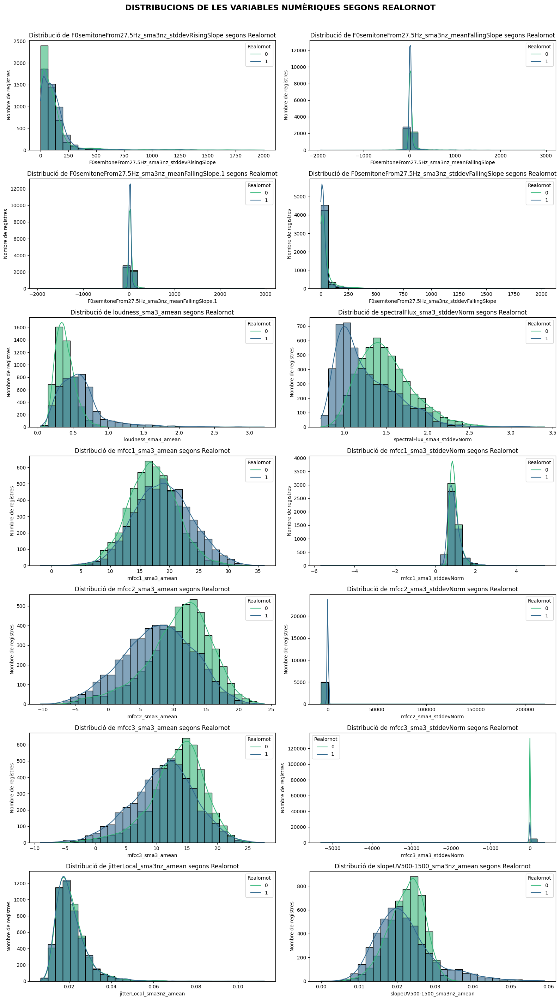

In [18]:
numerical_columns = train_sub.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns[3:17]

fig, axes = plt.subplots(7, 2, figsize=(16, 28))  
axes = axes.flatten() 

for i, col in enumerate(numerical_columns):
    sns.histplot(
        data=train_sub,
        x=col,
        hue='Realornot',
        kde=True,
        palette='viridis',
        alpha=0.6,
        bins=30,
        ax=axes[i]
    )
    axes[i].set_title(f'Distribució de {col} segons Realornot')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Nombre de registres')
    axes[i].legend(title='Realornot', labels=['0', '1'])

fig.suptitle('DISTRIBUCIONS DE LES VARIABLES NUMÈRIQUES SEGONS REALORNOT', fontsize=16, y=1.01, fontweight='bold')
plt.tight_layout()
plt.show()


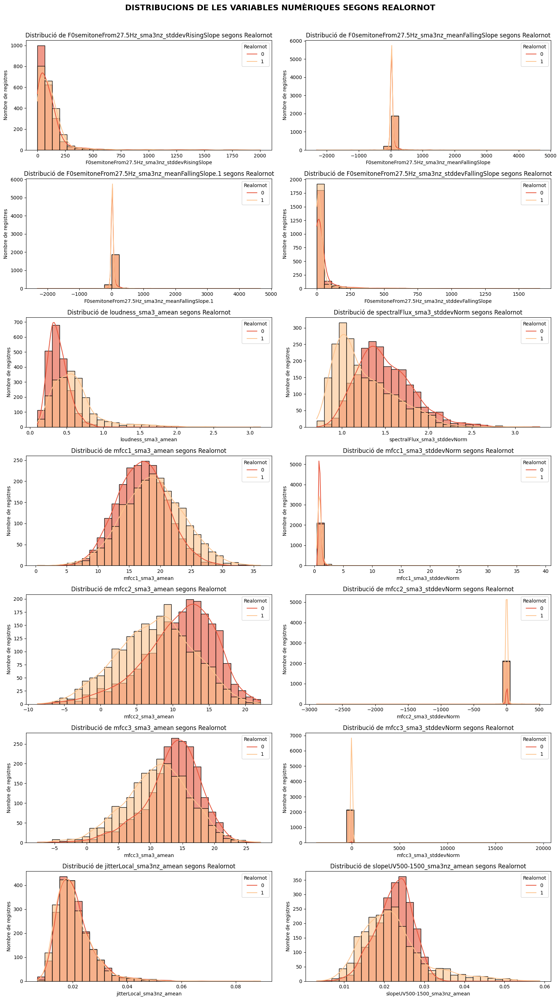

In [19]:
numerical_columns = val_data.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns[3:17]

fig, axes = plt.subplots(7, 2, figsize=(16, 28))  
axes = axes.flatten() 

for i, col in enumerate(numerical_columns):
    sns.histplot(
        data=val_data,
        x=col,
        hue='Realornot',
        kde=True,
        palette='OrRd',
        alpha=0.6,
        bins=30,
        ax=axes[i]
    )
    axes[i].set_title(f'Distribució de {col} segons Realornot')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Nombre de registres')
    axes[i].legend(title='Realornot', labels=['0', '1'])

fig.suptitle('DISTRIBUCIONS DE LES VARIABLES NUMÈRIQUES SEGONS REALORNOT', fontsize=16, y=1.01, fontweight='bold')
plt.tight_layout()
plt.show()

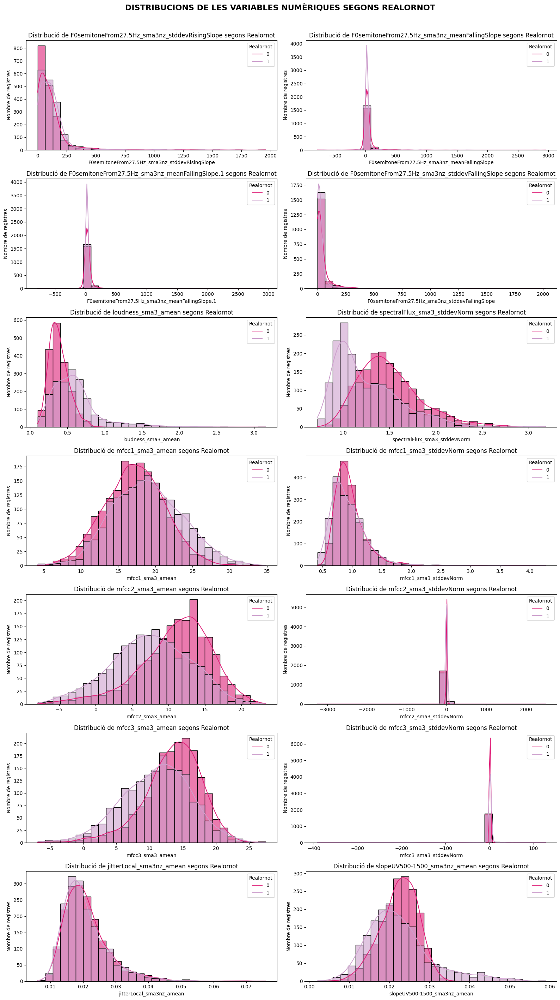

In [20]:
numerical_columns = test_data.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns[3:17]

fig, axes = plt.subplots(7, 2, figsize=(16, 28))  
axes = axes.flatten() 

for i, col in enumerate(numerical_columns):
    sns.histplot(
        data=test_data,
        x=col,
        hue='Realornot',
        kde=True,
        palette='PuRd',
        alpha=0.6,
        bins=30,
        ax=axes[i]
    )
    axes[i].set_title(f'Distribució de {col} segons Realornot')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Nombre de registres')
    axes[i].legend(title='Realornot', labels=['0', '1'])

fig.suptitle('DISTRIBUCIONS DE LES VARIABLES NUMÈRIQUES SEGONS REALORNOT', fontsize=16, y=1.01, fontweight='bold')
plt.tight_layout()
plt.show()

### 1.4. Anàlisi i Tractament de Missings i Outliers

#### 1.4.1. Anàlisi i Tractament de Missings

Els missings relacionats amb variables categòriques es troben representats com valors **NaN** en el dataset. 

Observem que en el **train_csv**, originalment, hi havia uns quants missings, però un cop havent modificat el DataFrame amb les variables combinades, observem com aquests missngs han desaparegut. Per tant, no hem d'imputar cap missing en les variables categòriques.

In [21]:
categorical_columns = train_csv.select_dtypes(include=['object', 'category']).columns

missing_values_categorical = train_csv[categorical_columns].isnull().sum()
if missing_values_categorical.any():
    print("\n\033[1mMISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES ABANS DE MODIFICAR EL DATAFRAME\033[0m\n")
    print(missing_values_categorical[missing_values_categorical > 0])
else:
    print("\033[1mNO HI HA MISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES ABANS DE MODIFICAR EL DATAFRAME\033[0m")



MISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES ABANS DE MODIFICAR EL DATAFRAME

Source_ID         10372
Target_ID          8939
Source_Sex        10372
Source_Country    10372
Target_Sex         8939
Target_Country     8939
ID                 8865
Sex                8865
Country            8865
dtype: int64


In [22]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
missing_values_categorical = df_train[categorical_columns].isnull().sum()

if missing_values_categorical.any():
    print("\033[1mMISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES DESPRÉS DE MODIFICAR EL DATAFRAME\033[0m\n")
    print(missing_values_categorical[missing_values_categorical > 0])
else:
    print("\n\033[1m NO HI HA MISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES DESPRÉS DE MODIFICAR EL DATAFRAME\033[0m")



 NO HI HA MISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES DESPRÉS DE MODIFICAR EL DATAFRAME


Els missings en les variables numèriques poden aparèixer representats com a **NaN**, però també poden estar codificats com valors atípics o inesperats, com ara 0, -1. Per aquest motiu, és crucial analitzar amb detall les variables i comprendre el seu significat per identificar els valors que poden formar part del seu domini de representació.

In [23]:
train_sub.describe()

,UniqueID,Realornot,Unnamed: 0,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,loudness_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,jitterLocal_sma3nz_amean,slopeUV500-1500_sma3nz_amean
count,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000,9970.000000
mean,48313.525075,0.502106,48293.935005,111.319083,40.458489,40.458489,43.346769,0.495234,1.385563,18.063542,0.950296,9.249655,22.525991,12.230977,0.728775,0.020980,0.022307
std,23580.689275,0.500021,23646.138866,153.826842,109.602633,109.602633,124.844511,0.278844,0.365781,4.498728,0.299778,5.379099,2204.628571,4.944548,55.046176,0.007465,0.006469
min,4.000000,0.000000,120.000000,0.000000,-1933.929300,-1933.929300,0.000000,0.041620,0.715352,-1.798633,-5.672723,-10.317350,-7098.178700,-9.022558,-5294.333500,0.006465,-0.000079
25%,29974.500000,0.000000,28750.750000,27.249571,17.208741,17.208741,8.334077,0.320740,1.096969,14.977383,0.762864,5.756119,0.803930,9.342239,0.802944,0.016081,0.018108
50%,56433.000000,1.000000,56432.000000,82.690365,24.215085,24.215085,13.245071,0.434145,1.343288,17.914537,0.898190,9.809751,1.183497,12.721884,1.067422,0.019491,0.022044
75%,67268.500000,1.000000,67267.500000,141.748690,35.376104,35.376104,25.670986,0.593516,1.610221,21.022514,1.068124,13.217399,1.961444,15.668128,1.511905,0.024086,0.025736
max,80810.000000,1.000000,80809.000000,2005.566500,2964.744000,2964.744000,2027.281900,3.204929,3.401293,36.043198,5.413955,23.924866,219881.690000,27.686117,372.812350,0.112440,0.058923


La mitjana pot pendre qualsevol valor real, però la desviació estàndard ha de pendre valors més grans o iguals a zero (**excepte quan aquesta està normalitzada, en aquest cas pot pendre qualsevol valor real**). Per tant, cal mirar que:

- No hi hagi valors menors a zero en aquelles variables que representin una desviació estàndard **no** normalitzada
- Variables que hi hagi un nombre elevat de zeros, ja que aquests podrien ser missings

In [24]:
print("\n\033[1mVARIABLES AMB VALORS NEGATIUS:\033[0m")
for col in numeric_colums:
    count = (train_sub[col] < 0).sum()
    if count > 0:
        print(f'{col}: {count}')

print("\n\033[1mVARIABLES AMB VALORS ZERO:\033[0m")
for col in numeric_colums:
    count_zeros = (train_sub[col] == 0).sum()
    if count_zeros > 0:
        print(f'{col}: {count_zeros}')



VARIABLES AMB VALORS NEGATIUS:
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope: 331
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1: 331
mfcc1_sma3_amean: 1
mfcc1_sma3_stddevNorm: 1
mfcc2_sma3_amean: 610
mfcc2_sma3_stddevNorm: 610
mfcc3_sma3_amean: 162
mfcc3_sma3_stddevNorm: 162
slopeUV500-1500_sma3nz_amean: 1

VARIABLES AMB VALORS ZERO:
F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope: 89
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope: 1
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1: 1
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope: 265


Observem que cap dels valors negatius que trobem en el dataset pertany a una desviació estàndard no normalitzada, per tant, cap d'ells és un missing (o un valor no vàlid). D'altra banda, hem trobat que tant la variable `F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope` com la variable `F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope` contenen una quantitat notable de zeros, per tant, es poden considerar valors perduts i és necessari imputar-los.

**Imputarem per la mediana**, ja que la mediana és menys sensible als valors extrems i pot ser millor opció que la mitjana o la moda per a dades amb distribucions asimètriques.

In [25]:
columns_to_impute = ['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope','F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope']

for col in columns_to_impute:
    median_value = train_sub[col][train_sub[col] != 0].median()
    
    train_sub[col] = train_sub[col].replace(0, median_value)
    print(f"Imputem '{col}' amb la mediana: {median_value}")


Imputem 'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope' amb la mediana: 83.65197
Imputem 'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope' amb la mediana: 13.600735


A continuació, aplicarem el mateix procés d’anàlisi amb els conjunts **val_data** i **test_data** per verificar si existeixen patrons similars de missings als que hem trobat en el **train_sub**. D'aquesta forma ens assegurem que el tractament aplicat és consistent en tots els conjunts de dades.

In [26]:
print('\n\033[1;4mCONJUNT DE VALIDACIÓ\033[0m')
print("\033[1mVARIABLES AMB VALORS NEGATIUS:\033[0m")

for col in numeric_colums:
    count = (val_data[col] < 0).sum()
    if count > 0:
        print(f'{col}: {count}')

print("\n\033[1mVARIABLES AMB VALORS ZERO:\033[0m")
for col in numeric_colums:
    count_zeros = (val_data[col] == 0).sum()
    if count_zeros > 0:
        print(f'{col}: {count_zeros}')

print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print("\033[1mVARIABLES AMB VALORS NEGATIUS:\033[0m")

for col in numeric_colums:
    count = (test_data[col] < 0).sum()
    if count > 0:
        print(f'{col}: {count}')

print("\n\033[1mVARIABLES AMB VALORS ZERO:\033[0m")
for col in numeric_colums:
    count_zeros = (test_data[col] == 0).sum()
    if count_zeros > 0:
        print(f'{col}: {count_zeros}')


CONJUNT DE VALIDACIÓ
VARIABLES AMB VALORS NEGATIUS:
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope: 139
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1: 139
mfcc2_sma3_amean: 244
mfcc2_sma3_stddevNorm: 244
mfcc3_sma3_amean: 53
mfcc3_sma3_stddevNorm: 53

VARIABLES AMB VALORS ZERO:
F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope: 30
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope: 105

CONJUNT DE TEST
VARIABLES AMB VALORS NEGATIUS:
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope: 111
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1: 111
mfcc2_sma3_amean: 223
mfcc2_sma3_stddevNorm: 223
mfcc3_sma3_amean: 52
mfcc3_sma3_stddevNorm: 52

VARIABLES AMB VALORS ZERO:
F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope: 29
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope: 85


In [27]:
columns_to_impute = ['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope','F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope']
median1 = 83.65197
median2 = 13.600735

val_data['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope'] = val_data['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope'].replace(0, median1)
val_data['F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope'] = val_data['F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope'].replace(0, median2)

test_data['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope'] = test_data['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope'].replace(0, median1)
test_data['F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope'] = test_data['F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope'].replace(0, median2)

In [28]:
# Comprovem que la imputació s'hagi fet correctament:
print('\n\033[1;4mCONJUNT DE TRAIN\033[0m')
print("\033[1mVALORS ZERO EN LES VARIABLES IMPUTADES (TRAIN):\033[0m")
for col in columns_to_impute:
    count_zeros = train_sub[col].value_counts().get(0, 0)
    if count_zeros > 0:
        print(f"'{col}': {count_zeros}")
    else:
        print(f"'{col}': no hi ha zeros, imputació correcta")

print('\n\033[1;4mCONJUNT DE VALIDACIÓ\033[0m')
print("\033[1mVALORS ZERO EN LES VARIABLES IMPUTADES (VAL):\033[0m")
for col in columns_to_impute:
    count_zeros = val_data[col].value_counts().get(0, 0)
    if count_zeros > 0:
        print(f"'{col}': {count_zeros}")
    else:
        print(f"'{col}': no hi ha zeros, imputació correcta")

print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print("\033[1mVALORS ZERO EN LES VARIABLES IMPUTADES (TEST):\033[0m")
for col in columns_to_impute:
    count_zeros = test_data[col].value_counts().get(0, 0)
    if count_zeros > 0:
        print(f"'{col}': {count_zeros}")
    else:
        print(f"'{col}': no hi ha zeros, imputació correcta")



CONJUNT DE TRAIN
VALORS ZERO EN LES VARIABLES IMPUTADES (TRAIN):
'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': no hi ha zeros, imputació correcta
'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': no hi ha zeros, imputació correcta

CONJUNT DE VALIDACIÓ
VALORS ZERO EN LES VARIABLES IMPUTADES (VAL):
'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': no hi ha zeros, imputació correcta
'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': no hi ha zeros, imputació correcta

CONJUNT DE TEST
VALORS ZERO EN LES VARIABLES IMPUTADES (TEST):
'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': no hi ha zeros, imputació correcta
'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': no hi ha zeros, imputació correcta


#### 1.4.2. Anàlisi i Tractament d'Outliers

Per tal d'identificar si hi ha outliers en el dataset (**train_sub**) utilitzem el mètode del Rang Interquartílic (IQR).

In [29]:
numeric_colums = [feature for feature in train_sub.columns if train_sub[feature].dtypes != 'object']
numeric_colums= numeric_colums[3:]

def detect_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    is_outlier = (column < (Q1 - 1.5 * IQR)) | (column > (Q3 + 1.5 * IQR))
    return is_outlier

outliers = train_sub[numeric_colums].apply(detect_outliers_iqr, axis=0)

outliers_summary = outliers.sum()

print('\n\033[1;4mCONJUNT DE TRAIN\033[0m')
print("\033[1mRESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:\033[0m\n")
print(outliers_summary)



CONJUNT DE TRAIN
RESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:

F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope      398
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope      1291
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1    1291
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope    1470
loudness_sma3_amean                                444
spectralFlux_sma3_stddevNorm                       116
mfcc1_sma3_amean                                    79
mfcc1_sma3_stddevNorm                              377
mfcc2_sma3_amean                                    36
mfcc2_sma3_stddevNorm                             1643
mfcc3_sma3_amean                                   157
mfcc3_sma3_stddevNorm                             1030
jitterLocal_sma3nz_amean                           397
slopeUV500-1500_sma3nz_amean                       293
dtype: int64


De les variables numèriques que hem trobat outliers, fem una representació gràfica de la seva distribució (de com és amb els oultliers i un havent-los tret).

Per tractar aquests outliers s'utilitzarà, per a totes les variables, el **mètode del IQR**, tot i haver algunes variables que podrien semblar que segueixen una exponencial (per tant, per aquestes potser no funcionarà tant bé com amb les que sí que segueixen una distribució normal).

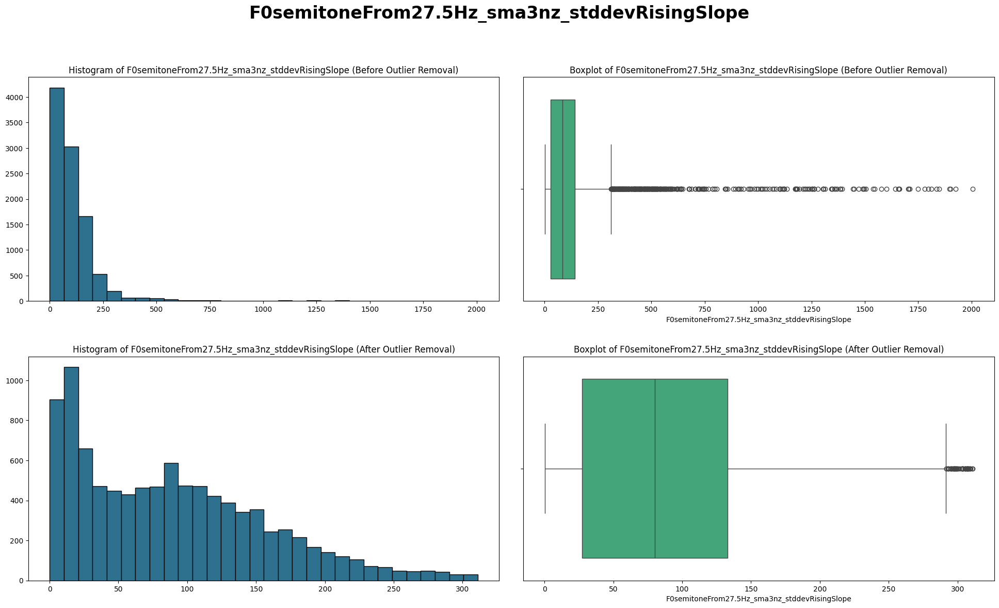

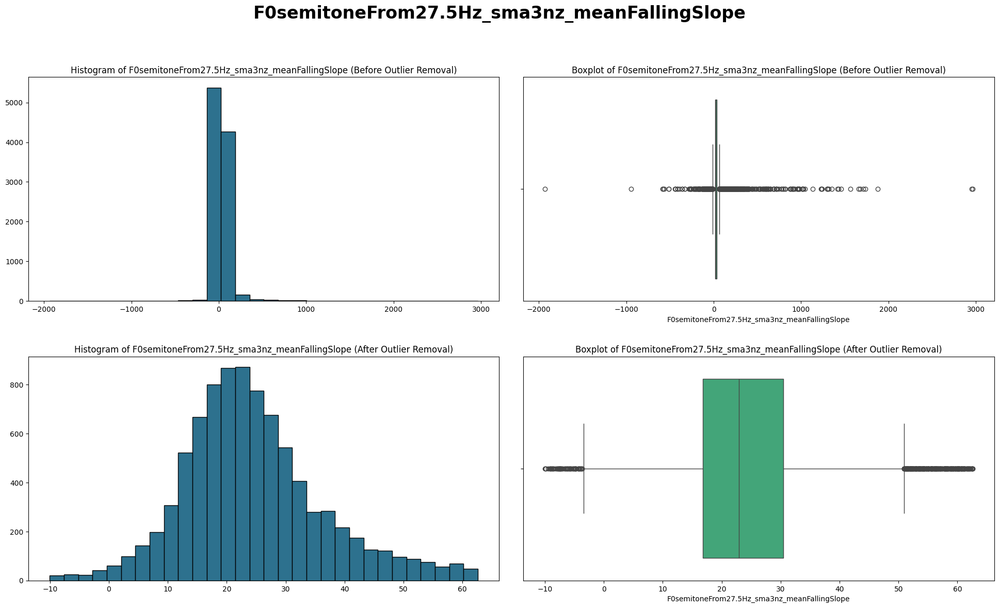

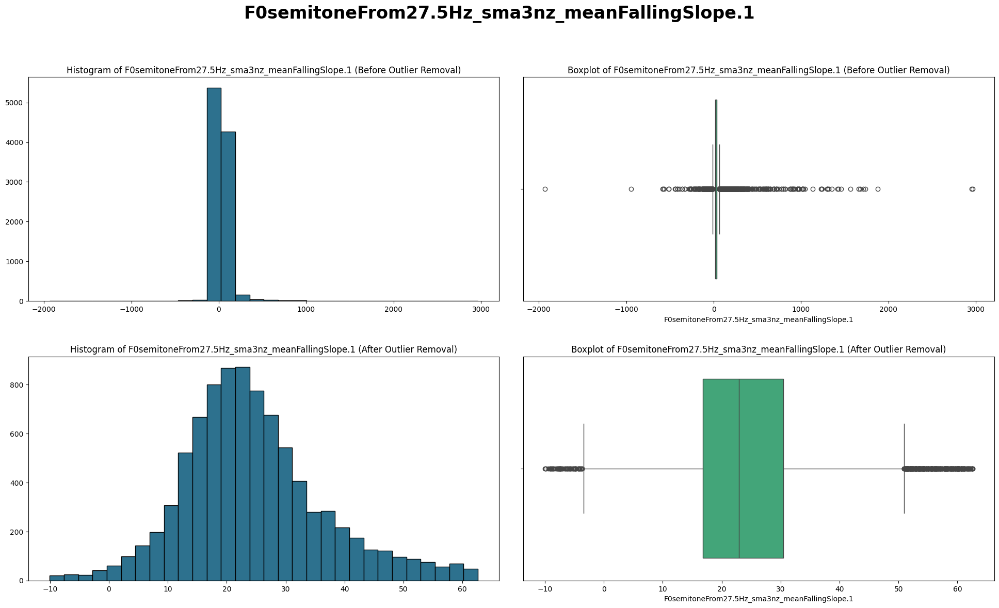

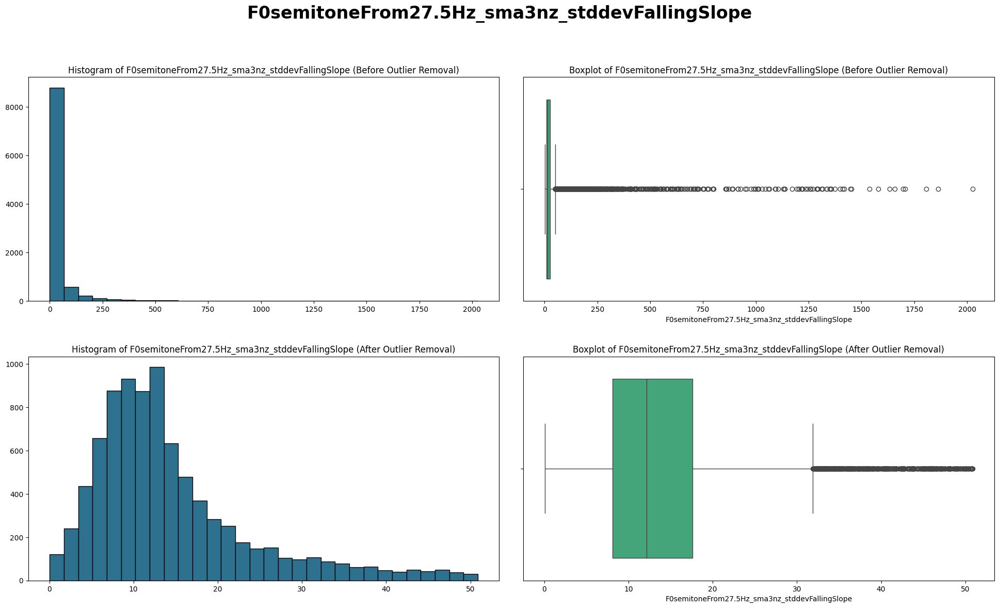

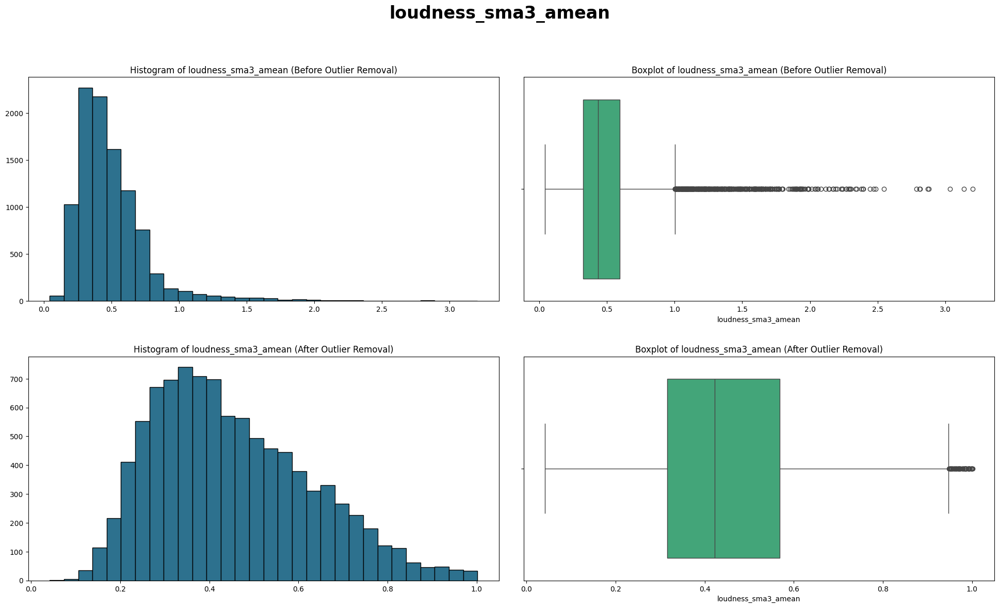

...

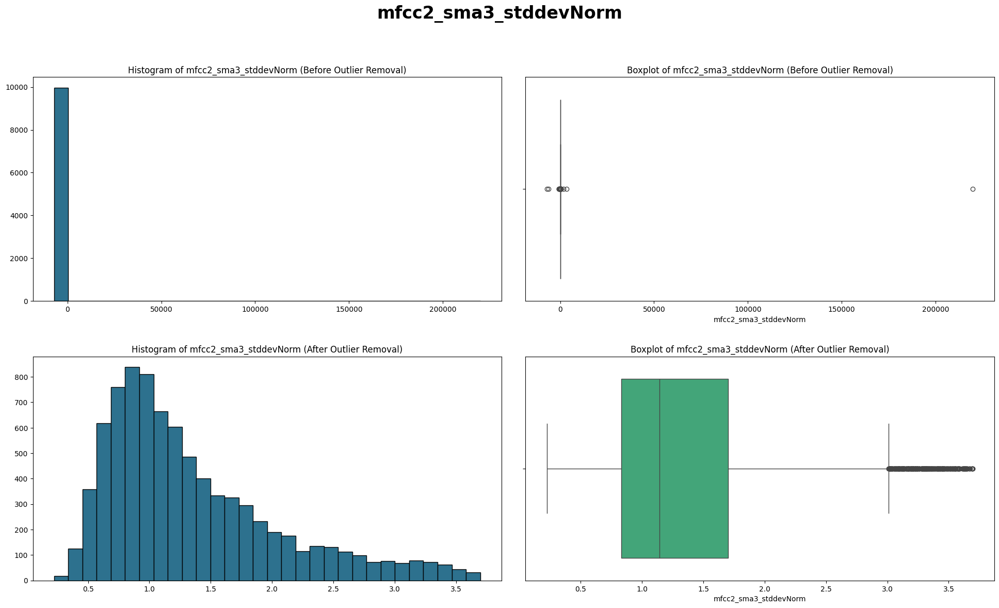

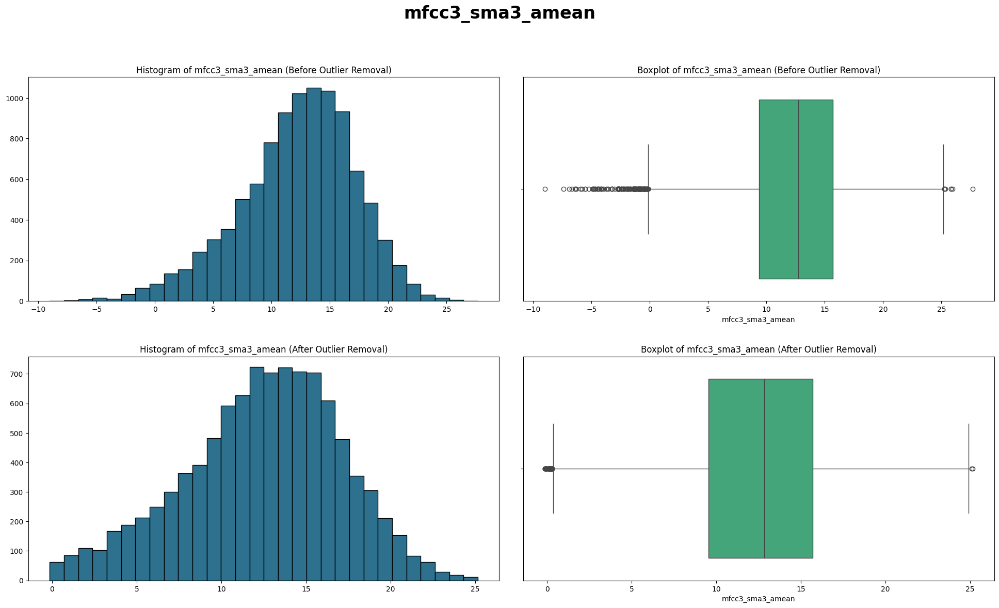

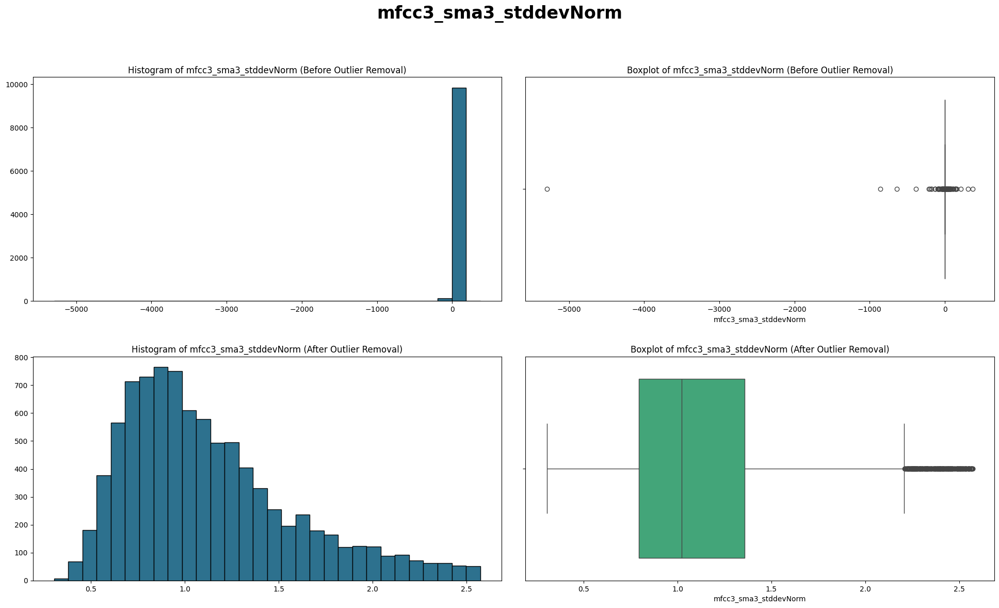

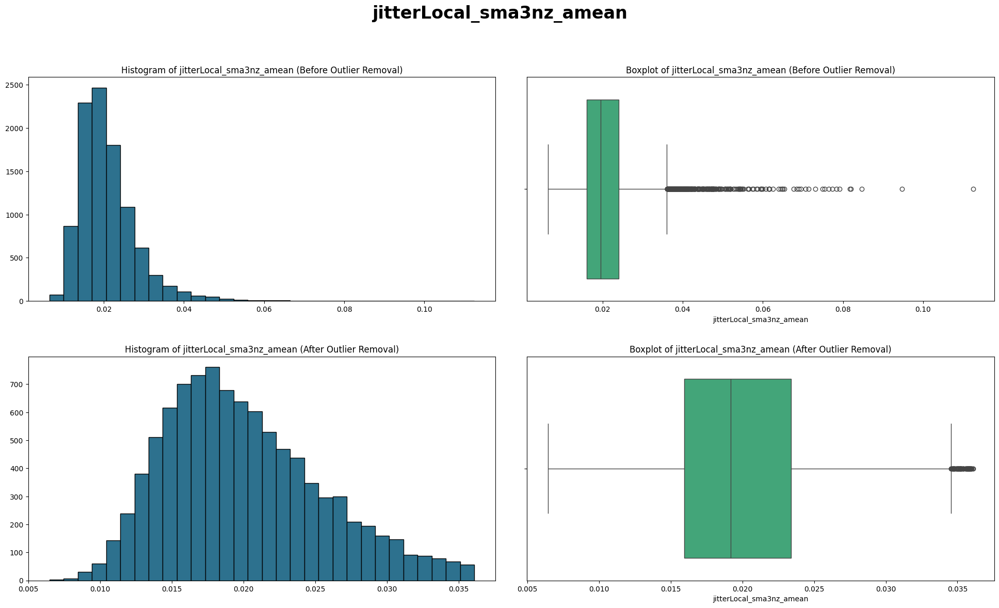

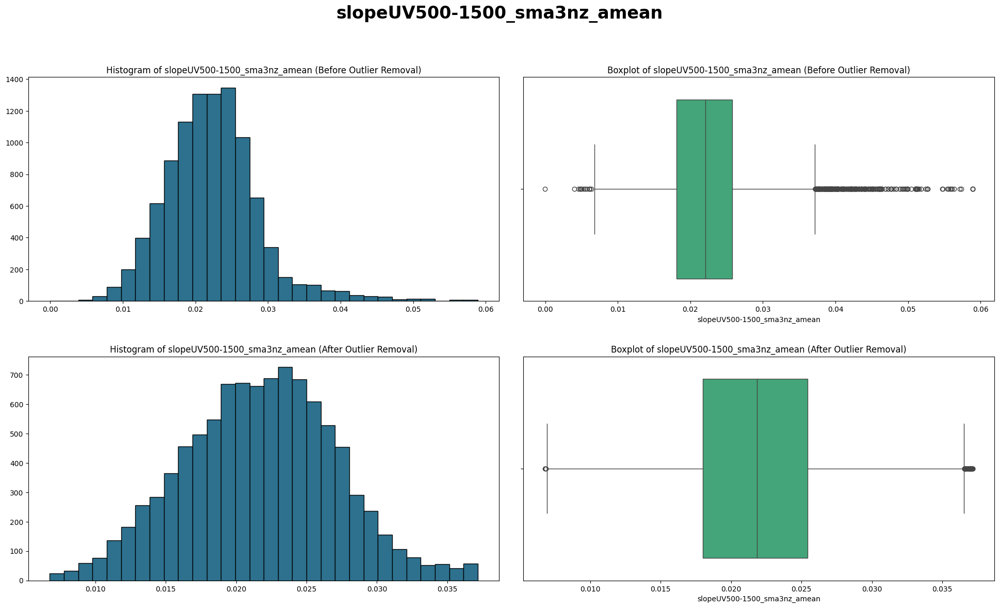

In [30]:
print('\n')
for column in numeric_colums:
    plt.figure(figsize=(20, 12))
    
    plt.suptitle(f'{column}', fontsize=24, fontweight='bold', y=1, ha='center')
    
    # 1. Histograma abans d'eliminar outliers
    plt.subplot(2, 2, 1)
    plt.hist(train_sub[column], bins=30, color=c, edgecolor='black')
    plt.title(f'Histogram of {column} (Before Outlier Removal)')
    
    # 2. Boxplot abans d'eliminar outliers
    plt.subplot(2, 2, 2)
    sns.boxplot(x=train_sub[column], color=c1)
    plt.title(f'Boxplot of {column} (Before Outlier Removal)')
    
    Q1 = train_sub[column].quantile(0.25)
    Q3 = train_sub[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    train_sub_sense_outliers = train_sub[(train_sub[column] >= lower_bound) & (train_sub[column] <= upper_bound)]
    
    # 3. Histograma després d'eliminar outliers
    plt.subplot(2, 2, 3)
    plt.hist(train_sub_sense_outliers[column], bins=30, color=c, edgecolor='black')
    plt.title(f'Histogram of {column} (After Outlier Removal)')
    
    # 4. Boxplot després d'eliminar outliers
    plt.subplot(2, 2, 4)
    sns.boxplot(x=train_sub_sense_outliers[column], color=c1)
    plt.title(f'Boxplot of {column} (After Outlier Removal)')
    
    plt.tight_layout(pad=3)
    plt.show()
    

També cap imputar els outliers de **test_data** i **val_data**. Per tal de d'imputar aquests outliers ho hem de fer amb el train. Per tant, fem el mateix que hem fet amb el train, mirem quines variables tenen outliers, i a la hora d'imputar-los ara els imputarem utilitzant el train. 

In [31]:
numeric_colums = [feature for feature in train_data.columns if train_data[feature].dtypes != 'object']
numeric_colums= numeric_colums[3:]

def detect_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    is_outlier = (column < (Q1 - 1.5 * IQR)) | (column > (Q3 + 1.5 * IQR))
    return is_outlier

outliers = test_data[numeric_colums].apply(detect_outliers_iqr, axis=0)

outliers_summary = outliers.sum()

print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print("\033[1mRESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:\033[0m\n")
print(outliers_summary)


CONJUNT DE TEST
RESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:

F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope     160
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope      470
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1    470
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope    529
loudness_sma3_amean                               156
spectralFlux_sma3_stddevNorm                       62
mfcc1_sma3_amean                                   32
mfcc1_sma3_stddevNorm                             104
mfcc2_sma3_amean                                   15
mfcc2_sma3_stddevNorm                             559
mfcc3_sma3_amean                                   49
mfcc3_sma3_stddevNorm                             352
jitterLocal_sma3nz_amean                          148
slopeUV500-1500_sma3nz_amean                      107
dtype: int64


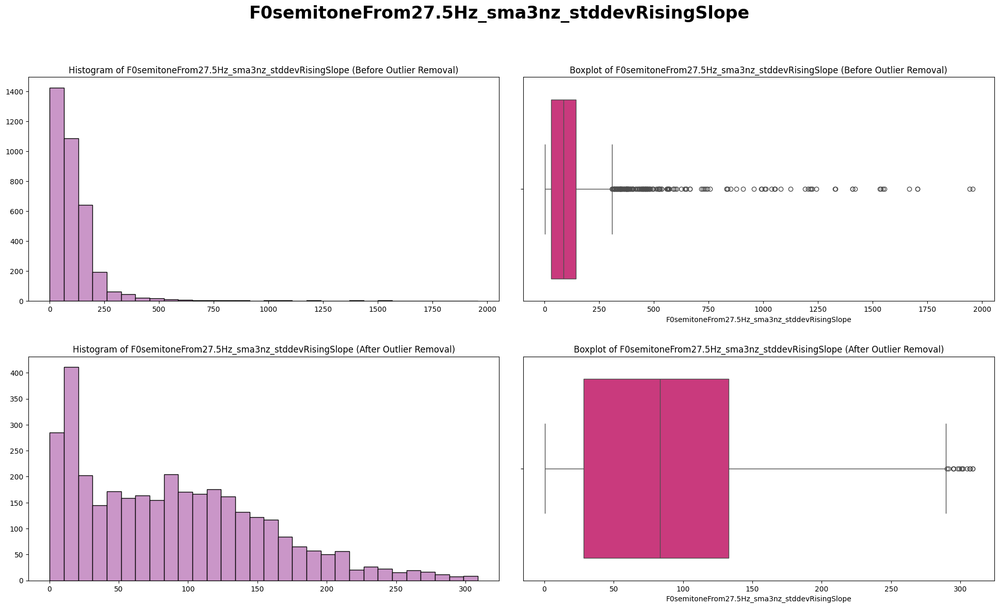

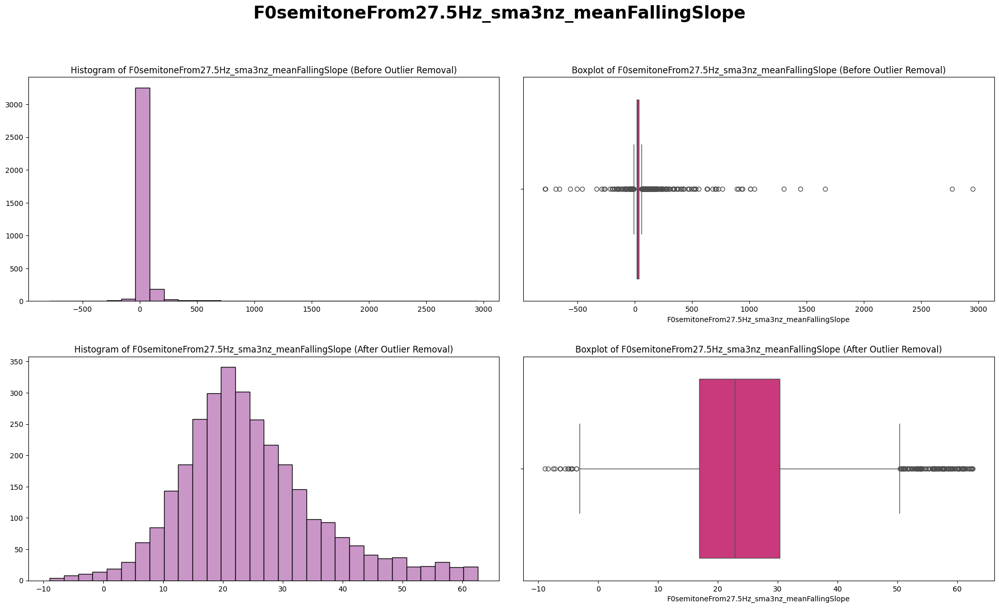

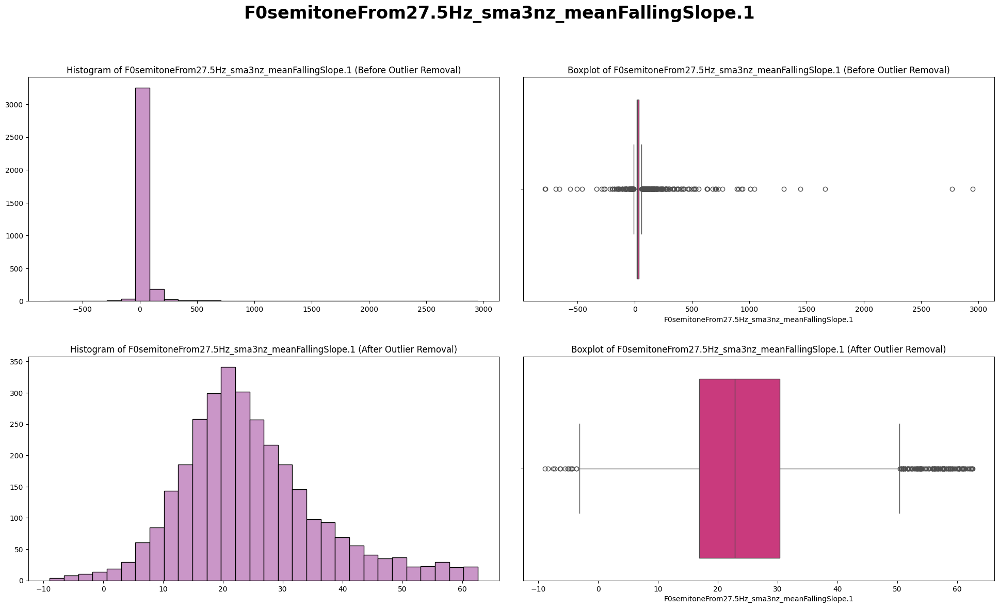

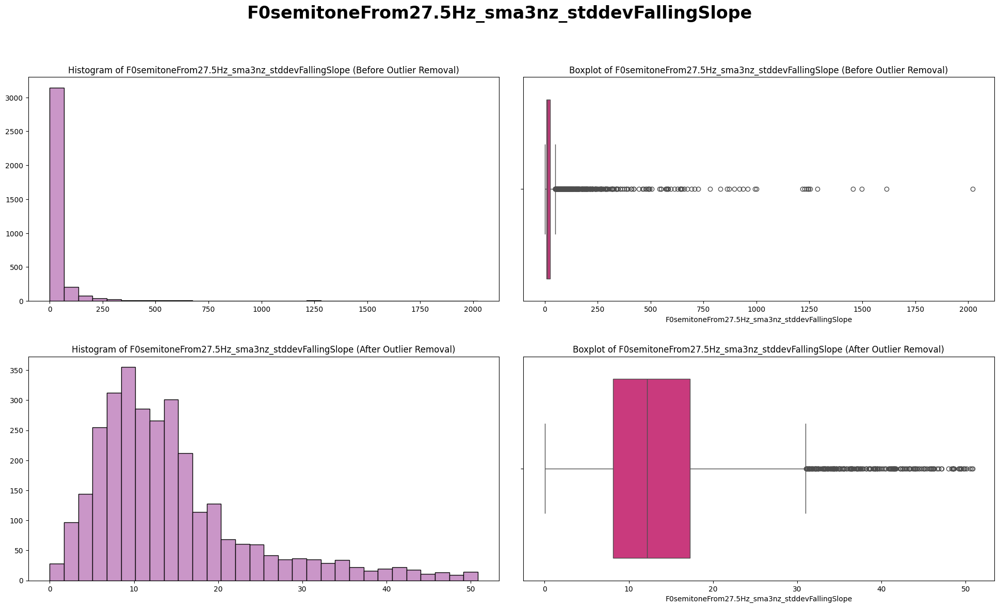

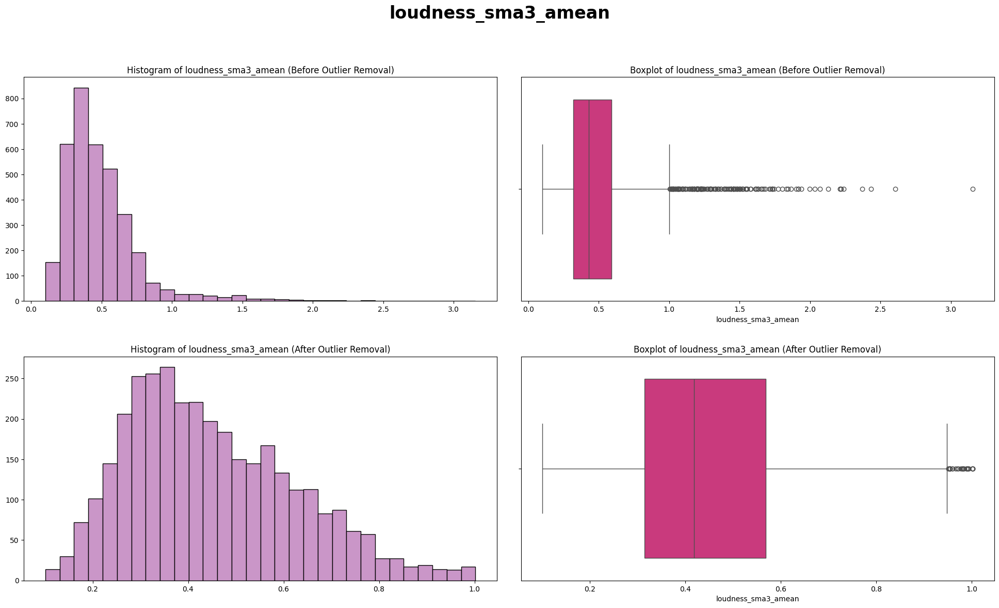

...

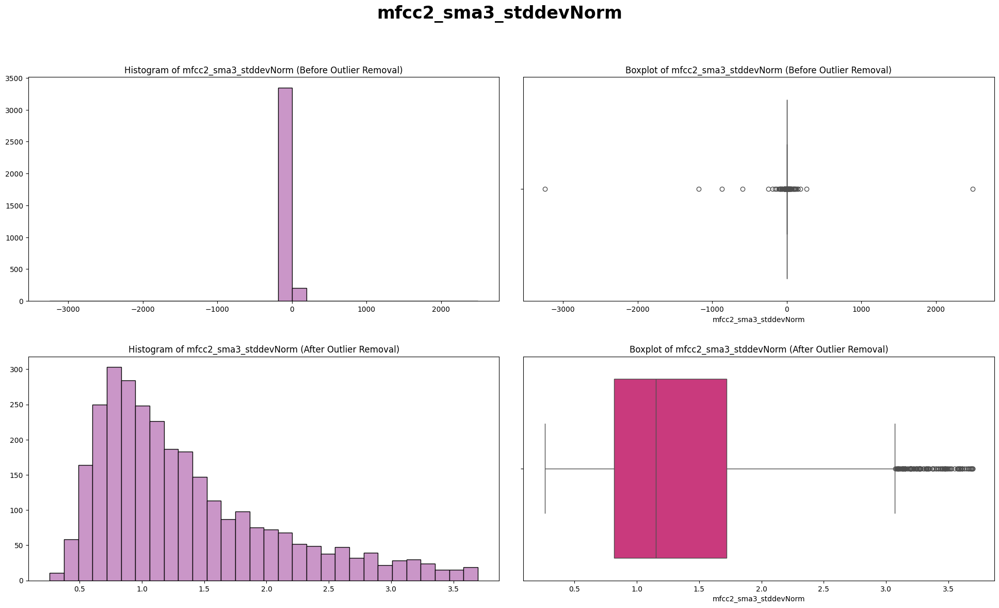

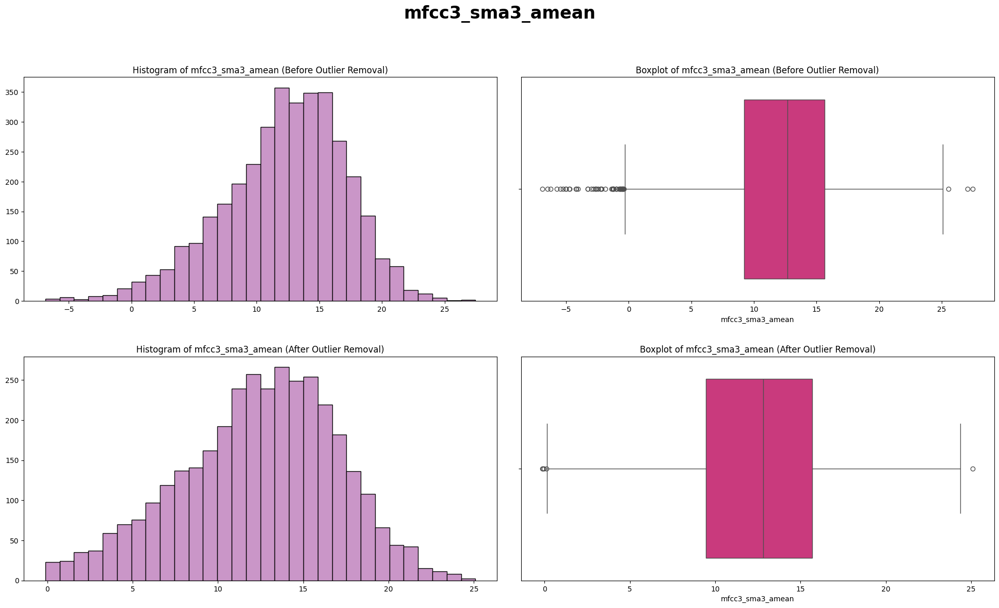

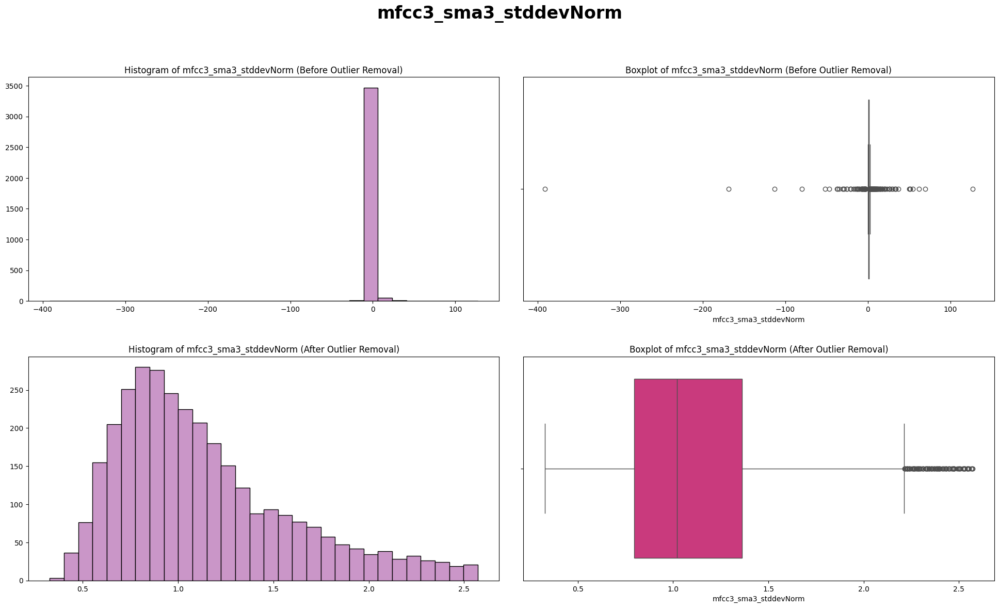

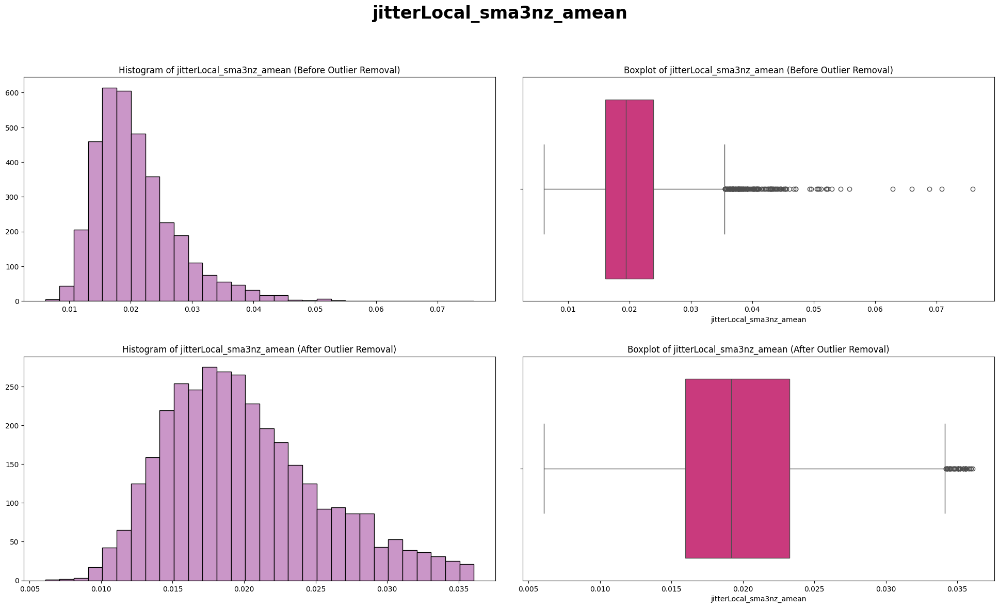

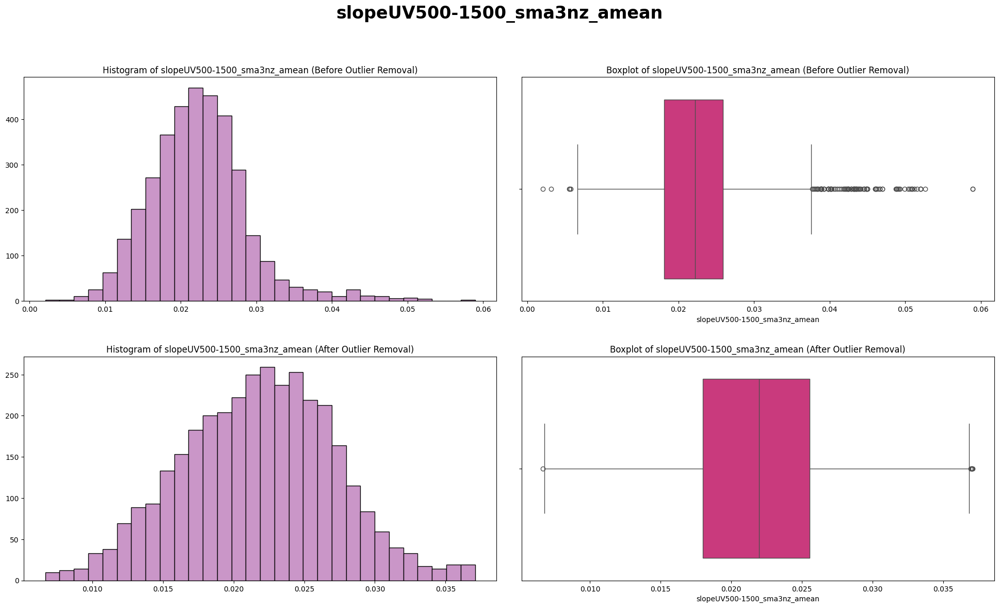

In [32]:
c4 = cm.PuRd(0.37)
c5 = cm.PuRd(0.66)

print('\n')
for column in numeric_colums:
    plt.figure(figsize=(20, 12))
   
    plt.suptitle(f'{column}', fontsize=24, fontweight='bold', y=1, ha='center')
   
    # 1. Histograma abans d'eliminar outliers
    plt.subplot(2, 2, 1)
    plt.hist(test_data[column], bins=30, color=c4, edgecolor='black')
    plt.title(f'Histogram of {column} (Before Outlier Removal)')
   
    # 2. Boxplot abans d'eliminar outliers
    plt.subplot(2, 2, 2)
    sns.boxplot(x=test_data[column], color=c5)
    plt.title(f'Boxplot of {column} (Before Outlier Removal)')
   
    Q1 = train_sub[column].quantile(0.25)
    Q3 = train_sub[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    test_data_sense_outliers = test_data[(test_data[column] >= lower_bound) & (test_data[column] <= upper_bound)]

    # 3. Histograma després d'eliminar outliers
    plt.subplot(2, 2, 3)
    plt.hist(test_data_sense_outliers[column], bins=30, color=c4, edgecolor='black')
    plt.title(f'Histogram of {column} (After Outlier Removal)')
   
    # 4. Boxplot després d'eliminar outliers
    plt.subplot(2, 2, 4)
    sns.boxplot(x=test_data_sense_outliers[column], color=c5)
    plt.title(f'Boxplot of {column} (After Outlier Removal)')
   
    plt.tight_layout(pad=3)
    plt.show()

In [33]:
numeric_colums = [feature for feature in train_data.columns if train_data[feature].dtypes != 'object']
numeric_colums= numeric_colums[3:]

def detect_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    is_outlier = (column < (Q1 - 1.5 * IQR)) | (column > (Q3 + 1.5 * IQR))
    return is_outlier

outliers = test_data[numeric_colums].apply(detect_outliers_iqr, axis=0)

outliers_summary = outliers.sum()

print('\n\033[1;4mCONJUNT DE VALIDACIÓ\033[0m')
print("\033[1mRESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:\033[0m\n")
print(outliers_summary)


CONJUNT DE VALIDACIÓ
RESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:

F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope     160
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope      470
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1    470
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope    529
loudness_sma3_amean                               156
spectralFlux_sma3_stddevNorm                       62
mfcc1_sma3_amean                                   32
mfcc1_sma3_stddevNorm                             104
mfcc2_sma3_amean                                   15
mfcc2_sma3_stddevNorm                             559
mfcc3_sma3_amean                                   49
mfcc3_sma3_stddevNorm                             352
jitterLocal_sma3nz_amean                          148
slopeUV500-1500_sma3nz_amean                      107
dtype: int64


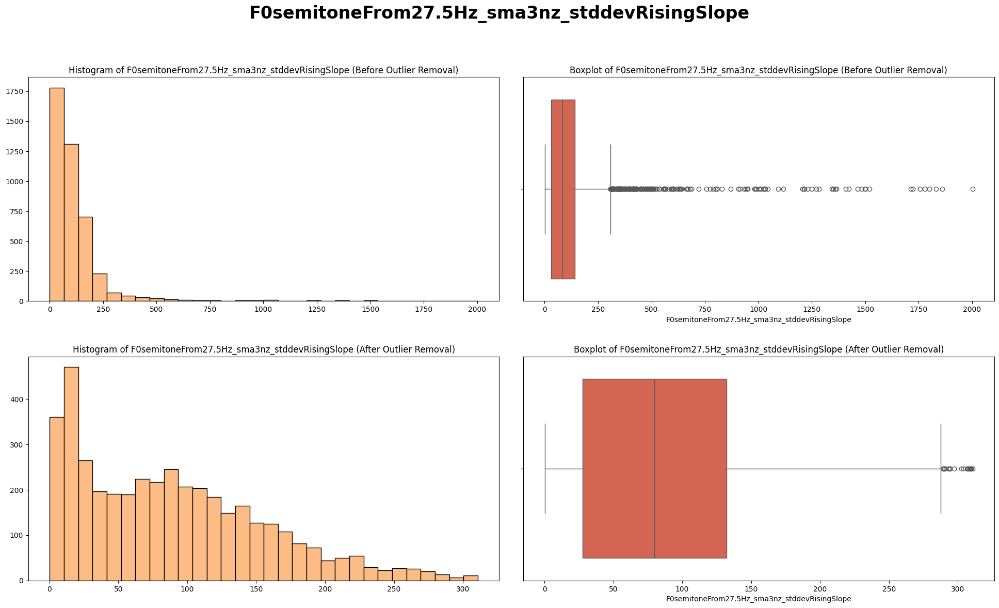

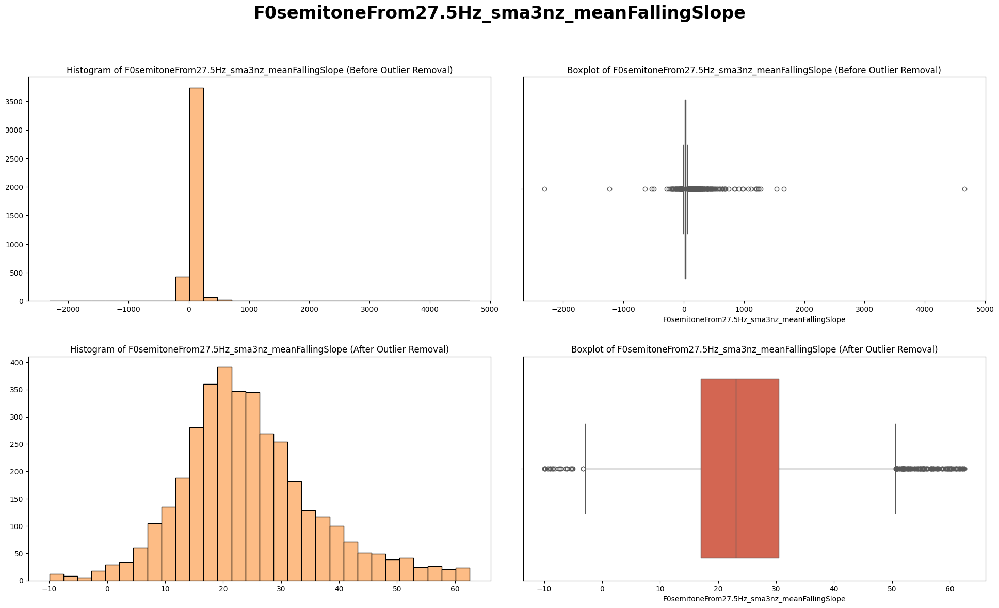

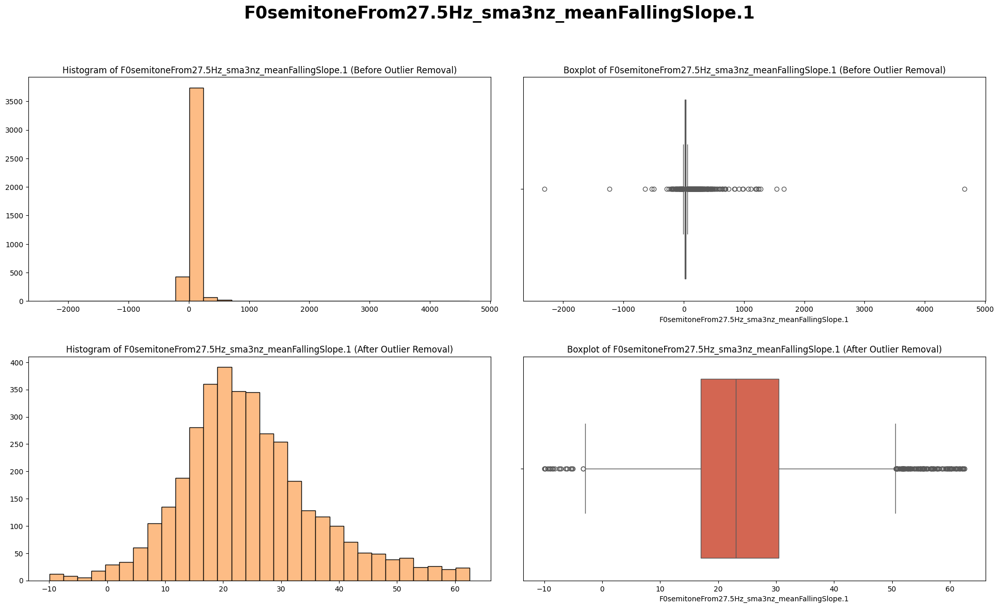

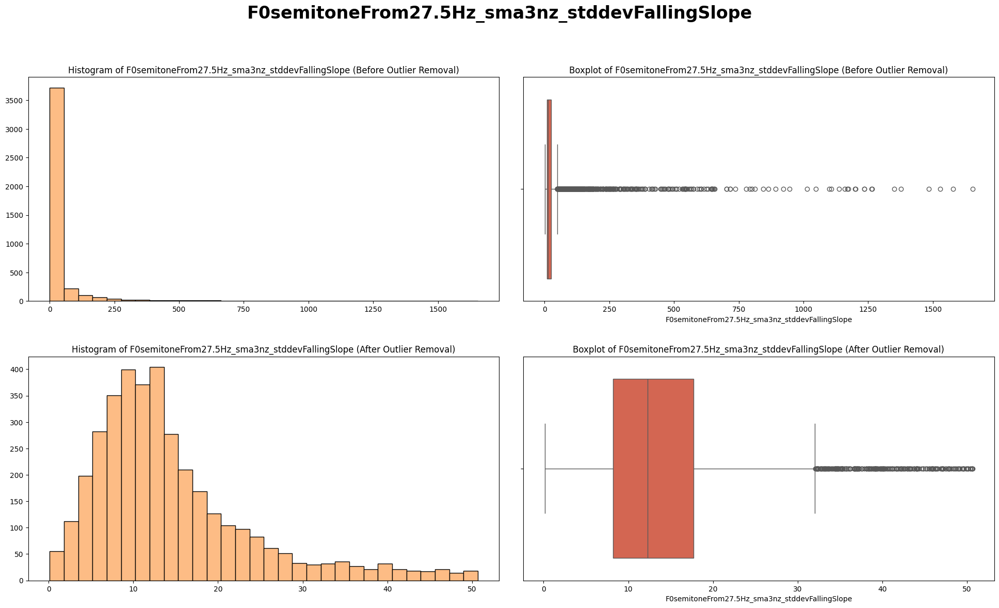

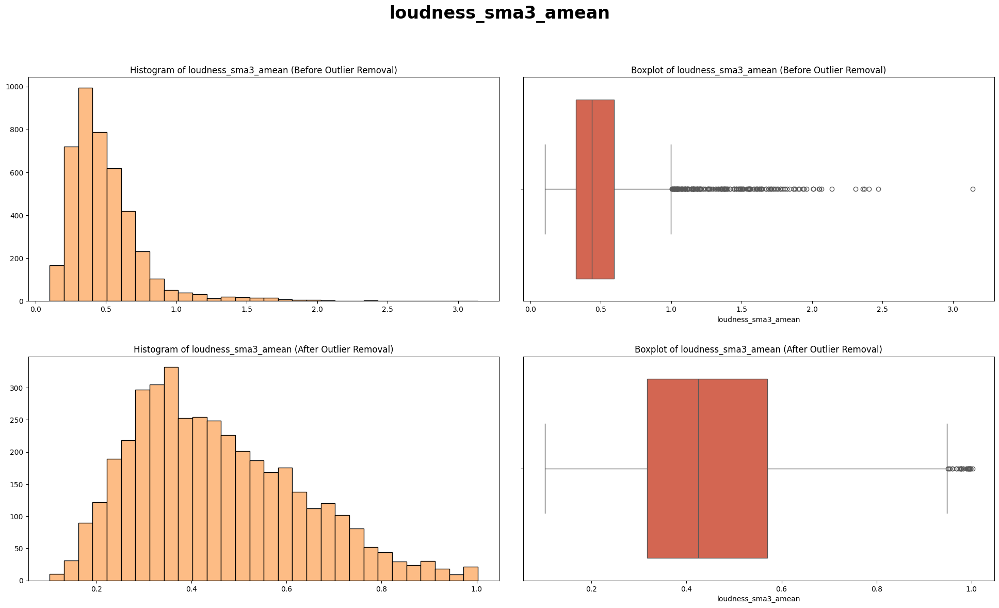

...

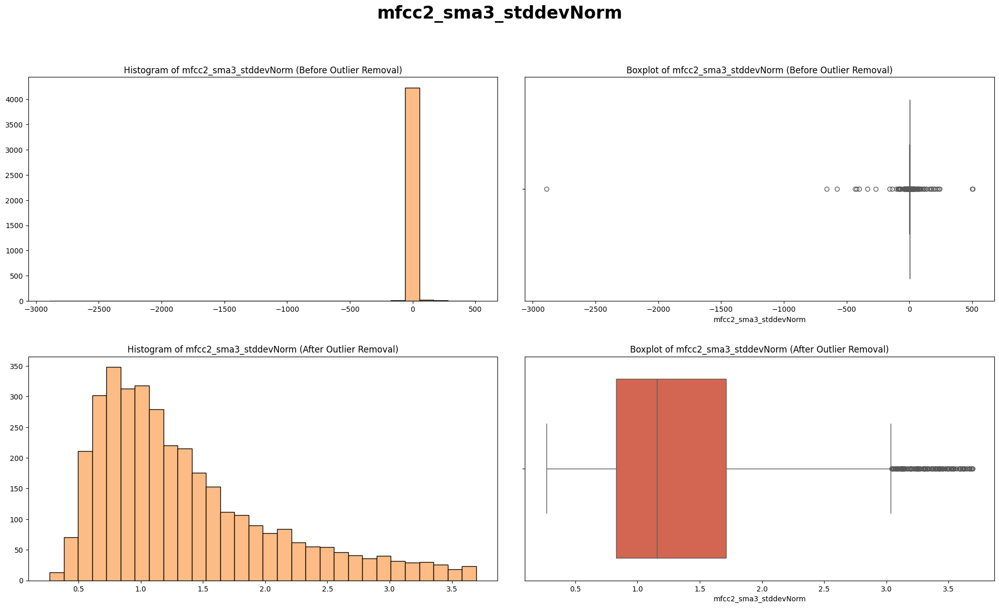

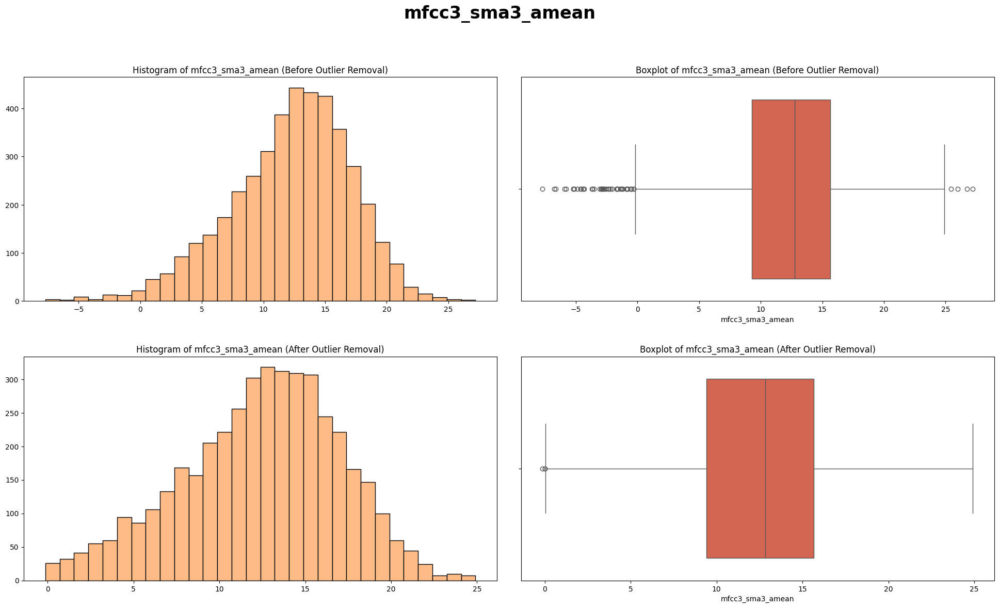

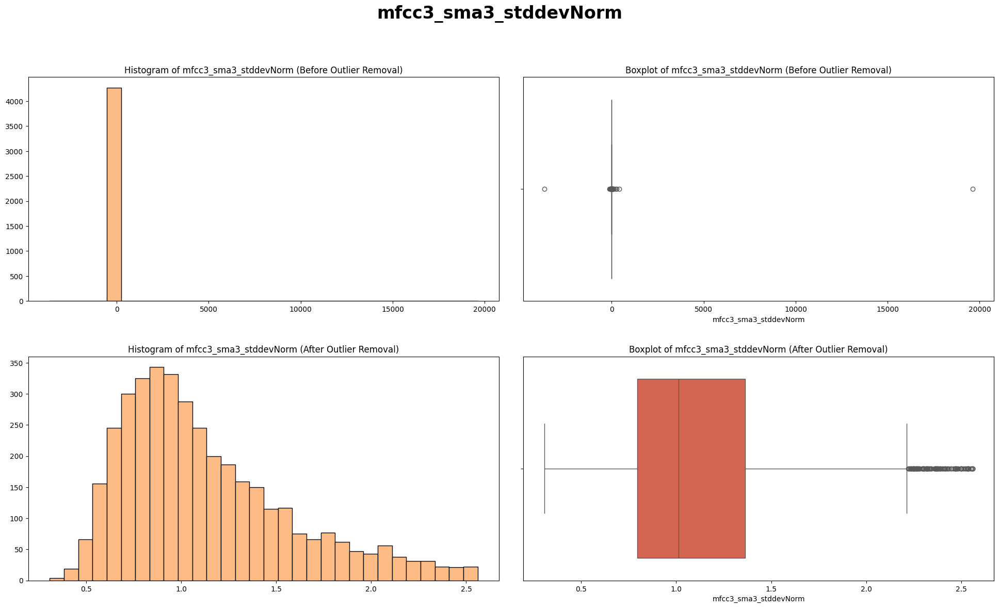

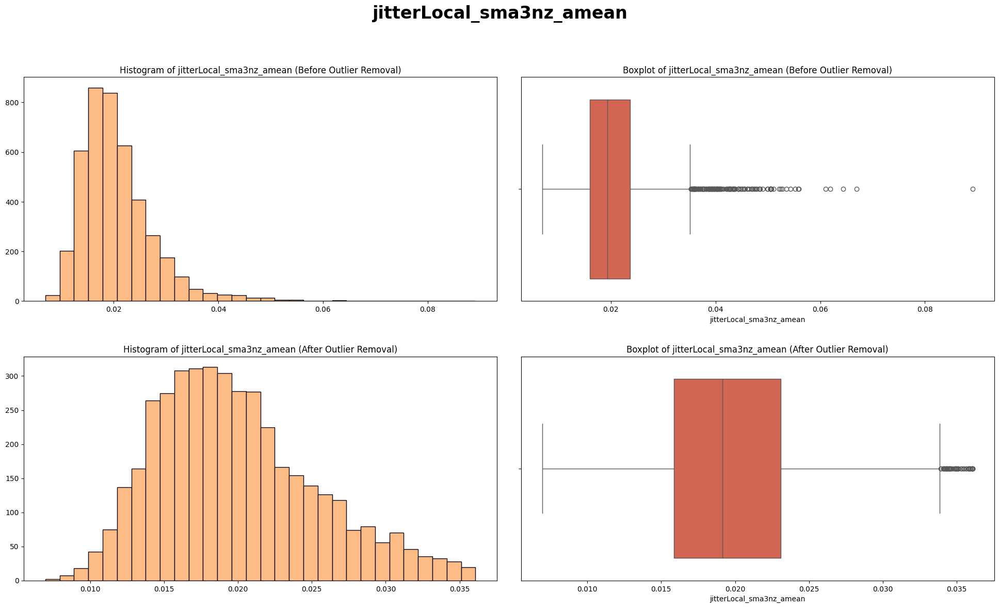

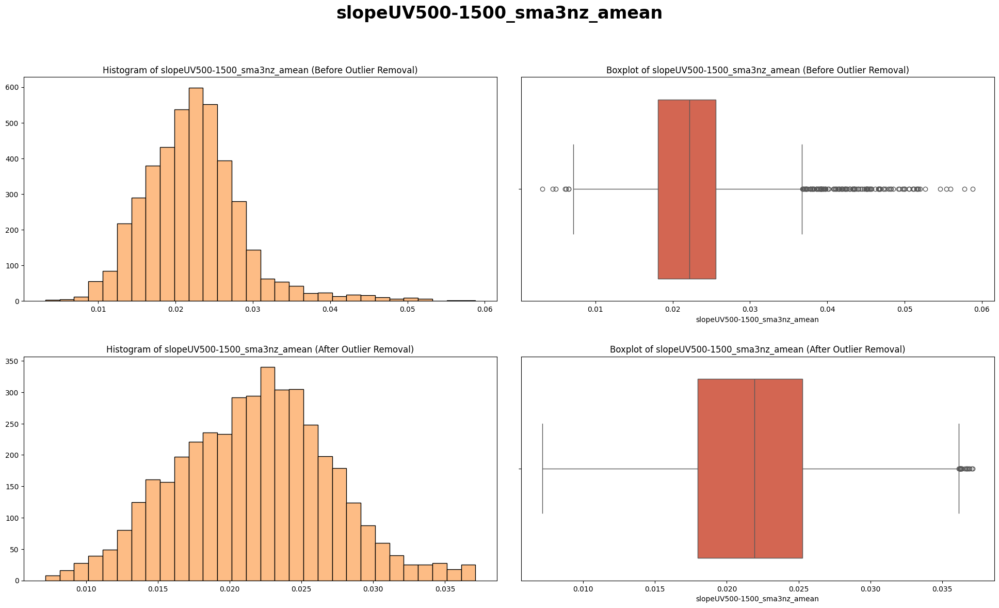

In [34]:
c2 = cm.OrRd(0.37)
c3 = cm.OrRd(0.66)

print('\n')
for column in numeric_colums:
    plt.figure(figsize=(20, 12))
   
    plt.suptitle(f'{column}', fontsize=24, fontweight='bold', y=1, ha='center')
   
    # 1. Histograma abans d'eliminar outliers
    plt.subplot(2, 2, 1)
    plt.hist(val_data[column], bins=30, color=c2, edgecolor='black')
    plt.title(f'Histogram of {column} (Before Outlier Removal)')
   
    # 2. Boxplot abans d'eliminar outliers
    plt.subplot(2, 2, 2)
    sns.boxplot(x=val_data[column], color=c3)
    plt.title(f'Boxplot of {column} (Before Outlier Removal)')
   
    Q1 = train_sub[column].quantile(0.25)
    Q3 = train_sub[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    val_data_sense_outliers = val_data[(val_data[column] >= lower_bound) & (val_data[column] <= upper_bound)]

    # 3. Histograma després d'eliminar outliers
    plt.subplot(2, 2, 3)
    plt.hist(val_data_sense_outliers[column], bins=30, color=c2, edgecolor='black')
    plt.title(f'Histogram of {column} (After Outlier Removal)')
   
    # 4. Boxplot després d'eliminar outliers
    plt.subplot(2, 2, 4)
    sns.boxplot(x=val_data_sense_outliers[column], color=c3)
    plt.title(f'Boxplot of {column} (After Outlier Removal)')
   
    plt.tight_layout(pad=3)
    plt.show()

Mirem com s'ha reduit la mida del train, del test i de la validació.

In [35]:
print('\n\033[1;4mMIDA DELS DATASETS\033[0m')
print("\033[1mtrain_sub:\033[0m",train_sub.shape)
print("\033[1mtrain_sub_sense_outliers:\033[0m",train_sub_sense_outliers.shape)
print("\033[1mtest_data:\033[0m",test_data.shape)
print("\033[1mtest_data_sense_outliers:\033[0m",test_data_sense_outliers.shape)
print("\033[1mval_data:\033[0m",val_data.shape)
print("\033[1mval_data_sense_outliers:\033[0m",val_data_sense_outliers.shape)


MIDA DELS DATASETS
train_sub: (9970, 21)
train_sub_sense_outliers: (9677, 21)
test_data: (3561, 21)
test_data_sense_outliers: (3448, 21)
val_data: (4273, 21)
val_data_sense_outliers: (4143, 21)


### 1.5. Recodificació de variables

Algunes variables del conjunt de dades tenen noms molt complexos, per això les renombrarem amb noms més curts i clars, per facilitar-ne la comprensió en anàlisis futurs.

In [36]:
renamed_columns = {
    'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': 'F0_stddev_rising_slope',
    'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope': 'F0_mean_falling_slope',
    'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1': 'F0_mean_falling_slope.1',
    'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': 'F0_stddev_falling_slope',
    'loudness_sma3_amean': 'loudness_mean',
    'spectralFlux_sma3_stddevNorm': 'spectral_flux_stddev',
    'mfcc1_sma3_amean': 'mfcc1_mean',
    'mfcc1_sma3_stddevNorm': 'mfcc1_stddev',
    'mfcc2_sma3_amean': 'mfcc2_mean',
    'mfcc2_sma3_stddevNorm': 'mfcc2_stddev',
    'mfcc3_sma3_amean': 'mfcc3_mean',
    'mfcc3_sma3_stddevNorm': 'mfcc3_stddev',
    'jitterLocal_sma3nz_amean': 'jitter_local_mean',
    'slopeUV500-1500_sma3nz_amean': 'slope_500_1500_mean',
    'Unnamed: 0' : 'Índex'
}

In [37]:
train_sub_sense_outliers.rename(columns=renamed_columns, inplace=True)
train_sub_sense_outliers

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,...,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc1_stddev,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean
11930,Diff,45675,0,Female,Argentina,arf_03034,45674,169.982620,13.478275,13.478275,...,0.717666,1.177580,19.439900,0.779237,7.323441,1.875523,13.392474,1.105364,0.026749,0.020221
613,Real,59397,1,Female,Argentina,arf_03853,59396,126.073685,39.858753,39.858753,...,0.375310,1.297142,18.662424,0.820499,9.324595,1.758180,14.257322,0.920087,0.015054,0.025382
17187,TTS-StarGAN,43193,0,Female,Peru,pef_01523,43192,41.581110,24.867016,24.867016,...,0.715507,0.983089,22.546434,0.766404,7.648320,1.759718,12.474736,1.233576,0.020611,0.014044
2087,Real,59955,1,Male,Argentina,arm_09334,59954,149.140010,18.388067,18.388067,...,0.777750,1.144300,23.600450,0.735024,7.955138,1.935721,14.781230,1.119814,0.014436,0.017431
12216,Diff,4136,0,Female,Chile,clf_01523,4135,183.911380,14.694179,14.694179,...,0.559410,1.501910,14.292404,0.998075,4.402362,2.954006,7.157625,1.947060,0.016526,0.024621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4400,Real,70809,1,Female,Colombia,cof_08421,70808,56.326126,12.634581,12.634581,...,0.346294,1.661965,13.922941,1.313499,14.054650,0.805019,12.823768,0.941456,0.014363,0.026921
12681,Diff,37626,0,Female,Colombia,cof_09334,37625,92.703766,21.362988,21.362988,...,0.369892,1.579235,16.058498,1.030953,10.321841,1.223283,12.021654,1.268642,0.016341,0.027795
10437,StarGAN,32230,0,Female,Argentina,arf_02121,32229,85.788100,13.456467,13.456467,...,0.446215,1.689152,18.661580,0.813399,13.067439,0.861926,18.253828,0.646974,0.017208,0.022417
15626,TTS-Diff,22588,0,Male,Colombia,com_01523,22587,113.683180,21.926685,21.926685,...,0.792874,0.905055,19.923853,1.011640,5.946941,1.671776,15.091986,0.968041,0.020329,0.021893


In [38]:
test_data_sense_outliers.rename(columns=renamed_columns, inplace=True)
test_data_sense_outliers

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,...,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc1_stddev,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean
1754,Real,73338,1,Male,Argentina,arm_05223,73337,18.611395,25.438095,25.438095,...,0.399221,1.381376,17.244150,1.008665,13.780508,0.736732,17.198692,0.855620,0.033509,0.023628
13831,TTS,80486,0,Female,Chile,clf_09697,80485,97.071350,22.172363,22.172363,...,0.685127,0.972903,17.999735,1.087042,8.188943,1.748665,6.679542,2.103150,0.017606,0.036770
12144,Diff,17904,0,Male,Argentina,arm_02484,17903,110.492480,31.489939,31.489939,...,0.894024,1.016733,23.242935,0.698181,5.515309,2.543695,13.372943,1.183352,0.021711,0.015140
6101,Real,71808,1,Female,Peru,pef_04310,71807,89.668910,14.798450,14.798450,...,0.367669,1.452846,16.818068,0.855015,8.805589,1.673958,6.660698,2.545154,0.016420,0.025118
6642,Real,64753,1,Male,Peru,pem_00295,64752,1053.285800,128.218340,128.218340,...,0.444806,1.241398,20.081215,0.954065,11.105152,1.318291,17.346170,0.882441,0.017368,0.015044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3219,Real,57380,1,Male,Chile,clm_03397,57379,66.686870,34.556053,34.556053,...,0.386785,1.566625,15.790998,1.031986,8.158791,1.556509,10.285645,1.337386,0.017593,0.024403
16157,TTS-Diff,12393,0,Female,Venezuela,vef_08784,12392,139.510280,28.533354,28.533354,...,0.741212,0.991309,16.039583,1.261293,-0.004190,-3246.941700,3.934368,3.436475,0.024472,0.021167
10304,CycleGAN,48733,0,Female,Venezuela,vef_09697,12721,55.021996,36.198193,36.198193,...,0.447916,1.923785,20.983591,0.752432,7.644158,1.425582,9.675345,1.457284,0.021984,0.010767
17730,TTS-StarGAN,52692,0,Male,Venezuela,vem_05223,52691,96.953690,14.701546,14.701546,...,0.938656,0.970973,22.263334,0.874866,4.881824,2.839531,18.842575,0.839990,0.021137,0.012717


In [39]:
val_data_sense_outliers.rename(columns=renamed_columns, inplace=True)
val_data_sense_outliers

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,...,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc1_stddev,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean
5736,Real,69163,1,Female,Peru,pef_01523,69162,43.376713,30.263525,30.263525,...,0.403397,1.635984,20.176788,0.613854,14.190619,1.139353,14.643288,0.907344,0.017322,0.015191
17427,TTS-StarGAN,3016,0,Male,Peru,pem_07508,3015,128.522690,22.659422,22.659422,...,0.486492,1.095411,24.626125,0.512479,8.297714,1.426616,27.205505,0.743805,0.020442,0.024372
11697,StarGAN,786,0,Female,Venezuela,vef_04310,785,218.332400,26.825512,26.825512,...,0.572069,1.314961,22.247337,0.710897,12.473475,1.167115,10.464210,1.516248,0.013901,0.018584
11189,StarGAN,21814,0,Female,Colombia,cof_03349,21813,92.400600,16.225690,16.225690,...,0.395639,1.439015,17.966066,0.992189,8.641896,1.384907,11.934257,1.105199,0.014331,0.023755
9002,CycleGAN,16211,0,Female,Argentina,arf_02436,24342,51.810894,16.085592,16.085592,...,0.596671,1.133447,23.292892,0.660075,3.112963,5.819146,13.175962,1.233905,0.012408,0.012016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12712,Diff,32960,0,Male,Colombia,com_02484,32959,123.105480,21.420147,21.420147,...,0.774570,1.518807,10.068694,1.305894,12.297656,0.830012,15.030636,0.814804,0.021716,0.020560
8191,Real,65977,1,Female,Venezuela,vef_08421,65976,8.551910,6.364815,6.364815,...,0.397382,1.672236,13.569691,1.090742,3.841860,4.045504,6.080404,2.054458,0.019323,0.021099
2212,Real,57303,1,Female,Chile,clf_01523,57302,108.731450,345.230620,345.230620,...,0.566045,1.215726,20.350270,0.786333,6.814138,2.060924,4.969949,4.005357,0.028592,0.020818
8316,Real,70717,1,Female,Venezuela,vef_09334,70716,20.659252,-2.920489,-2.920489,...,0.379884,1.593503,10.430369,1.254819,-6.373493,-1.605734,0.662550,19.269423,0.018511,0.032211


## 2. Preparació de Variables

Apliquem la tècnica de One-Hot-Encoding a les columnes de variables categòriques que ens interessaran en un futur a l'hora de fer el PCA i posteriors anàlisis. Concretament, codifiquem les columnes `Combined_Sex` i `Combined_Country`.

In [40]:
from sklearn.preprocessing import OneHotEncoder

def recodificar_categories_one_hot(df, columnas):
    df_copia = df.copy()
    encoder = OneHotEncoder(sparse_output=False)
   
    one_hot = encoder.fit_transform(df_copia[columnas])
   
    columnas_codificadas = encoder.get_feature_names_out(columnas)
    df_one_hot = pd.DataFrame(one_hot, columns=columnas_codificadas, index=df_copia.index)
   
    df_copia = df_copia.drop(columns=columnas)
    df_copia = pd.concat([df_copia, df_one_hot], axis=1)
   
    return df_copia, encoder

columnas_a_recodificar = ["Combined_Sex", "Combined_Country"]

train_sub_recodificada, one_hot_encoder_train = recodificar_categories_one_hot(train_sub_sense_outliers, columnas_a_recodificar)

In [41]:
# Comprovem que la recodificació s'hagi fet correctament
train_sub_recodificada.dtypes 

Category                       object
UniqueID                        int64
Realornot                       int64
Combined_ID                    object
Índex                           int64
F0_stddev_rising_slope        float64
F0_mean_falling_slope         float64
F0_mean_falling_slope.1       float64
F0_stddev_falling_slope       float64
loudness_mean                 float64
spectral_flux_stddev          float64
mfcc1_mean                    float64
mfcc1_stddev                  float64
mfcc2_mean                    float64
mfcc2_stddev                  float64
mfcc3_mean                    float64
mfcc3_stddev                  float64
jitter_local_mean             float64
slope_500_1500_mean           float64
Combined_Sex_Female           float64
Combined_Sex_Male             float64
Combined_Country_Argentina    float64
Combined_Country_Chile        float64
Combined_Country_Colombia     float64
Combined_Country_Peru         float64
Combined_Country_Venezuela    float64
dtype: objec

Cal aplicar aquesta mateixa recodificació als conjunts **val_data_sense_outliers** i **test_data_sense_outliers** amb el mateix encoder que s'ha fet servir pel **train_sub_sense_outliers**.

In [42]:
val_data_recodificada, one_hot_encoder_val = recodificar_categories_one_hot(val_data_sense_outliers, columnas_a_recodificar)

In [43]:
val_data_recodificada.dtypes

Category                       object
UniqueID                        int64
Realornot                       int64
Combined_ID                    object
Índex                           int64
F0_stddev_rising_slope        float64
F0_mean_falling_slope         float64
F0_mean_falling_slope.1       float64
F0_stddev_falling_slope       float64
loudness_mean                 float64
spectral_flux_stddev          float64
mfcc1_mean                    float64
mfcc1_stddev                  float64
mfcc2_mean                    float64
mfcc2_stddev                  float64
mfcc3_mean                    float64
mfcc3_stddev                  float64
jitter_local_mean             float64
slope_500_1500_mean           float64
Combined_Sex_Female           float64
Combined_Sex_Male             float64
Combined_Country_Argentina    float64
Combined_Country_Chile        float64
Combined_Country_Colombia     float64
Combined_Country_Peru         float64
Combined_Country_Venezuela    float64
dtype: objec

In [44]:
test_data_recodificada, one_hot_encoder_val = recodificar_categories_one_hot(test_data_sense_outliers, columnas_a_recodificar)

In [45]:
test_data_recodificada.dtypes

Category                       object
UniqueID                        int64
Realornot                       int64
Combined_ID                    object
Índex                           int64
F0_stddev_rising_slope        float64
F0_mean_falling_slope         float64
F0_mean_falling_slope.1       float64
F0_stddev_falling_slope       float64
loudness_mean                 float64
spectral_flux_stddev          float64
mfcc1_mean                    float64
mfcc1_stddev                  float64
mfcc2_mean                    float64
mfcc2_stddev                  float64
mfcc3_mean                    float64
mfcc3_stddev                  float64
jitter_local_mean             float64
slope_500_1500_mean           float64
Combined_Sex_Female           float64
Combined_Sex_Male             float64
Combined_Country_Argentina    float64
Combined_Country_Chile        float64
Combined_Country_Colombia     float64
Combined_Country_Peru         float64
Combined_Country_Venezuela    float64
dtype: objec

### 2.1. Normalització de Variables

Cal fer la normalització de dades per assegura que totes les variables tinguin a la mateixa escala, evitant que variables amb rangs més grans afectin desproporcionadament als models, millorant la precisió i eficiència.

In [46]:
# Verificar si hi ha valors negatius o zero en les columnes que aplicaré normalització per logaritmes
log_columns = [
    'F0_stddev_rising_slope', 
    'F0_mean_falling_slope', 
    'F0_mean_falling_slope.1',
    'F0_stddev_falling_slope', 
    'loudness_mean', 
    'spectral_flux_stddev',
    'mfcc1_stddev', 
    'mfcc2_stddev', 
    'mfcc3_stddev', 
    'jitter_local_mean'
]

print("\033[1mQUANTITAT DE VALORS NEGATIUS O ZERO PER VARIABLE\033[0m")
for col in log_columns:
    if (train_sub_recodificada[col] <= 0).sum():
        print(f"{col}: {(train_sub_recodificada[col] <= 0).sum()}")

QUANTITAT DE VALORS NEGATIUS O ZERO PER VARIABLE
F0_mean_falling_slope: 322
F0_mean_falling_slope.1: 322
mfcc1_stddev: 1
mfcc2_stddev: 581
mfcc3_stddev: 159


In [47]:
numeric_colums = [feature for feature in train_sub_recodificada.columns if train_sub_recodificada[feature].dtypes != 'object']
numeric_colums= numeric_colums[4:18]

In [48]:
from sklearn.preprocessing import StandardScaler

train_sub_normalized = train_sub_recodificada.copy()

for col in log_columns:
    train_sub_normalized[col] = np.log1p(train_sub_normalized[col])

numeric_colums = [feature for feature in train_sub_recodificada.columns if train_sub_recodificada[feature].dtypes != 'object']
numeric_colums= numeric_colums[4:18]

columns_to_normalize = [col for col in numeric_colums if col not in log_columns]

scaler = StandardScaler()
train_sub_normalized[columns_to_normalize] = scaler.fit_transform(train_sub_normalized[columns_to_normalize])

train_sub_normalized


,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
11930,Diff,45675,0,arf_03034,45674,5.141562,2.672649,2.672649,2.295121,0.540966,...,0.744488,0.026397,-0.279423,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
613,Real,59397,1,arf_03853,59396,4.844767,3.710121,3.710121,3.586842,0.318679,...,0.652371,0.014942,0.675047,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
17187,TTS-StarGAN,43193,0,pef_01523,43192,3.751411,3.252969,3.252969,1.871609,0.539709,...,0.803604,0.020401,-1.421673,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
2087,Real,59955,1,arm_09334,59954,5.011568,2.964658,2.964658,2.183566,0.575348,...,0.751328,0.014333,-0.795409,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
12216,Diff,4136,0,clf_01523,4135,5.219877,2.753290,2.753290,2.786758,0.444308,...,1.080808,0.016391,0.534238,1.014469,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4400,Real,70809,1,cof_08421,70808,4.048756,2.612609,2.612609,2.172322,0.297355,...,0.663438,0.014261,0.959564,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
12681,Diff,37626,0,cof_09334,37625,4.540138,3.107407,3.107407,2.709344,0.314732,...,0.819181,0.016209,1.121182,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
10437,StarGAN,32230,0,arf_02121,32229,4.463470,2.671142,2.671142,2.229954,0.368949,...,0.498940,0.017062,0.126606,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
15626,TTS-Diff,22588,0,com_01523,22587,4.742173,3.132302,3.132302,2.561518,0.583820,...,0.677038,0.020125,0.029785,-0.985738,1.0,0.0,0.0,1.0,0.0,0.0


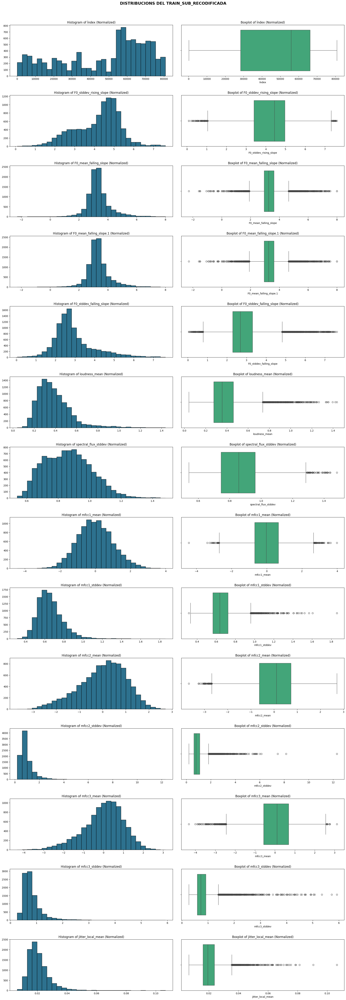

In [49]:
plt.figure(figsize=(20, len(train_sub_recodificada.columns[4:18]) * 4))
plt.suptitle('DISTRIBUCIONS DEL TRAIN_SUB_RECODIFICADA', fontsize=16, fontweight='bold', y=1.00)

for i, column in enumerate(train_sub_recodificada.columns[4:18]):
    plt.subplot(len(train_sub_recodificada.columns[4:18]), 2, 2*i + 1)
    plt.hist(train_sub_normalized[column], bins=30, color=c, edgecolor='black')
    plt.title(f'Histogram of {column} (Normalized)')
    
    plt.subplot(len(train_sub_recodificada.columns[4:18]), 2, 2*i + 2)
    sns.boxplot(x=train_sub_normalized[column], color=c1)
    plt.title(f'Boxplot of {column} (Normalized)')

plt.tight_layout(pad=3)
plt.show()

Un cop hem normalitzat les dades veiem com en algunes variables, on s'ha aplicat la normalització logaritmica, han aparegut missings. Per tant hem d'analitzar-los i decidir que fer amb ells.

In [50]:
nan_percentages = train_sub_normalized.isnull().mean() * 100
nan_percentages_filtered = nan_percentages[nan_percentages > 0]
print("\n\033[1mVARIABLES AMB MISSINGS (%):\033[0m")
nan_percentages_filtered


VARIABLES AMB MISSINGS (%):


F0_mean_falling_slope      3.120802
F0_mean_falling_slope.1    3.120802
mfcc1_stddev               0.010334
mfcc2_stddev               6.003927
mfcc3_stddev               1.643071
dtype: float64

Com els percentatges de missings són molt petits i fer un petit desplaçament resol el problema, decidim eliminar-los del dataset.

In [51]:
print(f"\033[1mNOMBRE DE FILES ABANS DE L'ELIMINACIÓ:\033[0m {train_sub_normalized.shape[0]}")

train_sub_normalized_cleaned = train_sub_normalized.dropna(subset=nan_percentages_filtered.index)
print(f"\033[1mNOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ:\033[0m {train_sub_normalized_cleaned.shape[0]}")
train_sub_normalized_cleaned


NOMBRE DE FILES ABANS DE L'ELIMINACIÓ: 9677
NOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ: 8749


,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
11930,Diff,45675,0,arf_03034,45674,5.141562,2.672649,2.672649,2.295121,0.540966,...,0.744488,0.026397,-0.279423,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
613,Real,59397,1,arf_03853,59396,4.844767,3.710121,3.710121,3.586842,0.318679,...,0.652371,0.014942,0.675047,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
17187,TTS-StarGAN,43193,0,pef_01523,43192,3.751411,3.252969,3.252969,1.871609,0.539709,...,0.803604,0.020401,-1.421673,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
2087,Real,59955,1,arm_09334,59954,5.011568,2.964658,2.964658,2.183566,0.575348,...,0.751328,0.014333,-0.795409,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
12216,Diff,4136,0,clf_01523,4135,5.219877,2.753290,2.753290,2.786758,0.444308,...,1.080808,0.016391,0.534238,1.014469,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4400,Real,70809,1,cof_08421,70808,4.048756,2.612609,2.612609,2.172322,0.297355,...,0.663438,0.014261,0.959564,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
12681,Diff,37626,0,cof_09334,37625,4.540138,3.107407,3.107407,2.709344,0.314732,...,0.819181,0.016209,1.121182,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
10437,StarGAN,32230,0,arf_02121,32229,4.463470,2.671142,2.671142,2.229954,0.368949,...,0.498940,0.017062,0.126606,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
15626,TTS-Diff,22588,0,com_01523,22587,4.742173,3.132302,3.132302,2.561518,0.583820,...,0.677038,0.020125,0.029785,-0.985738,1.0,0.0,0.0,1.0,0.0,0.0


Un cop s'ha completat la normalització pel conjunt d'entrenament, cal fer-la també amb els conjunts de validació i test. Per fer-ho apliquem el scaler creat amb el conjunt d'entrenament.

In [52]:
val_data_normalized = val_data_recodificada.copy()

for col in log_columns:
    val_data_normalized[col] = np.log1p(val_data_normalized[col])

numeric_columns_val = [feature for feature in val_data_recodificada.columns if val_data_recodificada[feature].dtypes != 'object']
numeric_columns_val = numeric_columns_val[4:18]

columns_to_normalize_val = [col for col in numeric_columns_val if col not in log_columns]
val_data_normalized[columns_to_normalize_val] = scaler.transform(val_data_normalized[columns_to_normalize_val])

val_data_normalized

,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
5736,Real,69163,1,pef_01523,69162,3.792715,3.442452,3.442452,1.451627,0.338896,...,0.645712,0.017173,-1.209637,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
17427,TTS-StarGAN,3016,0,pem_07508,3015,4.863856,3.163761,3.163761,1.855513,0.396419,...,0.556070,0.020236,0.488261,-0.985738,1.0,0.0,0.0,0.0,1.0,0.0
11697,StarGAN,786,0,vef_04310,785,5.390588,3.325953,3.325953,2.906464,0.452393,...,0.922769,0.013806,-0.582113,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
11189,StarGAN,21814,0,cof_03349,21813,4.536898,2.846402,2.846402,1.905622,0.333352,...,0.744410,0.014230,0.374053,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
9002,CycleGAN,16211,0,arf_02436,24342,3.966717,2.838236,2.838236,2.244956,0.467921,...,0.803751,0.012332,-1.796769,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12712,Diff,32960,0,com_02484,32959,4.821132,3.109960,3.109960,2.295671,0.573558,...,0.595977,0.021484,-0.216761,-0.985738,1.0,0.0,0.0,1.0,0.0,0.0
8191,Real,65977,1,vef_08421,65976,2.256741,1.996714,1.996714,3.382013,0.334600,...,1.116602,0.019139,-0.116969,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
2212,Real,57303,1,clf_01523,57302,4.698036,5.847105,5.847105,6.487934,0.448554,...,1.610509,0.028191,-0.168964,1.014469,0.0,0.0,1.0,0.0,0.0,0.0
8316,Real,70717,1,vef_09334,70716,3.075433,NaN,NaN,2.813677,0.321999,...,3.009113,0.018341,1.937813,1.014469,0.0,0.0,0.0,0.0,0.0,1.0


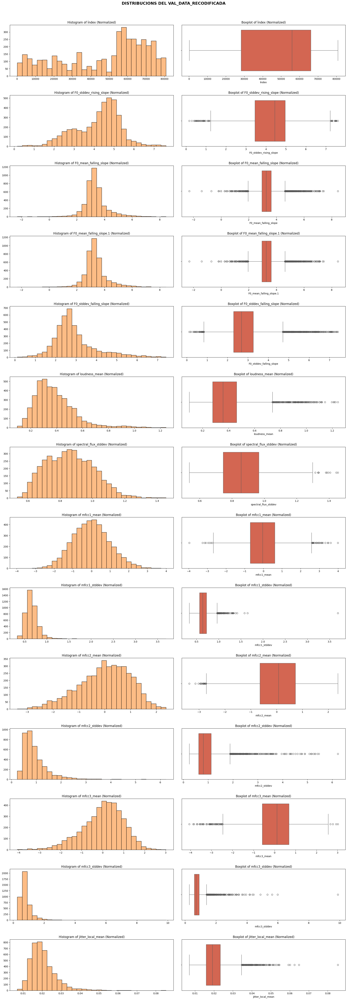

In [53]:
plt.figure(figsize=(20, len(val_data_recodificada.columns[4:18]) * 4))
plt.suptitle('DISTRIBUCIONS DEL VAL_DATA_RECODIFICADA', fontsize=16, fontweight='bold', y=1.00)

for i, column in enumerate(val_data_recodificada.columns[4:18]):
    plt.subplot(len(val_data_recodificada.columns[4:18]), 2, 2*i + 1)
    plt.hist(val_data_normalized[column], bins=30, color=c2, edgecolor='black')
    plt.title(f'Histogram of {column} (Normalized)')
    
    plt.subplot(len(val_data_recodificada.columns[4:18]), 2, 2*i + 2)
    sns.boxplot(x=val_data_normalized[column], color=c3)
    plt.title(f'Boxplot of {column} (Normalized)')

plt.tight_layout(pad=3)
plt.show()

In [54]:
nan_percentages_val = val_data_normalized.isnull().mean() * 100
nan_percentages_val_filtered = nan_percentages[nan_percentages > 0]
print("\n\033[1mVARIABLES AMB MISSINGS (%):\033[0m")
nan_percentages_val_filtered


VARIABLES AMB MISSINGS (%):


F0_mean_falling_slope      3.120802
F0_mean_falling_slope.1    3.120802
mfcc1_stddev               0.010334
mfcc2_stddev               6.003927
mfcc3_stddev               1.643071
dtype: float64

In [55]:
print(f"\033[1mNOMBRE DE FILES ABANS DE L'ELIMINACIÓ:\033[0m {val_data_normalized.shape[0]}")
val_data_normalized_cleaned = val_data_normalized.dropna(subset=nan_percentages_filtered.index)
print(f"\033[1mNOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ:\033[0m {val_data_normalized_cleaned.shape[0]}")
val_data_normalized_cleaned

NOMBRE DE FILES ABANS DE L'ELIMINACIÓ: 4143
NOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ: 3774


,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
5736,Real,69163,1,pef_01523,69162,3.792715,3.442452,3.442452,1.451627,0.338896,...,0.645712,0.017173,-1.209637,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
17427,TTS-StarGAN,3016,0,pem_07508,3015,4.863856,3.163761,3.163761,1.855513,0.396419,...,0.556070,0.020236,0.488261,-0.985738,1.0,0.0,0.0,0.0,1.0,0.0
11697,StarGAN,786,0,vef_04310,785,5.390588,3.325953,3.325953,2.906464,0.452393,...,0.922769,0.013806,-0.582113,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
11189,StarGAN,21814,0,cof_03349,21813,4.536898,2.846402,2.846402,1.905622,0.333352,...,0.744410,0.014230,0.374053,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
9002,CycleGAN,16211,0,arf_02436,24342,3.966717,2.838236,2.838236,2.244956,0.467921,...,0.803751,0.012332,-1.796769,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12917,Diff,2253,0,pef_01523,2252,3.386765,6.532192,6.532192,7.038323,0.578364,...,0.882518,0.018242,1.383914,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
12712,Diff,32960,0,com_02484,32959,4.821132,3.109960,3.109960,2.295671,0.573558,...,0.595977,0.021484,-0.216761,-0.985738,1.0,0.0,0.0,1.0,0.0,0.0
8191,Real,65977,1,vef_08421,65976,2.256741,1.996714,1.996714,3.382013,0.334600,...,1.116602,0.019139,-0.116969,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
2212,Real,57303,1,clf_01523,57302,4.698036,5.847105,5.847105,6.487934,0.448554,...,1.610509,0.028191,-0.168964,1.014469,0.0,0.0,1.0,0.0,0.0,0.0


In [56]:
test_data_normalized = test_data_recodificada.copy()

for col in log_columns:
    test_data_normalized[col] = np.log1p(test_data_normalized[col])

numeric_columns_test = [feature for feature in test_data_recodificada.columns if test_data_recodificada[feature].dtypes != 'object']
numeric_columns_test = numeric_columns_test[4:18]  # Seleccionar les mateixes columnes que en train

columns_to_normalize_test = [col for col in numeric_columns_test if col not in log_columns]
test_data_normalized[columns_to_normalize_test] = scaler.transform(test_data_normalized[columns_to_normalize_test])

test_data_normalized

,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
1754,Real,73338,1,arm_05223,73337,2.976111,3.274806,3.274806,2.101539,0.335916,...,0.618219,0.032960,0.350677,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
13831,TTS,80486,0,clf_09697,80485,4.585695,3.142960,3.142960,2.228973,0.521841,...,1.132418,0.017453,2.780888,1.014469,0.0,0.0,1.0,0.0,0.0,0.0
12144,Diff,17904,0,arm_02484,17903,4.713957,3.480930,3.480930,2.661691,0.638704,...,0.780861,0.021479,-1.219022,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
6101,Real,71808,1,pef_04310,71807,4.507215,2.759912,2.759912,2.216332,0.313108,...,1.265582,0.016287,0.626185,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
6642,Real,64753,1,pem_00295,64752,6.960619,4.861504,4.861504,5.039017,0.367975,...,0.632569,0.017219,-1.236690,-0.985738,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3219,Real,57380,1,clm_03397,57379,4.214892,3.571110,3.571110,2.681072,0.326988,...,0.849033,0.017440,0.493996,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
16157,TTS-Diff,12393,0,vef_08784,12392,4.945281,3.385520,3.385520,2.689621,0.554581,...,1.489860,0.024178,-0.104528,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
10304,CycleGAN,48733,0,vef_09697,12721,4.025744,3.616260,3.616260,2.674195,0.370125,...,0.899057,0.021746,-2.027690,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
17730,TTS-StarGAN,52692,0,vem_05223,52691,4.584495,2.753759,2.753759,2.864900,0.661995,...,0.609760,0.020917,-1.667118,-0.985738,1.0,0.0,0.0,0.0,0.0,1.0


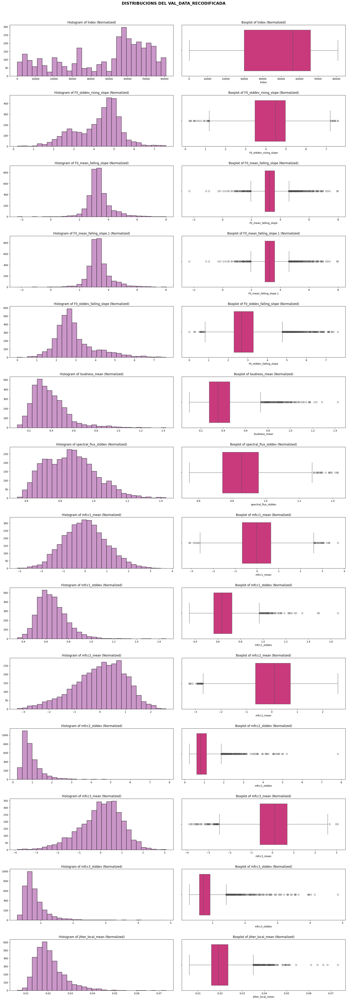

In [57]:
plt.figure(figsize=(20, len(test_data_recodificada.columns[4:18]) * 4))
plt.suptitle('DISTRIBUCIONS DEL VAL_DATA_RECODIFICADA', fontsize=16, fontweight='bold', y=1.00)

for i, column in enumerate(test_data_recodificada.columns[4:18]):
    plt.subplot(len(test_data_recodificada.columns[4:18]), 2, 2*i + 1)
    plt.hist(test_data_normalized[column], bins=30, color=c4, edgecolor='black')
    plt.title(f'Histogram of {column} (Normalized)')
    
    plt.subplot(len(test_data_recodificada.columns[4:18]), 2, 2*i + 2)
    sns.boxplot(x=test_data_normalized[column], color=c5)
    plt.title(f'Boxplot of {column} (Normalized)')

plt.tight_layout(pad=3)
plt.show()

In [58]:
nan_percentages_test = test_data_normalized.isnull().mean() * 100
nan_percentages_test_filtered = nan_percentages[nan_percentages > 0]
print("\n\033[1mVARIABLES AMB MISSINGS (%):\033[0m")
nan_percentages_test_filtered


VARIABLES AMB MISSINGS (%):


F0_mean_falling_slope      3.120802
F0_mean_falling_slope.1    3.120802
mfcc1_stddev               0.010334
mfcc2_stddev               6.003927
mfcc3_stddev               1.643071
dtype: float64

In [59]:
print(f"\033[1mNOMBRE DE FILES ABANS DE L'ELIMINACIÓ:\033[0m {test_data_normalized.shape[0]}")

test_data_normalized_cleaned = test_data_normalized.dropna(subset=nan_percentages_filtered.index)
print(f"\033[1mNOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ:\033[0m {test_data_normalized_cleaned.shape[0]}")
test_data_normalized_cleaned

NOMBRE DE FILES ABANS DE L'ELIMINACIÓ: 3448
NOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ: 3117


,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
1754,Real,73338,1,arm_05223,73337,2.976111,3.274806,3.274806,2.101539,0.335916,...,0.618219,0.032960,0.350677,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
13831,TTS,80486,0,clf_09697,80485,4.585695,3.142960,3.142960,2.228973,0.521841,...,1.132418,0.017453,2.780888,1.014469,0.0,0.0,1.0,0.0,0.0,0.0
12144,Diff,17904,0,arm_02484,17903,4.713957,3.480930,3.480930,2.661691,0.638704,...,0.780861,0.021479,-1.219022,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
6101,Real,71808,1,pef_04310,71807,4.507215,2.759912,2.759912,2.216332,0.313108,...,1.265582,0.016287,0.626185,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
6642,Real,64753,1,pem_00295,64752,6.960619,4.861504,4.861504,5.039017,0.367975,...,0.632569,0.017219,-1.236690,-0.985738,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10977,StarGAN,47384,0,clm_03034,47383,4.943581,2.781061,2.781061,2.189470,0.406383,...,0.781559,0.016774,-0.245384,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
3219,Real,57380,1,clm_03397,57379,4.214892,3.571110,3.571110,2.681072,0.326988,...,0.849033,0.017440,0.493996,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
10304,CycleGAN,48733,0,vef_09697,12721,4.025744,3.616260,3.616260,2.674195,0.370125,...,0.899057,0.021746,-2.027690,1.014469,0.0,0.0,0.0,0.0,0.0,1.0
17730,TTS-StarGAN,52692,0,vem_05223,52691,4.584495,2.753759,2.753759,2.864900,0.661995,...,0.609760,0.020917,-1.667118,-0.985738,1.0,0.0,0.0,0.0,0.0,1.0


### 2.2. Eliminació de variables numèriques redundants o sorolloses

Utilitzant una matriu de correlació calculem la correlació de les variables numèriques per tal de poder observar si n'hi ha alguna que estigui altament correlacionada amb una altra i, per tant, podem prescindir d'una de les dues.

La interpretació d'aquesta matriu és la següent:

- **Valors propers a 1 o -1:** Correlació forta, indica redundància.
- **Valors propers a 0:** Correlació baixa, pot ser sorollosa en relació amb altres variables.

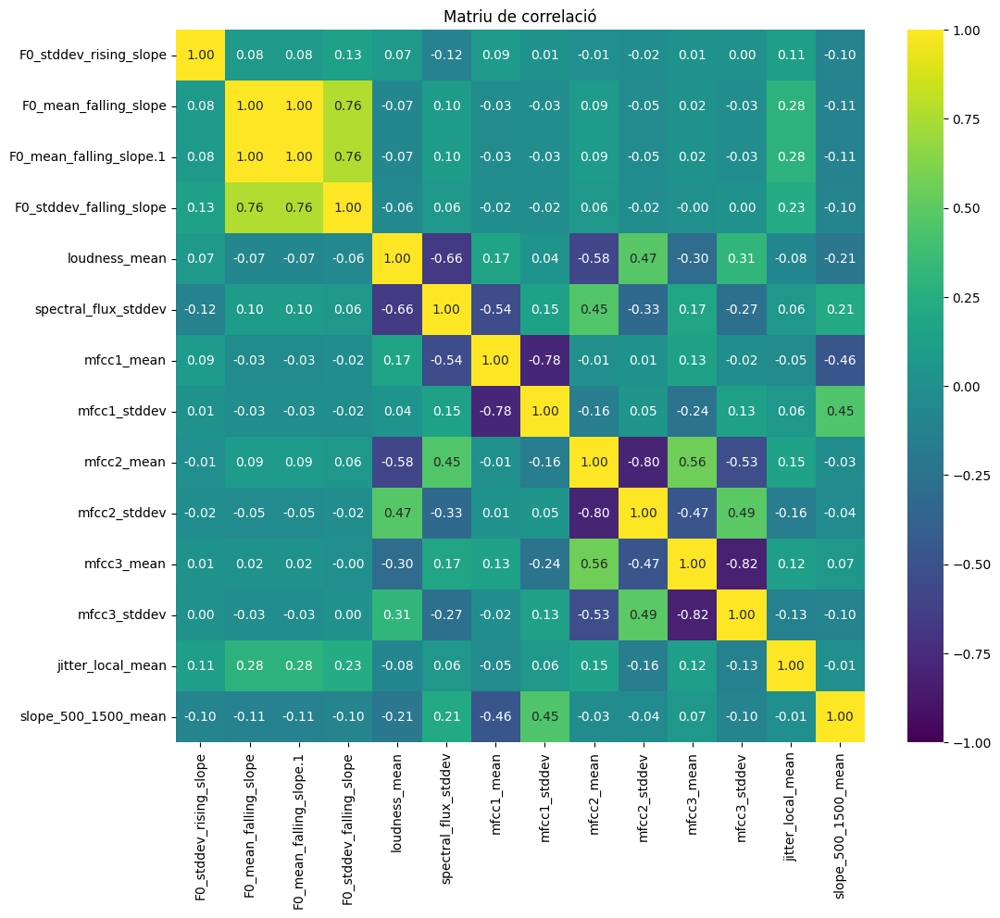

In [60]:
numerical_columns = train_sub_normalized_cleaned.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns[3:17]

correlation_matrix = train_sub_normalized_cleaned[numerical_columns].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="viridis", vmin=-1, vmax=1)
plt.title("Matriu de correlació")
plt.show()

També cal mirar la correlació que tenen les diferents variables amb la variable objectiu, per poder eliminar també aquelles variables que tenen una correlació molt baixa amb la variable objectiu i, per tant, no ens interesen. 

A més també ens podem desfer d'aquelles variables que tenen una baixa variabilitat.

In [61]:
target_correlation = train_sub_normalized_cleaned[numerical_columns].corrwith(train_sub_normalized_cleaned['Realornot'])

print(f"\033[1mCORRELACIÓ AMB LA VARIABLE OBJECTIU REALORNOT:\033[0m")
print(target_correlation.sort_values(ascending=False))

CORRELACIÓ AMB LA VARIABLE OBJECTIU REALORNOT:
spectral_flux_stddev       0.316989
mfcc2_mean                 0.263934
mfcc3_mean                 0.190296
slope_500_1500_mean        0.122727
mfcc1_stddev               0.099980
F0_stddev_falling_slope    0.082796
F0_mean_falling_slope      0.075527
F0_mean_falling_slope.1    0.075527
jitter_local_mean         -0.006839
F0_stddev_rising_slope    -0.122892
mfcc2_stddev              -0.140991
mfcc3_stddev              -0.168083
mfcc1_mean                -0.245781
loudness_mean             -0.381529
dtype: float64


In [62]:
variability = train_sub_normalized_cleaned[numerical_columns].std()
low_variability = variability[variability < 0.01]

print(f"\033[1mVARIABLES AMB BAIXA VARIABILITAT:\033[0m")
print(low_variability)

VARIABLES AMB BAIXA VARIABILITAT:
jitter_local_mean    0.007275
dtype: float64


In [63]:
variables_to_remove = [
    'F0_mean_falling_slope.1',   # Redundant amb F0_mean_falling_slope
    'F0_stddev_rising_slope',    # Sorollosa (correlació baixa amb la variable objectiu)
    'jitter_local_mean',         # Sorollosa (correlació baixa amb la variable objectiu)
    'mfcc1_stddev',              # Redundant i baixa correlació amb Realornot
    'F0_stddev_falling_slope',   # Sorollosa (correlació baixa amb la variable objectiu)
    'Combined_ID',               # No està codificada (i no ens interessa)
    'Índex',                     # No aporta informació, no ens interessa
    'Category'                   # No està codificada (i no ens interessa)
]

train_sub_normalized_cleaned_remove = train_sub_normalized_cleaned.drop(columns=variables_to_remove)

print('\n\033[1;4mCONJUNT DE TRAIN\033[0m')
print("\033[1mSHAPE ABANS DE L'ELIMINACIÓ:\033[0m", train_sub_normalized_cleaned.shape)
print("\033[1mSHAPE DESPRÉS DE L'ELIMINACIÓ:\033[0m", train_sub_normalized_cleaned_remove.shape)


CONJUNT DE TRAIN
SHAPE ABANS DE L'ELIMINACIÓ: (8749, 26)
SHAPE DESPRÉS DE L'ELIMINACIÓ: (8749, 18)


Com hem eliminat aquestes variables en el conjunt d'entrenament també les hem d'eliminar dels conjunts de validació i test.

In [64]:
val_data_normalized_cleaned_remove = val_data_normalized_cleaned.drop(columns=variables_to_remove)
test_data_normalized_cleaned_remove = test_data_normalized_cleaned.drop(columns=variables_to_remove)

print('\n\033[1;4mCONJUNT DE VALIDACIÓ\033[0m')
print("\033[1mSHAPE ABANS DE L'ELIMINACIÓ:\033[0m", val_data_normalized_cleaned.shape)
print("\033[1mSHAPE DESPRÉS DE L'ELIMINACIÓ:\033[0m", val_data_normalized_cleaned_remove.shape)

print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print("\033[1mSHAPE ABANS DE L'ELIMINACIÓ:\033[0m", test_data_normalized_cleaned.shape)
print("\033[1mSHAPE DESPRÉS DE L'ELIMINACIÓ:\033[0m", test_data_normalized_cleaned_remove.shape)


CONJUNT DE VALIDACIÓ
SHAPE ABANS DE L'ELIMINACIÓ: (3774, 26)
SHAPE DESPRÉS DE L'ELIMINACIÓ: (3774, 18)

CONJUNT DE TEST
SHAPE ABANS DE L'ELIMINACIÓ: (3117, 26)
SHAPE DESPRÉS DE L'ELIMINACIÓ: (3117, 18)


### 2.3. Estudi de dimensionalitat amb PCA

In [65]:
"""
1. Justificar la motivació de la reducció dimensional
Cal explicar per què has fet l'estudi amb PCA i per què és necessari reduir les dimensions en aquest problema. Pots incloure raons com:

Millora de l'eficiència computacional:
Amb menys dimensions, els models poden entrenar-se més ràpidament.
Reduir la dimensionalitat disminueix la complexitat del problema, evitant que els models siguin massa lents o costosos en entorns amb moltes variables.
Minimitzar el risc d'overfitting:
Reduir el nombre de variables elimina redundàncies i variables irrellevants o sorolloses, fet que millora la generalització del model i redueix el risc d'overfitting.
Explicar la major part de la variabilitat:
Amb només 5 components principals, ja expliques més del 80% de la variància. Això significa que mantens la major part de la informació rellevant del conjunt de dades, tot i haver reduït el nombre de dimensions.

"""

"\n1. Justificar la motivació de la reducció dimensional\nCal explicar per què has fet l'estudi amb PCA i per què és necessari reduir les dimensions en aquest problema. Pots incloure raons com:\n\nMillora de l'eficiència computacional:\nAmb menys dimensions, els models poden entrenar-se més ràpidament.\nReduir la dimensionalitat disminueix la complexitat del problema, evitant que els models siguin massa lents o costosos en entorns amb moltes variables.\nMinimitzar el risc d'overfitting:\nReduir el nombre de variables elimina redundàncies i variables irrellevants o sorolloses, fet que millora la generalització del model i redueix el risc d'overfitting.\nExplicar la major part de la variabilitat:\nAmb només 5 components principals, ja expliques més del 80% de la variància. Això significa que mantens la major part de la informació rellevant del conjunt de dades, tot i haver reduït el nombre de dimensions.\n\n"

Per tal de fer l'estudi de la dimensionalitat correctament cal eliminar algunes variables més de dins del dataset. 

In [66]:
remove = [
    'Realornot',     # perque es la variable objectiu
    'UniqueID'       # perque es un identificador
]

train_sub_pca = train_sub_normalized_cleaned_remove.drop(columns=remove)
train_sub_pca

,F0_mean_falling_slope,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
11930,2.672649,0.540966,0.778214,0.290908,-0.386328,1.056235,0.214638,0.744488,-0.279423,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
613,3.710121,0.318679,0.831666,0.117915,-0.012964,1.014571,0.389986,0.652371,0.675047,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
17187,3.252969,0.539709,0.684656,0.982131,-0.325714,1.015129,0.028568,0.803604,-1.421673,1.014469,0.0,0.0,0.0,0.0,1.0,0.0
2087,2.964658,0.575348,0.762813,1.216655,-0.268470,1.076953,0.496207,0.751328,-0.795409,-0.985738,1.0,1.0,0.0,0.0,0.0,0.0
12216,2.753290,0.444308,0.917054,-0.854440,-0.931326,1.374729,-1.049472,1.080808,0.534238,1.014469,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4400,2.612609,0.297355,0.979065,-0.936648,0.869543,0.590571,0.099334,0.663438,0.959564,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
12681,3.107407,0.314732,0.947493,-0.461474,0.173097,0.798985,-0.063294,0.819181,1.121182,1.014469,0.0,0.0,0.0,1.0,0.0,0.0
10437,2.671142,0.368949,0.989226,0.117728,0.685355,0.621612,1.200274,0.498940,0.126606,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
15626,3.132302,0.583820,0.644511,0.398591,-0.643148,0.982744,0.559213,0.677038,0.029785,-0.985738,1.0,0.0,0.0,1.0,0.0,0.0


In [67]:
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# PCA
pca = PCA()
pca.fit(train_sub_pca)

explained_variance = np.cumsum(pca.explained_variance_ratio_)

n_components_80 = np.argmax(explained_variance >= 0.8) + 1
print(f"\033[1mNOMBRE DE COMPONENTS PER EXPLICAR EL 80% DE LA VARIÀNCIA\033[0m {n_components_80}")

fig = go.Figure()

fig.add_trace(go.Scatter(x=np.arange(1, len(explained_variance) + 1), y=explained_variance, 
                         mode='lines+markers', name='Variança Explicada', line=dict(dash='dash', color='#FF6347')))

fig.add_trace(go.Scatter(x=[n_components_80, n_components_80], y=[0, 1], 
                         mode='lines', name=f'{n_components_80} components', line=dict(dash='longdash', color='#32CD32')))

fig.add_trace(go.Scatter(x=[1, len(explained_variance)], y=[0.8, 0.8], 
                         mode='lines', name='80% Variança', line=dict(dash='longdash', color='#4682B4')))

fig.update_layout(
    title='Estudi de dimensionalitat amb PCA',
    xaxis_title='Número de components',
    yaxis_title='Variança explicada acumulada',
    width=1000,  
    height=700,  
    showlegend=True
)

fig.show()

NOMBRE DE COMPONENTS PER EXPLICAR EL 80% DE LA VARIÀNCIA 5


In [68]:
# Reducció de dimensionalitat
pca_optimal = PCA(n_components=n_components_80)
pca_data_reduced = pca_optimal.fit_transform(train_sub_pca)

print(f"\033[1mFORMA DEL DATASET DESPRÉS DE LA REDUCCIÓ DE DIMENSIONALITAT:\033[0m {pca_data_reduced.shape}")

# Interpretació dels components principals
train_components_df = pd.DataFrame(
    pca_optimal.components_, 
    columns=train_sub_pca.columns, 
    index=[f'PC{i+1}' for i in range(len(pca_optimal.components_))]
)

print("\n\033[1mCÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS:\033[0m")
train_components_df

FORMA DEL DATASET DESPRÉS DE LA REDUCCIÓ DE DIMENSIONALITAT: (8749, 5)

CÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS:


,F0_mean_falling_slope,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
PC1,-0.056935,0.029011,-0.008382,-0.240010,-0.441272,0.270901,-0.482375,0.167549,0.096081,0.560755,-0.280349,-0.027817,-0.011389,0.014435,-0.040920,0.065691
PC2,-0.033694,-0.042388,0.062176,-0.642395,0.167432,-0.126312,0.151700,-0.076648,0.702711,-0.041617,0.020807,-0.022679,0.002213,0.092470,-0.039524,-0.032479
PC3,0.137180,-0.060085,0.060967,-0.079433,0.456765,-0.229207,0.298115,-0.104174,-0.239722,0.643691,-0.321812,0.113532,-0.033562,-0.070991,0.073566,-0.082545
PC4,0.792401,-0.004467,0.036689,-0.359255,0.074042,-0.024957,-0.265495,0.063751,-0.267627,-0.167441,0.083712,-0.200390,0.087757,0.014944,0.076165,0.021524
PC5,0.583790,0.009808,-0.046612,0.412382,-0.271350,0.169740,0.324166,-0.074152,0.434799,0.131639,-0.065813,0.195974,-0.026656,-0.006929,-0.154601,-0.007788


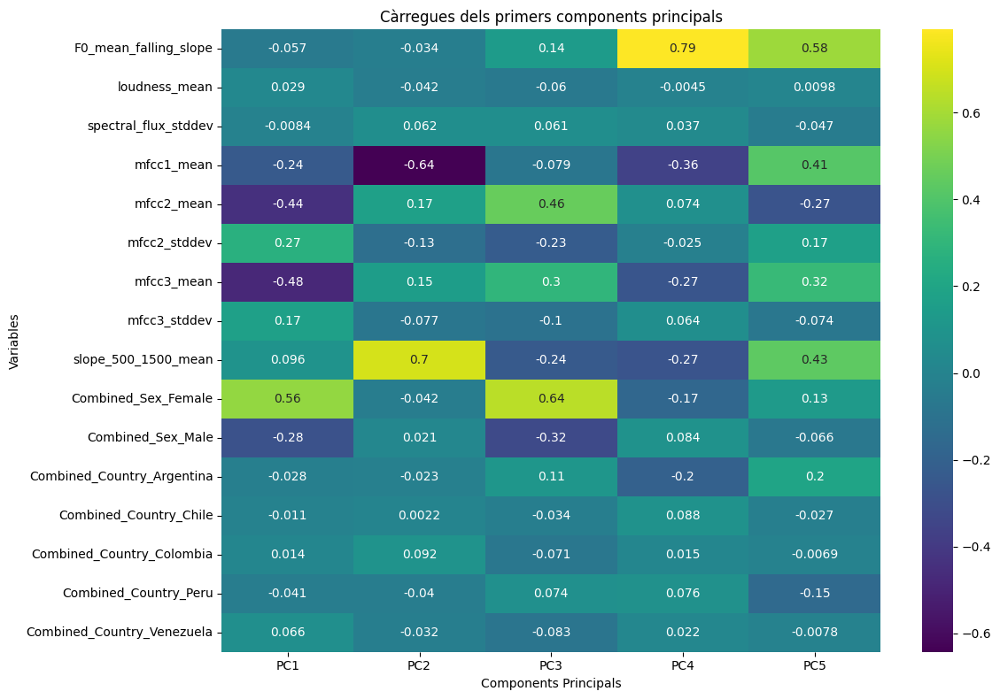

In [69]:
plt.figure(figsize=(12, 8))
sns.heatmap(train_components_df.iloc[:5].T, cmap='viridis', annot=True)
plt.title("Càrregues dels primers components principals")
plt.xlabel("Components Principals")
plt.ylabel("Variables")
plt.tight_layout()
plt.show()

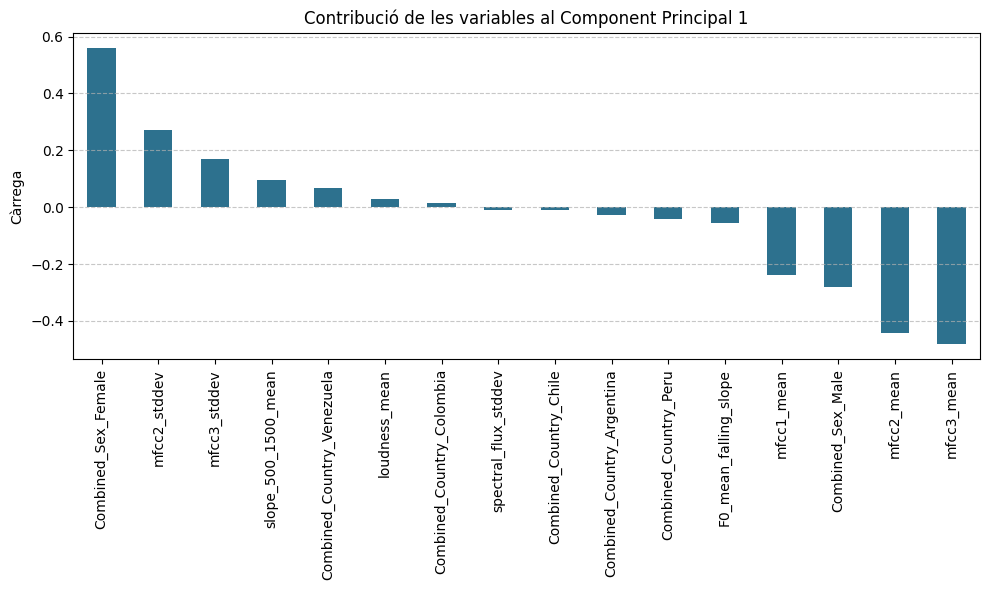

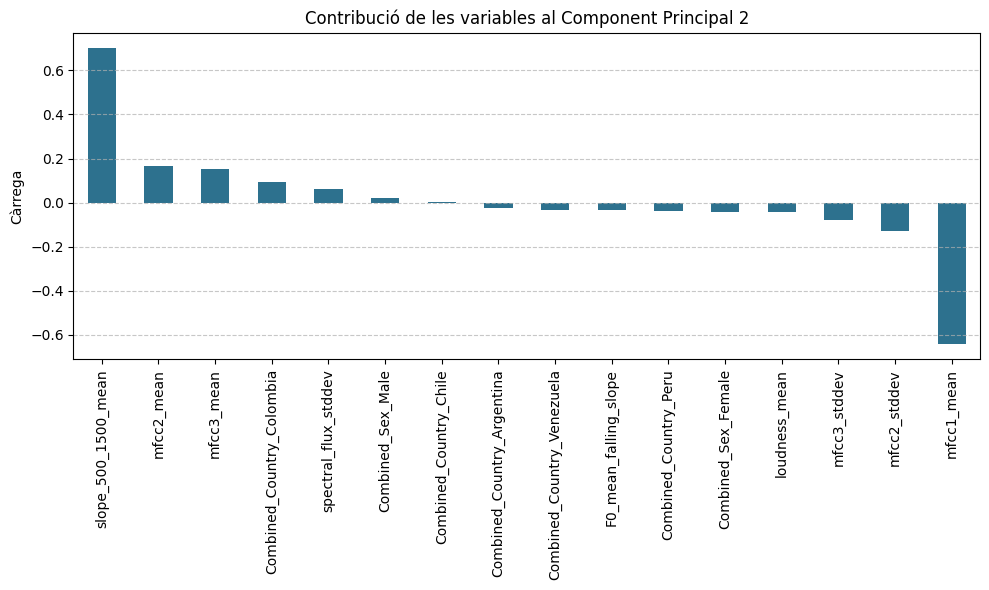

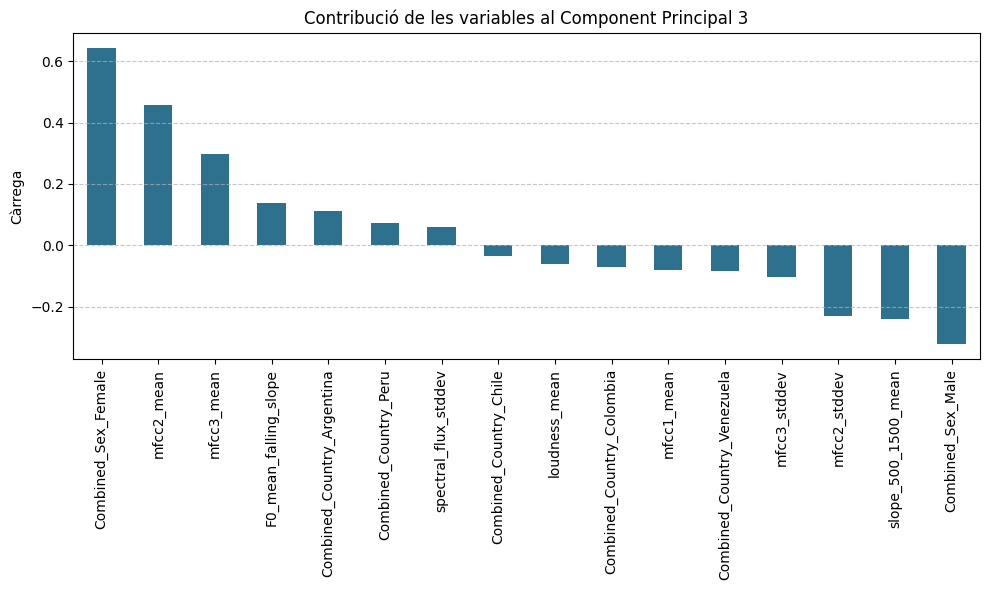

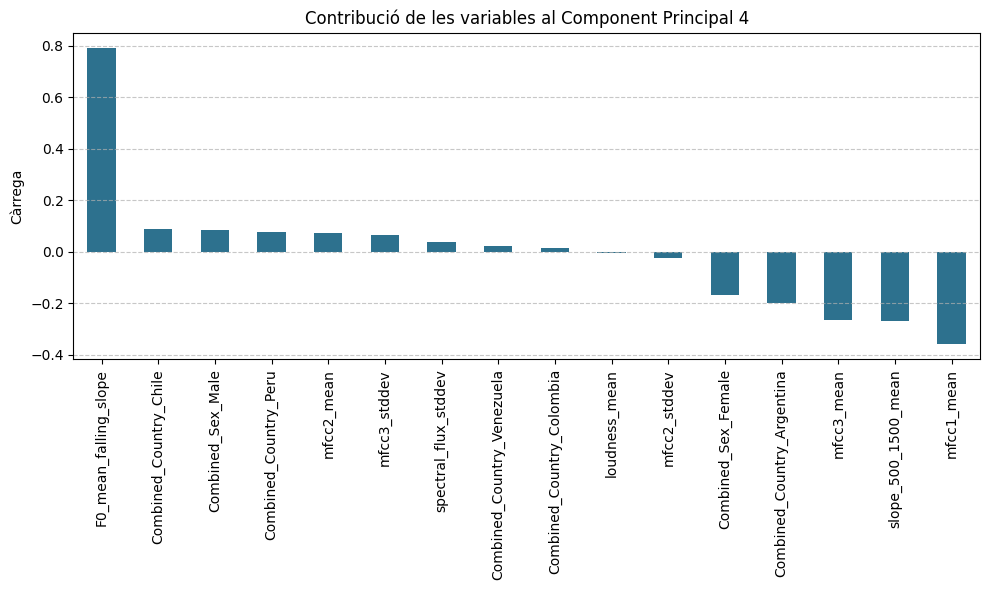

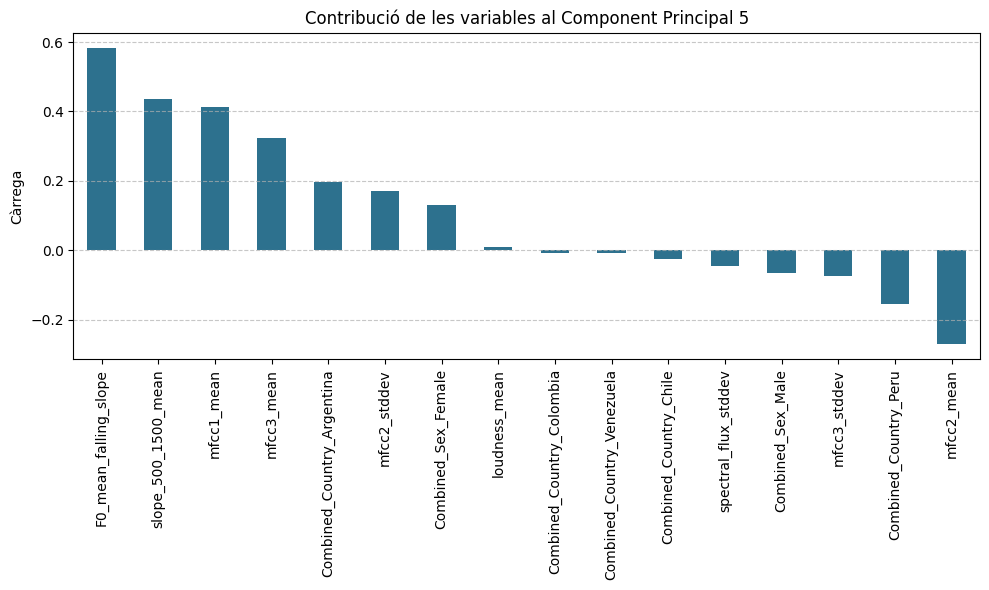

In [70]:
for i in range(5): 
    plt.figure(figsize=(10, 6))
    train_components_df.iloc[i].sort_values(ascending=False).plot(kind='bar', color=c)
    plt.title(f"Contribució de les variables al Component Principal {i+1}")
    plt.ylabel("Càrrega")
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    print("\n")


Un cop aplicat el PCA al conjunt d'entrenament, s'ha decidit reduir el conjunt de dades a un total de 5 components principals que expliquen més del 80% de la variància total. Aquesta reducció ens permet optimitzar l'eficiència computacional i minimitzar el risc d'overfitting, mantenint la major part de la informació rellevant del conjunt de dades. 

Aquestes transformacions cal aplicar-les també de manera consistent a tots els conjunts. Per tant, apliquem el PCA a les dades de validació i de test.

In [71]:
val_data_pca = val_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])

val_pca_reduced = pca_optimal.transform(val_data_pca)

val_pca_df = pd.DataFrame(val_pca_reduced, columns=[f'PC{i+1}' for i in range(n_components_80)], index=val_data_pca.index)

val_component_df = pd.DataFrame(pca_optimal.components_, 
                                         columns=val_data_pca.columns, 
                                         index=[f'PC{i+1}' for i in range(n_components_80)])

print("\n\033[1mCÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS PER LA VALIDACIÓ:\033[0m")
val_component_df


CÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS PER LA VALIDACIÓ:


,F0_mean_falling_slope,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
PC1,-0.056935,0.029011,-0.008382,-0.240010,-0.441272,0.270901,-0.482375,0.167549,0.096081,0.560755,-0.280349,-0.027817,-0.011389,0.014435,-0.040920,0.065691
PC2,-0.033694,-0.042388,0.062176,-0.642395,0.167432,-0.126312,0.151700,-0.076648,0.702711,-0.041617,0.020807,-0.022679,0.002213,0.092470,-0.039524,-0.032479
PC3,0.137180,-0.060085,0.060967,-0.079433,0.456765,-0.229207,0.298115,-0.104174,-0.239722,0.643691,-0.321812,0.113532,-0.033562,-0.070991,0.073566,-0.082545
PC4,0.792401,-0.004467,0.036689,-0.359255,0.074042,-0.024957,-0.265495,0.063751,-0.267627,-0.167441,0.083712,-0.200390,0.087757,0.014944,0.076165,0.021524
PC5,0.583790,0.009808,-0.046612,0.412382,-0.271350,0.169740,0.324166,-0.074152,0.434799,0.131639,-0.065813,0.195974,-0.026656,-0.006929,-0.154601,-0.007788


In [72]:
test_data_pca = test_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])

test_pca_reduced = pca_optimal.transform(test_data_pca)

test_pca_df = pd.DataFrame(test_pca_reduced, columns=[f'PC{i+1}' for i in range(n_components_80)], index=test_data_pca.index)

test_component_df = pd.DataFrame(pca_optimal.components_, 
                                         columns=test_data_pca.columns, 
                                         index=[f'PC{i+1}' for i in range(n_components_80)])

print("\n\033[1mCÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS PEL TEST:\033[0m")
test_component_df


CÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS PEL TEST:


,F0_mean_falling_slope,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
PC1,-0.056935,0.029011,-0.008382,-0.240010,-0.441272,0.270901,-0.482375,0.167549,0.096081,0.560755,-0.280349,-0.027817,-0.011389,0.014435,-0.040920,0.065691
PC2,-0.033694,-0.042388,0.062176,-0.642395,0.167432,-0.126312,0.151700,-0.076648,0.702711,-0.041617,0.020807,-0.022679,0.002213,0.092470,-0.039524,-0.032479
PC3,0.137180,-0.060085,0.060967,-0.079433,0.456765,-0.229207,0.298115,-0.104174,-0.239722,0.643691,-0.321812,0.113532,-0.033562,-0.070991,0.073566,-0.082545
PC4,0.792401,-0.004467,0.036689,-0.359255,0.074042,-0.024957,-0.265495,0.063751,-0.267627,-0.167441,0.083712,-0.200390,0.087757,0.014944,0.076165,0.021524
PC5,0.583790,0.009808,-0.046612,0.412382,-0.271350,0.169740,0.324166,-0.074152,0.434799,0.131639,-0.065813,0.195974,-0.026656,-0.006929,-0.154601,-0.007788


## 3. Definició de Models

### 3.1. Model KNN

**MOTIVACIÓ**

El KNN és un model senzill que no fa cap assumpció sobre la distribució de les dades. És útil per explorar dades amb distribucions complexes però pot ser lent amb grans volums de dades.

In [73]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

knn_params = {
    'n_neighbors': [1, 3, 5, 7, 10],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'p': [1, 2, 3]  # Només s'utilitza si la mètrica és 'minkowski'
}

knn = KNeighborsClassifier()

knn_grid = GridSearchCV(knn, knn_params, cv=5, scoring='accuracy', verbose=1)
knn_grid.fit(pca_data_reduced, train_sub_normalized_cleaned['Realornot'])

print(f"\033[1mMILLORS HIPERPARÀMETRES PER KNN:\033[0m {knn_grid.best_params_}")
knn_best = knn_grid.best_estimator_

results = knn_grid.cv_results_

print("\n\033[1mRESULTATS DE LES DIFERENTS COMBINACIONS D'HIPERPARÀMETRES\033[0m")
for mean, std, params in zip(results['mean_test_score'], results['std_test_score'], results['params']):
    if params == knn_grid.best_params_:
        print(f"\033[1m\033[91m{params}: Mean Accuracy = {mean:.4f} ± {std:.4f} <-- MILLOR COMBINACIÓ!\033[0m")
    else:
        print(f"{params}: Mean Accuracy = {mean:.4f} ± {std:.4f}")

y_train_pred = knn_best.predict(pca_data_reduced)
y_val_pred = knn_best.predict(val_pca_reduced)

Fitting 5 folds for each of 90 candidates, totalling 450 fits
MILLORS HIPERPARÀMETRES PER KNN: {'metric': 'minkowski', 'n_neighbors': 10, 'p': 3, 'weights': 'distance'}

RESULTATS DE LES DIFERENTS COMBINACIONS D'HIPERPARÀMETRES
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}: Mean Accuracy = 0.6458 ± 0.0129
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 1, 'weights': 'distance'}: Mean Accuracy = 0.6458 ± 0.0129
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 2, 'weights': 'uniform'}: Mean Accuracy = 0.6458 ± 0.0129
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 2, 'weights': 'distance'}: Mean Accuracy = 0.6458 ± 0.0129
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 3, 'weights': 'uniform'}: Mean Accuracy = 0.6458 ± 0.0129
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 3, 'weights': 'distance'}: Mean Accuracy = 0.6458 ± 0.0129
{'metric': 'euclidean', 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}: Mean Accuracy = 0.6652 ± 0.0097
{'metric': 'euclidean', 'n_neighbo

Un cop trobada la millor combinació d'hiperparàmetres, l'apliquem als conjunts d'entrenament, validació i test.

In [74]:
train_metrics = classification_report(train_sub_normalized_cleaned['Realornot'], y_train_pred)
val_metrics = classification_report(val_data_normalized_cleaned_remove['Realornot'], y_val_pred)

print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics)

print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics)


Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4094
           1       1.00      1.00      1.00      4655

    accuracy                           1.00      8749
   macro avg       1.00      1.00      1.00      8749
weighted avg       1.00      1.00      1.00      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.69      0.63      0.66      1768
           1       0.70      0.74      0.72      2006

    accuracy                           0.69      3774
   macro avg       0.69      0.69      0.69      3774
weighted avg       0.69      0.69      0.69      3774



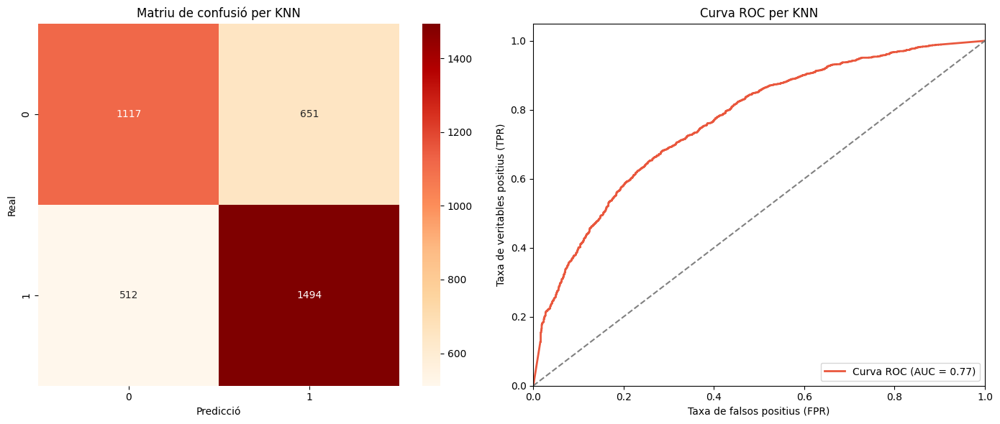

In [75]:
from sklearn.metrics import confusion_matrix, roc_curve, auc

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió
sns.heatmap(confusion_matrix(val_data_normalized_cleaned_remove['Realornot'], y_val_pred), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per KNN")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")


fpr, tpr, thresholds = roc_curve(val_data_normalized_cleaned_remove['Realornot'], knn_best.predict_proba(val_pca_reduced)[:, 1])
roc_auc = auc(fpr, tpr)

# Subplot 2: Curva ROC
ax[1].plot(fpr, tpr, color=c3, lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='gray', linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de veritables positius (TPR)')
ax[1].set_title('Curva ROC per KNN')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

In [76]:
y_test_pred = knn_best.predict(test_pca_df)

test_metrics = classification_report(test_data_normalized_cleaned_remove['Realornot'], y_test_pred)

print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(test_metrics)



Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.69      0.65      0.67      1468
           1       0.70      0.75      0.72      1649

    accuracy                           0.70      3117
   macro avg       0.70      0.70      0.70      3117
weighted avg       0.70      0.70      0.70      3117



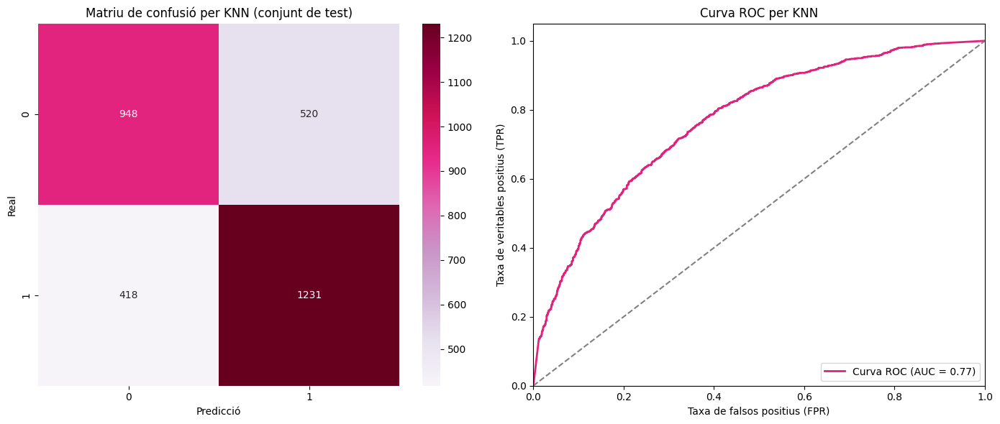

In [77]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió (Conjunt de test)
sns.heatmap(confusion_matrix(test_data_normalized_cleaned_remove['Realornot'], y_test_pred), annot=True, fmt="d", cmap="PuRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per KNN (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

y_test_proba = knn_best.predict_proba(test_pca_df)[:, 1]
fpr_test, tpr_test, thresholds = roc_curve(test_data_normalized_cleaned_remove['Realornot'], y_test_proba)

roc_auc = auc(fpr_test, tpr_test)

# Subplot 2: Curva ROC
ax[1].plot(fpr_test, tpr_test, color=c5, lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='gray', linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de veritables positius (TPR)')
ax[1].set_title('Curva ROC per KNN')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

### 3.2. Arbre de Decisió

**MOTIVACIÓ**

Els arbres de decisió són models interpretables i fàcils d’entendre que divideixen les dades en subconjunts basant-se en condicions lògiques successives. Són molt flexibles perquè no fan assumpcions sobre la distribució de les dades i poden gestionar tant dades categòriques com numèriques. Tot i així, poden tendir a sobreajustar-se si no es controlen adequadament.

In [78]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

tree_params = {
    'max_depth': [3, 5, 7, 10, 15, 20, None],
    'min_samples_split': [2, 3, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 5, 10, 20],
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random']
}

tree = DecisionTreeClassifier()

tree_grid = GridSearchCV(tree, tree_params, cv=5, scoring='accuracy', verbose=1)
tree_grid.fit(pca_data_reduced, train_sub_normalized_cleaned['Realornot'])

print(f"\033[1mMillors hiperparàmetres per Arbre de decisió:\033[0m {tree_grid.best_params_}")
tree_best = tree_grid.best_estimator_

results = tree_grid.cv_results_

print("\n\033[1mResultats de la cerca en graella:\033[0m")
for mean, std, params in zip(results['mean_test_score'], results['std_test_score'], results['params']):
    if params == tree_grid.best_params_:
        print(f"\033[1m\033[91m{params}: Mean Accuracy = {mean:.4f} ± {std:.4f} <-- MILLOR COMBINACIÓ!\033[0m")
    else:
        print(f"{params}: Mean Accuracy = {mean:.4f} ± {std:.4f}")

y_train_pred_tree = tree_best.predict(pca_data_reduced)
y_val_pred_tree = tree_best.predict(val_pca_reduced)

Fitting 5 folds for each of 840 candidates, totalling 4200 fits
Millors hiperparàmetres per Arbre de decisió: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 20, 'min_samples_split': 2, 'splitter': 'best'}

Resultats de la cerca en graella:
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}: Mean Accuracy = 0.6684 ± 0.0120
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'random'}: Mean Accuracy = 0.6195 ± 0.0373
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3, 'splitter': 'best'}: Mean Accuracy = 0.6684 ± 0.0120
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3, 'splitter': 'random'}: Mean Accuracy = 0.6324 ± 0.0175
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 5, 'splitter': 'best'}: Mean Accuracy = 0.6684 ± 0.0120
{'criterion': 'gini', 'max_depth': 3, 'min_samples_l

Un cop trobada la millor combinació d'hiperparàmetres, l'apliquem als conjunts d'entrenament, validació i test.

In [79]:
train_metrics_tree = classification_report(train_sub_normalized_cleaned['Realornot'], y_train_pred_tree)
val_metrics_tree = classification_report(val_data_normalized_cleaned_remove['Realornot'], y_val_pred_tree)

print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics_tree)

print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics_tree)


Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       0.76      0.56      0.65      4094
           1       0.69      0.85      0.76      4655

    accuracy                           0.71      8749
   macro avg       0.73      0.71      0.70      8749
weighted avg       0.72      0.71      0.71      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.72      0.52      0.60      1768
           1       0.66      0.82      0.73      2006

    accuracy                           0.68      3774
   macro avg       0.69      0.67      0.67      3774
weighted avg       0.69      0.68      0.67      3774



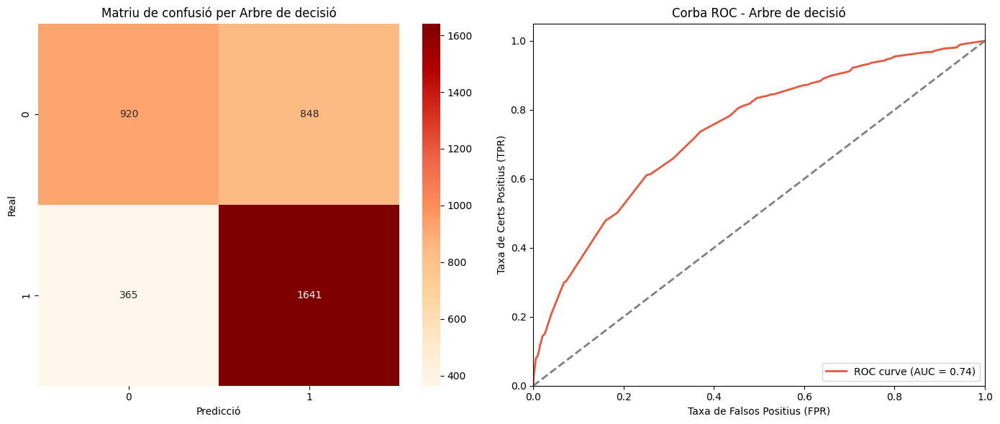

In [80]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))  

# Subplot 1: Matriu de confusió per l'arbre de decisió (conjunt de validació)
sns.heatmap(confusion_matrix(val_data_normalized_cleaned_remove['Realornot'], y_val_pred_tree), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per Arbre de decisió")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

y_val_proba_tree = tree_best.predict_proba(val_pca_reduced)[:, 1]

fpr, tpr, thresholds = roc_curve(val_data_normalized_cleaned_remove['Realornot'], y_val_proba_tree)
roc_auc = auc(fpr, tpr)

# Subplot 2: Corba ROC per l'arbre de decisió
ax[1].plot(fpr, tpr, color=c3, lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC - Arbre de decisió')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

In [81]:
y_test_pred_tree = tree_best.predict(test_pca_df)

y_test_proba_tree = tree_best.predict_proba(test_pca_df)[:, 1]

test_metrics_tree = classification_report(test_data_normalized_cleaned_remove['Realornot'], y_test_pred_tree)

print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(test_metrics_tree)


Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.74      0.53      0.62      1468
           1       0.67      0.84      0.74      1649

    accuracy                           0.69      3117
   macro avg       0.71      0.68      0.68      3117
weighted avg       0.70      0.69      0.68      3117



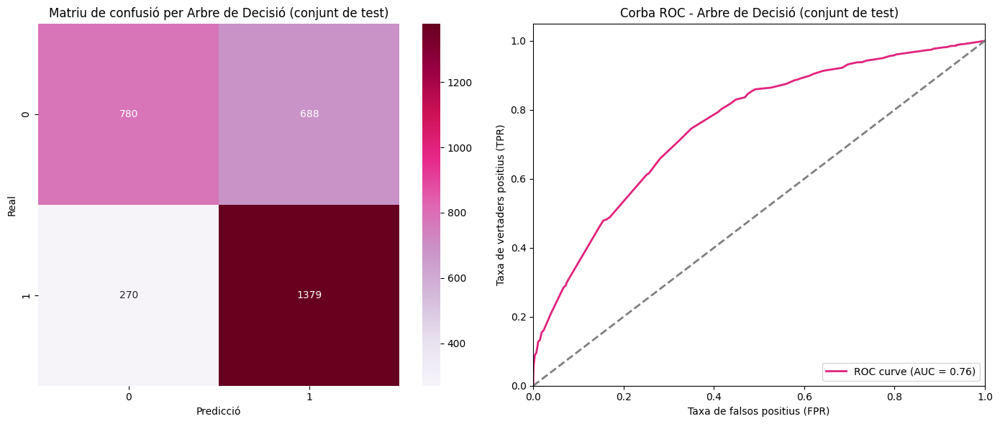

In [82]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per Arbre de Decisió (conjunt de test)
sns.heatmap(confusion_matrix(test_data_normalized_cleaned_remove['Realornot'], y_test_pred_tree), annot=True, fmt="d", cmap="PuRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per Arbre de Decisió (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

fpr_test, tpr_test, thresholds = roc_curve(test_data_normalized_cleaned_remove['Realornot'], y_test_proba_tree)
roc_auc = auc(fpr_test, tpr_test)

# Subplot 2: Corba ROC per Arbre de Decisió (conjunt de test)
ax[1].plot(fpr_test, tpr_test, color=c5, lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de vertaders positius (TPR)')
ax[1].set_title('Corba ROC - Arbre de Decisió (conjunt de test)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

### 3.3. Model SVM

**MOTIVACIÓ**

Les màquines de vectors de suport són potents per a la classificació i la regressió, especialment quan les dades no són linealment separables. Utilitzen funcions de nucli per gestionar relacions complexes entre característiques, el que els permet trobar hiperplans òptims. Tot i ser molt efectius amb dades amb distribucions complicades, poden ser computacionalment costosos i difícils de calibrar amb grans volums de dades.

In [83]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

svm_params_optimized = {
    'C': [0.1, 1, 10],               
    'kernel': ['linear', 'rbf'],     
    'gamma': ['scale'],              
}

svm = SVC(probability=True)

svm_grid = GridSearchCV(svm, svm_params_optimized, cv=5, scoring='accuracy', verbose=1)
svm_grid.fit(pca_data_reduced, train_sub_normalized_cleaned['Realornot'])

print(f"\033[1mMillors hiperparàmetres per SVM:\033[0m {svm_grid.best_params_}")
svm_best = svm_grid.best_estimator_

results_df = pd.DataFrame(svm_grid.cv_results_)
results_df = results_df[['param_C', 'param_kernel', 'mean_test_score']]
results_df = results_df.sort_values(by='mean_test_score', ascending=False)
print("\nResultats de les combinacions d'hiperparàmetres:\n")
print(results_df)

print("\n\033[1;31mMillor combinació d'hiperparàmetres:\033[0m")
print(results_df.iloc[0])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Millors hiperparàmetres per SVM: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

Resultats de les combinacions d'hiperparàmetres:

   param_C param_kernel  mean_test_score
5     10.0          rbf         0.709795
3      1.0          rbf         0.708309
1      0.1          rbf         0.703851
4     10.0       linear         0.674247
2      1.0       linear         0.674018
0      0.1       linear         0.673790

Millor combinació d'hiperparàmetres:
param_C                10.0
param_kernel            rbf
mean_test_score    0.709795
Name: 5, dtype: object


In [84]:
y_train_pred_svm = svm_best.predict(pca_data_reduced)
y_val_pred_svm = svm_best.predict(val_pca_reduced)

train_metrics_svm = classification_report(train_sub_normalized_cleaned['Realornot'], y_train_pred_svm)
print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics_svm)

val_metrics_svm = classification_report(val_data_normalized_cleaned_remove['Realornot'], y_val_pred_svm)
print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics_svm)


Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       0.73      0.67      0.70      4094
           1       0.73      0.78      0.76      4655

    accuracy                           0.73      8749
   macro avg       0.73      0.73      0.73      8749
weighted avg       0.73      0.73      0.73      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.73      0.67      0.70      1768
           1       0.73      0.78      0.75      2006

    accuracy                           0.73      3774
   macro avg       0.73      0.73      0.73      3774
weighted avg       0.73      0.73      0.73      3774



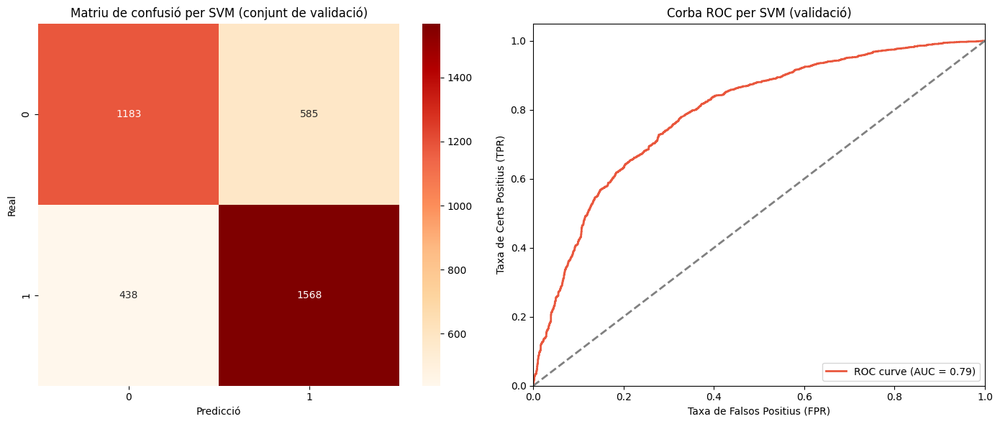

In [85]:
from sklearn.metrics import confusion_matrix

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per SVM (conjunt de validació)
sns.heatmap(confusion_matrix(val_data_normalized_cleaned_remove['Realornot'], y_val_pred_svm), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per SVM (conjunt de validació)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

y_val_proba_svm = svm_best.predict_proba(val_pca_reduced)[:, 1]

fpr, tpr, thresholds = roc_curve(val_data_normalized_cleaned_remove['Realornot'], y_val_proba_svm)
roc_auc = auc(fpr, tpr)

# Subplot 2: Corba ROC per SVM (conjunt de validació)
ax[1].plot(fpr, tpr, color=c3, lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per SVM (validació)')
ax[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

In [86]:
y_test_pred_svm = svm_best.predict(test_pca_df)

test_metrics_svm = classification_report(test_data_normalized_cleaned_remove['Realornot'], y_test_pred_svm)
print("\n\033[1mMètriques per al conjunt de test:\033[0m")

print(test_metrics_svm)


Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.73      0.66      0.70      1468
           1       0.72      0.79      0.75      1649

    accuracy                           0.73      3117
   macro avg       0.73      0.72      0.73      3117
weighted avg       0.73      0.73      0.73      3117



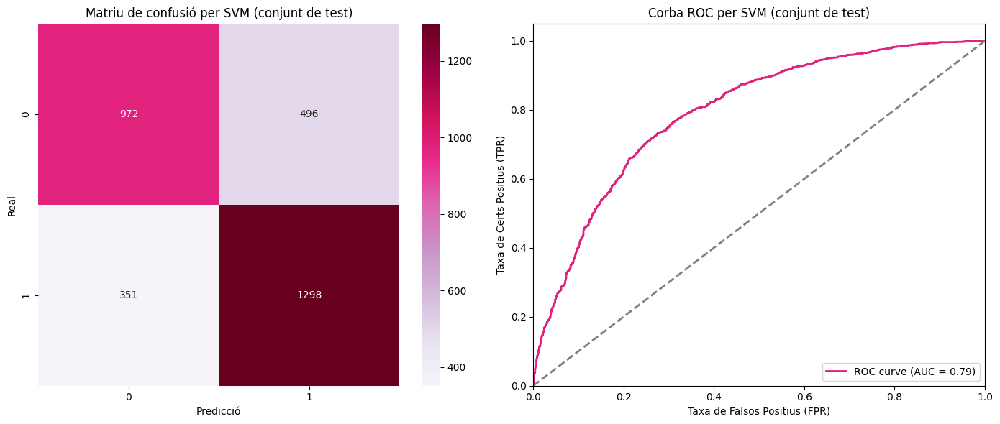

In [87]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per SVM (conjunt de test)
sns.heatmap(confusion_matrix(test_data_normalized_cleaned_remove['Realornot'], y_test_pred_svm), annot=True, fmt="d", cmap="PuRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per SVM (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

y_test_proba_svm = svm_best.predict_proba(test_pca_df)[:, 1]

fpr_test, tpr_test, thresholds_test = roc_curve(test_data_normalized_cleaned_remove['Realornot'], y_test_proba_svm)
roc_auc_test = auc(fpr_test, tpr_test)

# Subplot 2: Corba ROC per SVM (conjunt de test)
ax[1].plot(fpr_test, tpr_test, color=c5, lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per SVM (conjunt de test)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

## 4. Selecció del Model Triat

In [88]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
def evaluate_model(y_true, y_pred, y_proba=None):
    metrics = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'F1-Score': f1_score(y_true, y_pred, average='weighted'),
        'Precision': precision_score(y_true, y_pred, average='weighted'),
        'Recall': recall_score(y_true, y_pred, average='weighted')
    }
    if y_proba is not None:
        metrics['AUC-ROC'] = roc_auc_score(y_true, y_proba)
    return metrics

models = {
    'KNN': knn_best,
    'Decision Tree': tree_best,
    'SVM': svm_best
}

metrics_comparison = {}

for model_name, model in models.items():
    print(f"\033[1mAvaluant {model_name}\033[0m")
    
    y_val_pred = model.predict(val_pca_reduced)
    y_val_proba = model.predict_proba(val_pca_reduced)[:, 1] if hasattr(model, "predict_proba") else None
    
    val_metrics = evaluate_model(val_data_normalized_cleaned_remove['Realornot'], y_val_pred, y_val_proba)
    
    metrics_comparison[model_name] = val_metrics
    print(f"Mètriques per {model_name}:\n", val_metrics)
    print("\n")

print("\033[1mComparació de mètriques entre els models\033[0m")
metrics_comparison_df = pd.DataFrame(metrics_comparison).T  
print(metrics_comparison_df)

sorted_models = metrics_comparison_df.sort_values(by='AUC-ROC', ascending=False)

print("\n\033[1mModels ordenats de millor a pitjor basats en l'AUC-ROC:\033[0m")
print(sorted_models)

best_model_name = sorted_models.index[0]
best_model = models[best_model_name]
print(f"\n\033[1;32mEl millor model és {best_model_name} basat en l'AUC-ROC\033[0m")

Avaluant KNN
Mètriques per KNN:
 {'Accuracy': 0.6918388977212506, 'F1-Score': 0.6906936862512187, 'Precision': 0.6914408748662892, 'Recall': 0.6918388977212506, 'AUC-ROC': np.float64(0.7658850371961039)}


Avaluant Decision Tree
Mètriques per Decision Tree:
 {'Accuracy': 0.6785903550609433, 'F1-Score': 0.6704342126511899, 'Precision': 0.685840779318228, 'Recall': 0.6785903550609433, 'AUC-ROC': np.float64(0.7412592539124706)}


Avaluant SVM
Mètriques per SVM:
 {'Accuracy': 0.7289348171701113, 'F1-Score': 0.7278464102034637, 'Precision': 0.7289936448079986, 'Recall': 0.7289348171701113, 'AUC-ROC': np.float64(0.791637812805926)}


Comparació de mètriques entre els models
               Accuracy  F1-Score  Precision    Recall   AUC-ROC
KNN            0.691839  0.690694   0.691441  0.691839  0.765885
Decision Tree  0.678590  0.670434   0.685841  0.678590  0.741259
SVM            0.728935  0.727846   0.728994  0.728935  0.791638

Models ordenats de millor a pitjor basats en l'AUC-ROC:
      

Un cop identificat el millor model, que en el nostre cas és el SVM per haver obtingut els millors resultats, procedim a aplicar-lo sobre el conjunt de dades de test (**test_csv**) per avaluar-ne el rendiment final.

Per tal d'aplicar el model al **test_csv**, primer cal preprocessar-lo seguint exactament els mateixos passos que s'han aplicat als conjunts de validació i test. Això inclou utilitzar els valors calculats a partir del conjunt de train, garantint així la coherència del procés i evitant possibles problemes d'overfitting.

In [89]:
df2 = pd.DataFrame(index=test_csv.index)

df2['ID'] = test_csv['ID']
df2['Target_ID'] = test_csv['Target_ID']
df2['Category'] = test_csv['Category']
df2['Target_Sex'] = test_csv['Target_Sex']
df2['Target_Country'] = test_csv['Target_Country']
df2['Sex'] = test_csv['Sex']
df2['Category'] = test_csv['Category']
df2['Country'] = test_csv['Country']
df2['UniqueID'] = test_csv['UniqueID']
df2['Realornot'] = test_csv['Realornot']

df2['Combined_Sex'] = df2['Sex'].combine_first(df2['Target_Sex'])
df2 = df2.drop(columns=['Sex', 'Target_Sex'])

df2['Combined_Country'] = df2['Country'].combine_first(df2['Target_Country'])
df2 = df2.drop(columns=['Country', 'Target_Country'])

df2['Combined_ID'] = df2['ID'].combine_first(df2['Target_ID'])
df2 = df2.drop(columns=['ID', 'Target_ID'])

df2

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID
0,Real,63391,1,Female,Argentina,arf_07060
1,Real,70424,1,Female,Argentina,arf_07060
2,Real,57544,1,Female,Argentina,arf_07060
3,Real,59929,1,Female,Argentina,arf_07060
4,Real,67778,1,Female,Argentina,arf_07060
...,...,...,...,...,...,...
2367,TTS-StarGAN,48021,0,Male,Chile,clm_03349
2368,TTS-StarGAN,48189,0,Male,Chile,clm_03349
2369,TTS-StarGAN,52802,0,Male,Chile,clm_03349
2370,TTS-StarGAN,52946,0,Male,Chile,clm_03349


In [90]:
df_test = pd.merge(df2, smile_csv, on='UniqueID', how='inner')
df_test

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID,Unnamed: 0,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1,...,loudness_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,jitterLocal_sma3nz_amean,slopeUV500-1500_sma3nz_amean
0,Real,63391,1,Female,Argentina,arf_07060,63390,82.441086,21.196049,21.196049,...,0.446090,1.173893,22.906178,0.691432,7.494303,2.075078,16.127365,0.903348,0.017495,0.015111
1,Real,70424,1,Female,Argentina,arf_07060,70423,4.898601,29.415117,29.415117,...,0.438447,1.208798,21.058222,0.734790,11.876312,1.329829,14.812564,1.101144,0.012679,0.020594
2,Real,57544,1,Female,Argentina,arf_07060,57543,20.743052,25.460447,25.460447,...,0.433276,1.211568,21.528429,0.699225,11.194599,1.351651,15.198386,1.067746,0.012571,0.015984
3,Real,59929,1,Female,Argentina,arf_07060,59928,54.955902,27.324966,27.324966,...,0.512443,1.135916,22.416296,0.623667,6.489924,2.612258,12.993800,1.192059,0.029118,0.020474
4,Real,67778,1,Female,Argentina,arf_07060,67777,59.542282,19.921278,19.921278,...,0.520452,1.123926,24.588675,0.605315,4.764306,3.644973,6.489363,2.621757,0.015645,0.012001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2367,TTS-StarGAN,48021,0,Male,Chile,clm_03349,48020,138.814600,17.778845,17.778845,...,0.739662,1.124009,19.231777,0.884832,7.893508,1.316128,9.206244,1.629746,0.023344,0.017713
2368,TTS-StarGAN,48189,0,Male,Chile,clm_03349,48188,125.063000,26.165586,26.165586,...,0.643774,0.852851,24.414658,0.502047,12.962941,0.969180,19.628962,0.777735,0.035253,0.015140
2369,TTS-StarGAN,52802,0,Male,Chile,clm_03349,52801,43.939915,14.109065,14.109065,...,0.841011,0.773530,26.282326,0.638116,6.821595,1.706020,11.314692,1.267146,0.017154,0.012657
2370,TTS-StarGAN,52946,0,Male,Chile,clm_03349,52945,134.370560,20.838404,20.838404,...,0.842642,0.822699,23.244658,0.809502,9.681833,1.298683,14.693679,1.088775,0.021686,0.010739


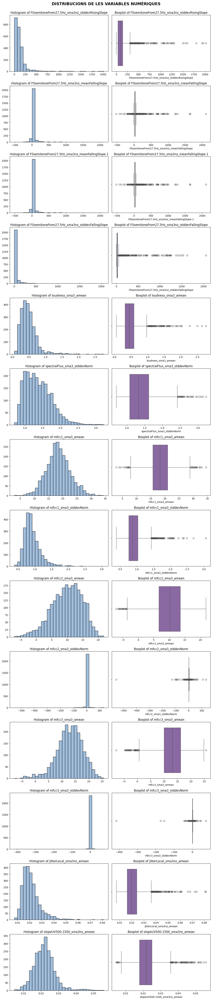

In [91]:
c6 = cm.BuPu(0.37)
c7 = cm.BuPu(0.66)

numeric_colums = [feature for feature in df_test.columns if df_test[feature].dtypes != 'object']
numeric_colums= numeric_colums[3:]

plt.figure(figsize=(12, len(numeric_colums) * 4))

for i, column in enumerate(numeric_colums):
    # Subplot per a l'histograma
    plt.subplot(len(numeric_colums), 2, 2*i + 1)
    plt.hist(df_test[column], bins=30, color=c6, edgecolor='black')
    plt.title(f'Histogram of {column}')
   
    # Subplot per al boxplot
    plt.subplot(len(numeric_colums), 2, 2*i + 2)
    sns.boxplot(x=df_test[column], color=c7)
    plt.title(f'Boxplot of {column}')

plt.suptitle('DISTRIBUCIONS DE LES VARIABLES NUMÈRIQUES', fontsize=16, y=1.00, fontweight='bold')
plt.tight_layout()
plt.show()

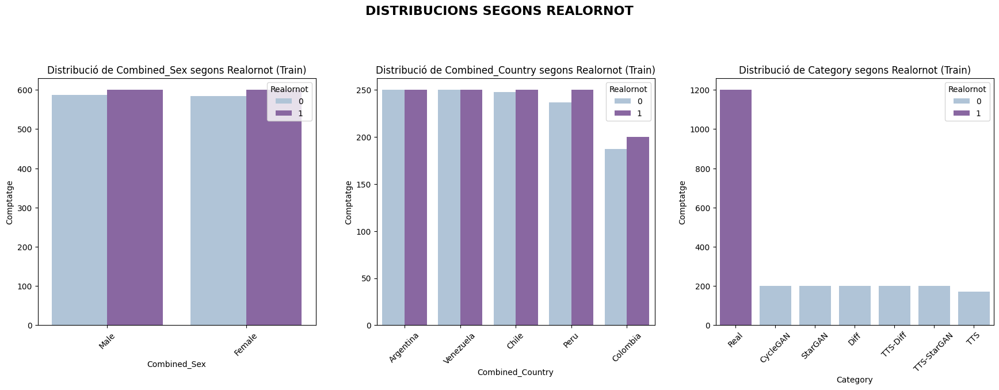

In [92]:
variables = ['Combined_Sex', 'Combined_Country', 'Category']

fig, axes = plt.subplots(1, 3, figsize=(18, 7))

for i, col in enumerate(variables): 
    sns.countplot(
        ax=axes[i],
        x=col, 
        hue='Realornot', 
        data=df_test, 
        order=df_test[col].value_counts().index, 
        palette='BuPu'
    )
    axes[i].set_title(f'Distribució de {col} segons Realornot (Train)')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Comptatge')
    axes[i].tick_params(axis='x', rotation=45)

plt.suptitle('DISTRIBUCIONS SEGONS REALORNOT', fontsize=16, y=1.00, fontweight='bold')
plt.tight_layout(pad=3.0)
plt.show()


In [93]:
print("\n\033[1mDISTRIBUCIONS NUMÈRIQUES SEGONS REALORNOT EN TEST_DATA\033[0m")

for col in variables:
    print(f"\n\033[1mColumna: {col}\033[0m")
    
    test_counts = (
        df_test.groupby([col, 'Realornot'])
        .size()
        .unstack(fill_value=0)
        .rename(columns={0: 'Test0', 1: 'Test1'})
    )
    
    print(test_counts)



DISTRIBUCIONS NUMÈRIQUES SEGONS REALORNOT EN TEST_DATA

Columna: Combined_Sex
Realornot     Test0  Test1
Combined_Sex              
Female          585    600
Male            587    600

Columna: Combined_Country
Realornot         Test0  Test1
Combined_Country              
Argentina           250    250
Chile               248    250
Colombia            187    200
Peru                237    250
Venezuela           250    250

Columna: Category
Realornot    Test0  Test1
Category                 
CycleGAN       200      0
Diff           200      0
Real             0   1200
StarGAN        200      0
TTS            172      0
TTS-Diff       200      0
TTS-StarGAN    200      0


In [94]:
categorical_columns = df_test.select_dtypes(include=['object', 'category']).columns
missing_values_categorical = df_test[categorical_columns].isnull().sum()

if missing_values_categorical.any():
    print("\033[1mMISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES EN TEST_CSV\033[0m\n")
    print(missing_values_categorical[missing_values_categorical > 0])
else:
    print("\n\033[1m NO HI HA MISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES EN TEST_CSV\033[0m")



 NO HI HA MISSINGS (NaN) EN LES VARIABLES CATEGÒRIQUES EN TEST_CSV


In [95]:
numeric_columns = [feature for feature in df_test.columns if df_test[feature].dtypes != 'object']
numeric_columns= numeric_columns[3:]

print("\n\033[1mVARIABLES AMB VALORS NEGATIUS:\033[0m")
for col in numeric_columns:
    count = (df_test[col] < 0).sum()
    if count > 0:
        print(f'{col}: {count}')

print("\n\033[1mVARIABLES AMB VALORS ZERO:\033[0m")
for col in numeric_columns:
    count_zeros = (df_test[col] == 0).sum()
    if count_zeros > 0:
        print(f'{col}: {count_zeros}')


VARIABLES AMB VALORS NEGATIUS:
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope: 69
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1: 69
mfcc2_sma3_amean: 82
mfcc2_sma3_stddevNorm: 82
mfcc3_sma3_amean: 42
mfcc3_sma3_stddevNorm: 42

VARIABLES AMB VALORS ZERO:
F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope: 23
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope: 2
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1: 2
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope: 53


In [96]:
columns_to_impute = ['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope','F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope']
median1 = 83.65197
median2 = 13.600735

df_test['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope'] = df_test['F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope'].replace(0, median1)
df_test['F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope'] = df_test['F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope'].replace(0, median2)

In [97]:
print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print("\033[1mVALORS ZERO EN LES VARIABLES IMPUTADES (TEST):\033[0m")
for col in columns_to_impute:
    count_zeros = df_test[col].value_counts().get(0, 0)
    if count_zeros > 0:
        print(f"'{col}': {count_zeros}")
    else:
        print(f"'{col}': no hi ha zeros, imputació correcta")


CONJUNT DE TEST
VALORS ZERO EN LES VARIABLES IMPUTADES (TEST):
'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope': no hi ha zeros, imputació correcta
'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope': no hi ha zeros, imputació correcta


In [98]:
def detect_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    is_outlier = (column < (Q1 - 1.5 * IQR)) | (column > (Q3 + 1.5 * IQR))
    return is_outlier

outliers = df_test[numeric_columns].apply(detect_outliers_iqr, axis=0)

outliers_summary = outliers.sum()

print('\n\033[1;4mCONJUNT DE TEST\033[0m')
print("\033[1mRESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:\033[0m\n")
print(outliers_summary)


CONJUNT DE TEST
RESUM DELS OUTLIERS PER COLUMNA NUMÈRICA:

F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope     129
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope      315
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope.1    315
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope    350
loudness_sma3_amean                                88
spectralFlux_sma3_stddevNorm                       34
mfcc1_sma3_amean                                   32
mfcc1_sma3_stddevNorm                              96
mfcc2_sma3_amean                                   16
mfcc2_sma3_stddevNorm                             298
mfcc3_sma3_amean                                   48
mfcc3_sma3_stddevNorm                             207
jitterLocal_sma3nz_amean                          113
slopeUV500-1500_sma3nz_amean                       73
dtype: int64


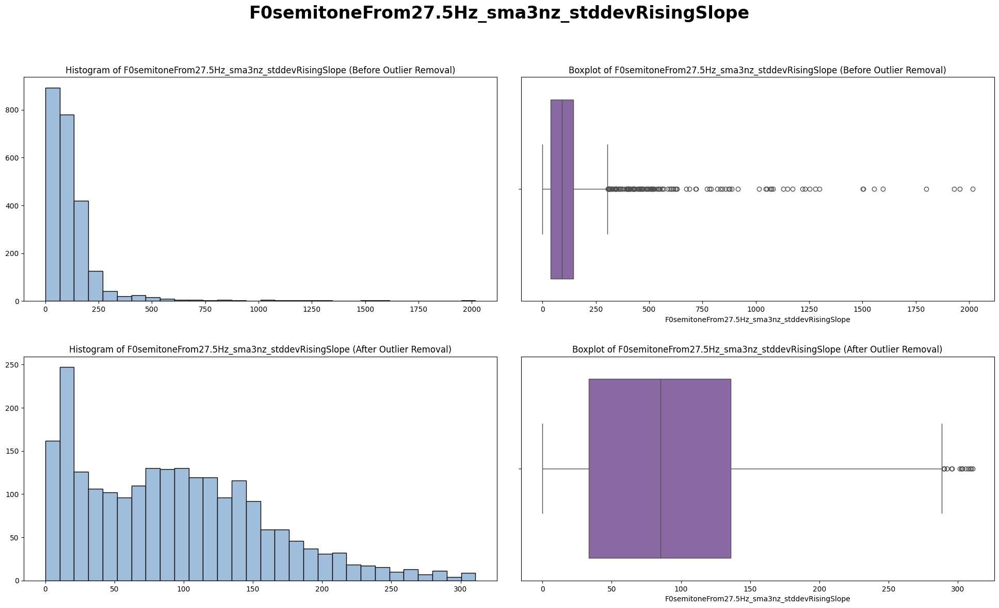

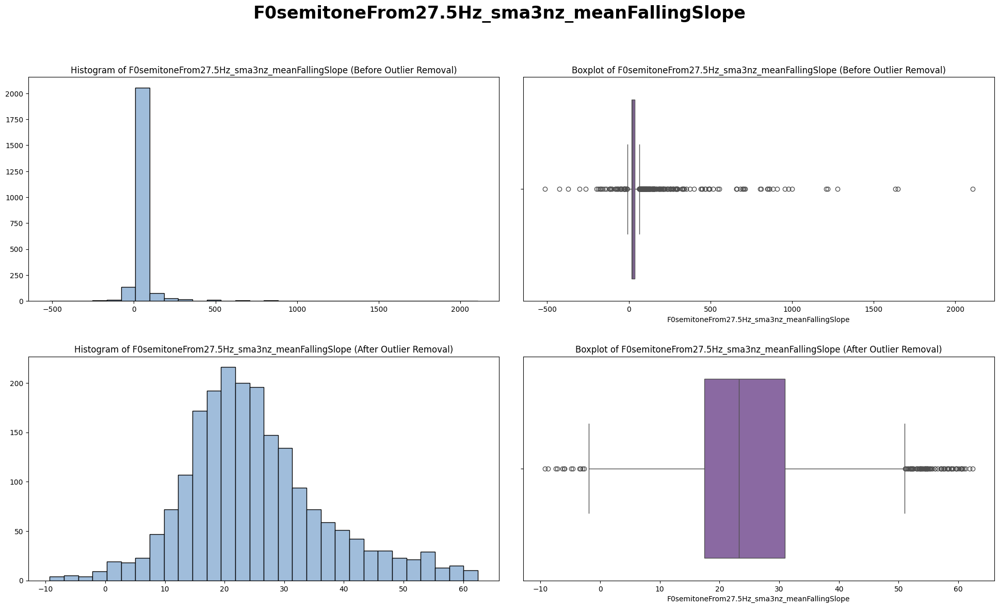

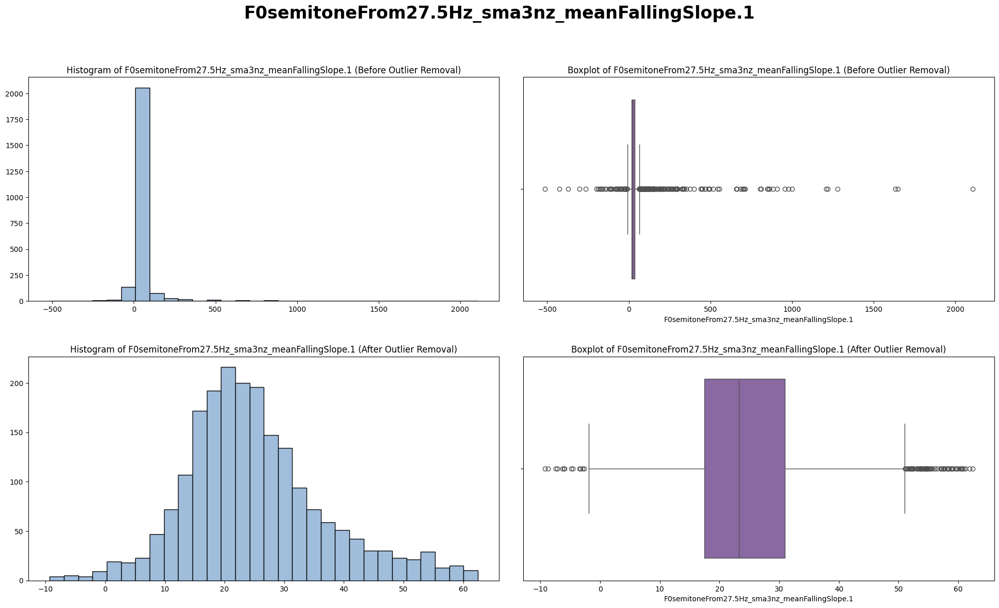

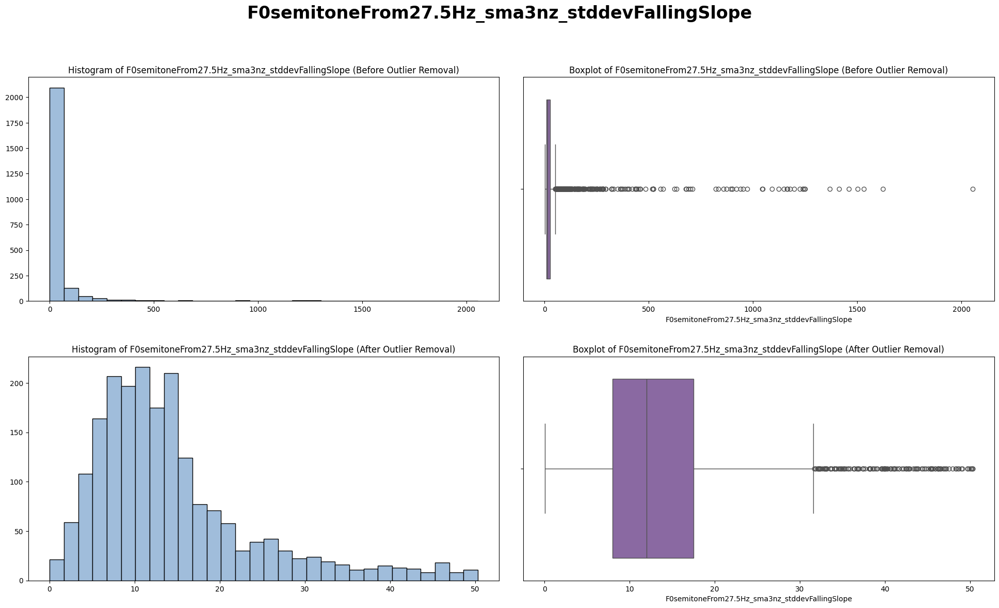

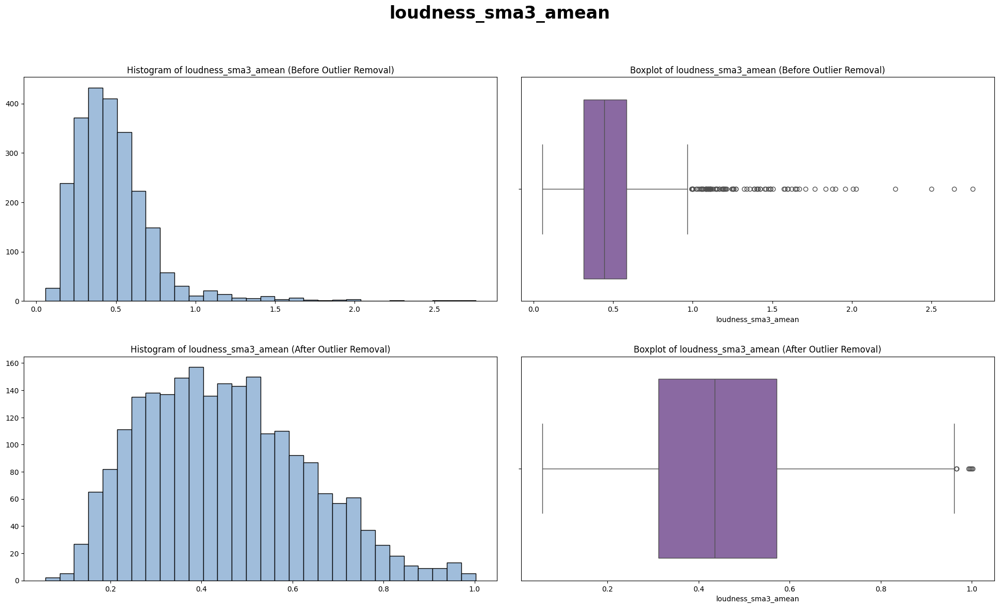

...

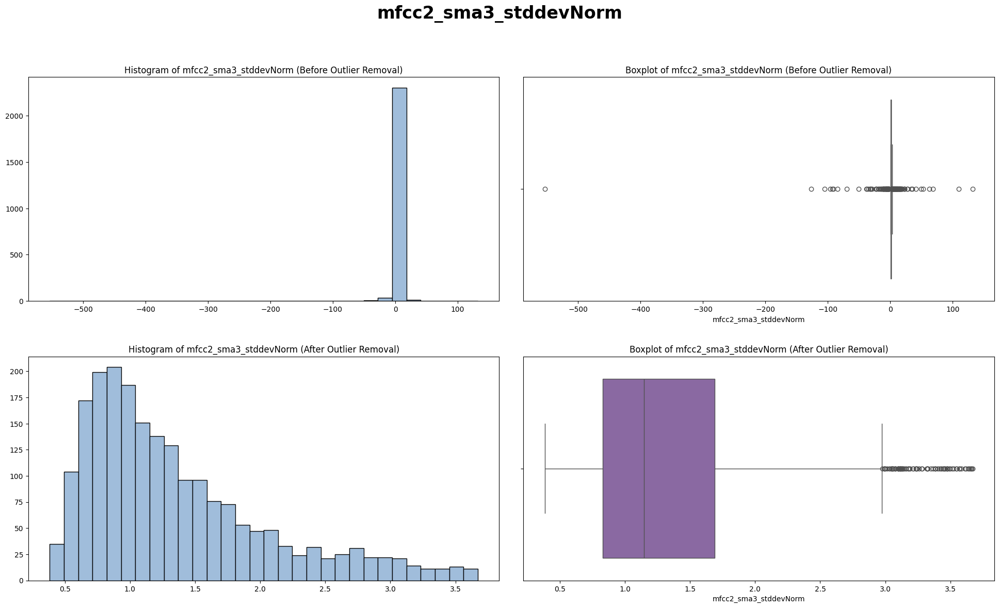

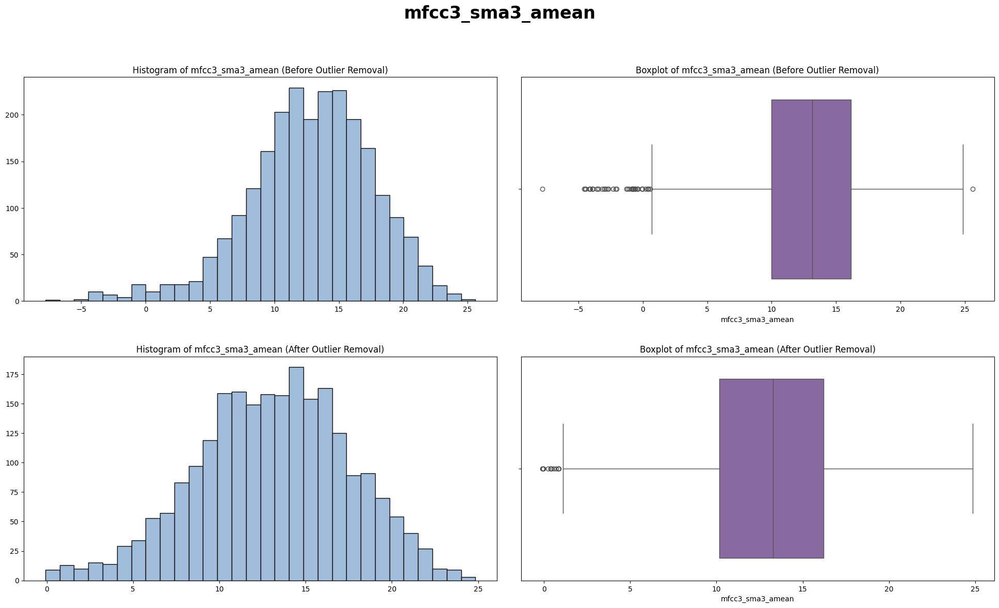

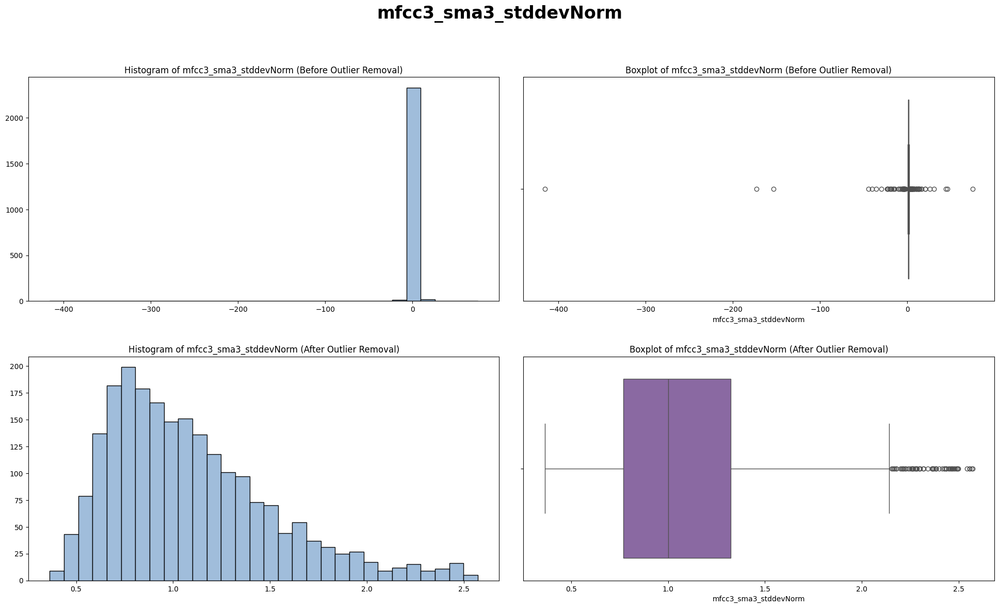

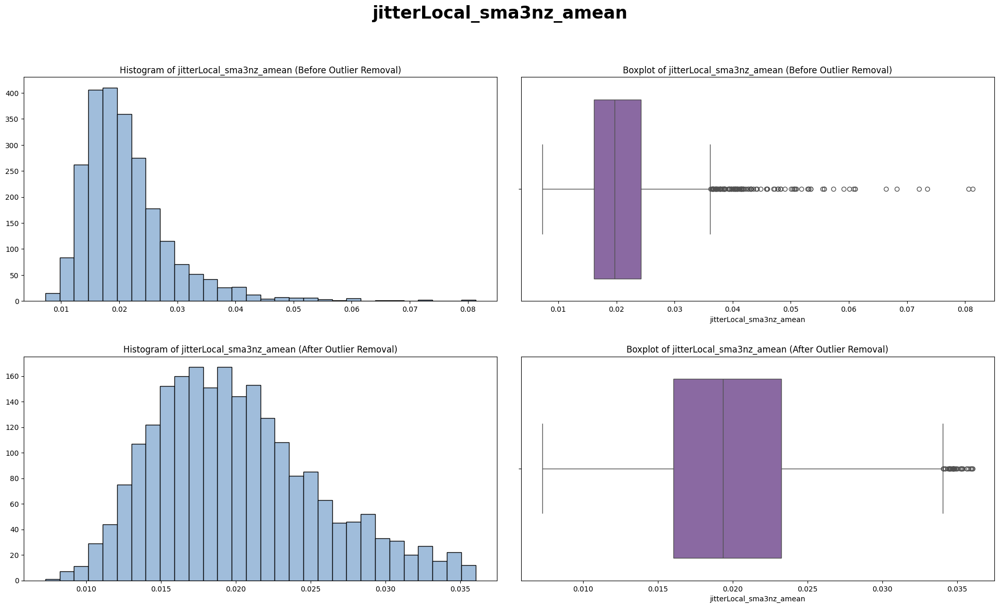

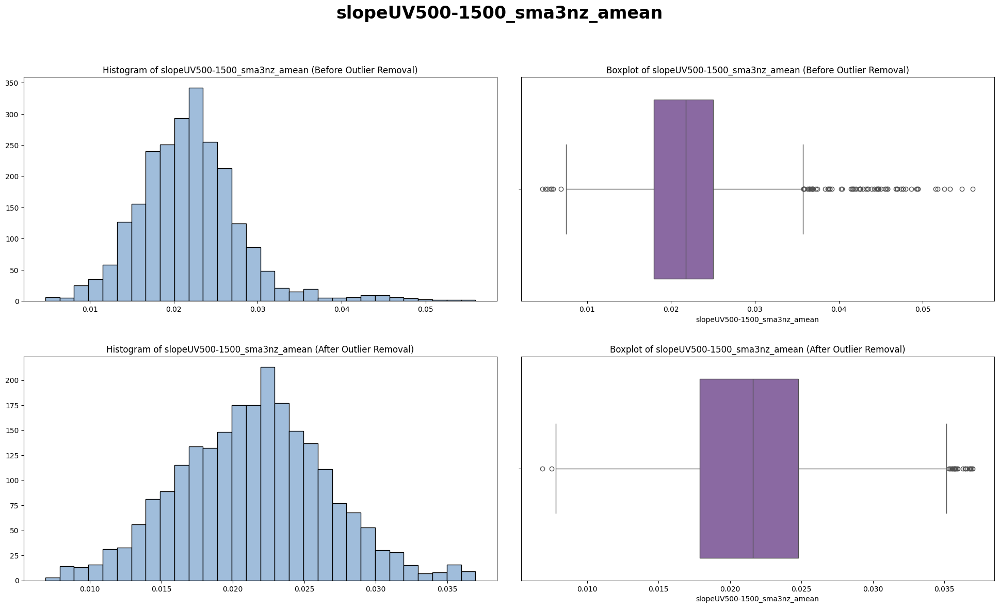

In [99]:
for column in numeric_colums:
    plt.figure(figsize=(20, 12))
   
    plt.suptitle(f'{column}', fontsize=24, fontweight='bold', y=1, ha='center')
   
    # 1. Histograma abans d'eliminar outliers
    plt.subplot(2, 2, 1)
    plt.hist(df_test[column], bins=30, color=c6, edgecolor='black')
    plt.title(f'Histogram of {column} (Before Outlier Removal)')
   
    # 2. Boxplot abans d'eliminar outliers
    plt.subplot(2, 2, 2)
    sns.boxplot(x=df_test[column], color=c7)
    plt.title(f'Boxplot of {column} (Before Outlier Removal)')
   
    Q1 = train_sub[column].quantile(0.25)
    Q3 = train_sub[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_test_sense_outliers = df_test[(df_test[column] >= lower_bound) & (df_test[column] <= upper_bound)]

    # 3. Histograma després d'eliminar outliers
    plt.subplot(2, 2, 3)
    plt.hist(df_test_sense_outliers[column], bins=30, color=c6, edgecolor='black')
    plt.title(f'Histogram of {column} (After Outlier Removal)')
   
    # 4. Boxplot després d'eliminar outliers
    plt.subplot(2, 2, 4)
    sns.boxplot(x=df_test_sense_outliers[column], color=c7)
    plt.title(f'Boxplot of {column} (After Outlier Removal)')

    plt.tight_layout(pad=3)
    plt.show()

In [100]:
print('\n\033[1;4mMIDA DEL DATASET\033[0m')
print("\033[1mdf_test:\033[0m",df_test.shape)
print("\033[1mdf_test_sense_outliers:\033[0m",df_test_sense_outliers.shape)


MIDA DEL DATASET
df_test: (2372, 21)
df_test_sense_outliers: (2313, 21)


In [101]:
df_test_sense_outliers.rename(columns=renamed_columns, inplace=True)
df_test_sense_outliers

,Category,UniqueID,Realornot,Combined_Sex,Combined_Country,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,...,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc1_stddev,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean
0,Real,63391,1,Female,Argentina,arf_07060,63390,82.441086,21.196049,21.196049,...,0.446090,1.173893,22.906178,0.691432,7.494303,2.075078,16.127365,0.903348,0.017495,0.015111
1,Real,70424,1,Female,Argentina,arf_07060,70423,4.898601,29.415117,29.415117,...,0.438447,1.208798,21.058222,0.734790,11.876312,1.329829,14.812564,1.101144,0.012679,0.020594
2,Real,57544,1,Female,Argentina,arf_07060,57543,20.743052,25.460447,25.460447,...,0.433276,1.211568,21.528429,0.699225,11.194599,1.351651,15.198386,1.067746,0.012571,0.015984
3,Real,59929,1,Female,Argentina,arf_07060,59928,54.955902,27.324966,27.324966,...,0.512443,1.135916,22.416296,0.623667,6.489924,2.612258,12.993800,1.192059,0.029118,0.020474
4,Real,67778,1,Female,Argentina,arf_07060,67777,59.542282,19.921278,19.921278,...,0.520452,1.123926,24.588675,0.605315,4.764306,3.644973,6.489363,2.621757,0.015645,0.012001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2367,TTS-StarGAN,48021,0,Male,Chile,clm_03349,48020,138.814600,17.778845,17.778845,...,0.739662,1.124009,19.231777,0.884832,7.893508,1.316128,9.206244,1.629746,0.023344,0.017713
2368,TTS-StarGAN,48189,0,Male,Chile,clm_03349,48188,125.063000,26.165586,26.165586,...,0.643774,0.852851,24.414658,0.502047,12.962941,0.969180,19.628962,0.777735,0.035253,0.015140
2369,TTS-StarGAN,52802,0,Male,Chile,clm_03349,52801,43.939915,14.109065,14.109065,...,0.841011,0.773530,26.282326,0.638116,6.821595,1.706020,11.314692,1.267146,0.017154,0.012657
2370,TTS-StarGAN,52946,0,Male,Chile,clm_03349,52945,134.370560,20.838404,20.838404,...,0.842642,0.822699,23.244658,0.809502,9.681833,1.298683,14.693679,1.088775,0.021686,0.010739


In [102]:
df_test_recodificada, one_hot_encoder_val = recodificar_categories_one_hot(df_test_sense_outliers, columnas_a_recodificar)

In [103]:
df_test_recodificada.dtypes

Category                       object
UniqueID                        int64
Realornot                       int64
Combined_ID                    object
Índex                           int64
F0_stddev_rising_slope        float64
F0_mean_falling_slope         float64
F0_mean_falling_slope.1       float64
F0_stddev_falling_slope       float64
loudness_mean                 float64
spectral_flux_stddev          float64
mfcc1_mean                    float64
mfcc1_stddev                  float64
mfcc2_mean                    float64
mfcc2_stddev                  float64
mfcc3_mean                    float64
mfcc3_stddev                  float64
jitter_local_mean             float64
slope_500_1500_mean           float64
Combined_Sex_Female           float64
Combined_Sex_Male             float64
Combined_Country_Argentina    float64
Combined_Country_Chile        float64
Combined_Country_Colombia     float64
Combined_Country_Peru         float64
Combined_Country_Venezuela    float64
dtype: objec

In [104]:
df_test_normalized = df_test_recodificada.copy()

for col in log_columns:
    df_test_normalized[col] = np.log1p(df_test_normalized[col])

numeric_columns_test = [feature for feature in df_test_recodificada.columns if df_test_recodificada[feature].dtypes != 'object']
numeric_columns_test = numeric_columns_test[4:18]

columns_to_normalize_test = [col for col in numeric_columns_test if col not in log_columns]
df_test_normalized[columns_to_normalize_test] = scaler.transform(df_test_normalized[columns_to_normalize_test])

df_test_normalized

,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
0,Real,63391,1,arf_07060,63390,4.424141,3.099914,3.099914,2.778213,0.368864,...,0.643615,0.017344,-1.224337,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
1,Real,70424,1,arf_07060,70423,1.774715,3.414940,3.414940,3.204037,0.363564,...,0.742482,0.012599,-0.210430,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
2,Real,57544,1,arf_07060,57543,3.079294,3.275651,3.275651,2.315187,0.359963,...,0.726459,0.012493,-1.062967,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
3,Real,59929,1,arf_07060,59928,4.024564,3.343744,3.343744,2.617218,0.413726,...,0.784841,0.028702,-0.232682,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
4,Real,67778,1,arf_07060,67777,4.103342,3.040767,3.040767,2.191191,0.419007,...,1.286959,0.015524,-1.799456,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2367,TTS-StarGAN,48021,0,clm_03349,48020,4.940317,2.932731,2.932731,2.747719,0.553691,...,0.966887,0.023075,-0.743281,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
2368,TTS-StarGAN,48189,0,clm_03349,48188,4.836782,3.301951,3.301951,2.318694,0.496995,...,0.575340,0.034646,-1.219057,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
2369,TTS-StarGAN,52802,0,clm_03349,52801,3.805326,2.715295,2.715295,2.250334,0.610315,...,0.818522,0.017009,-1.678257,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
2370,TTS-StarGAN,52946,0,clm_03349,52945,4.908016,3.083670,3.083670,2.371211,0.611201,...,0.736578,0.021454,-2.032855,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0


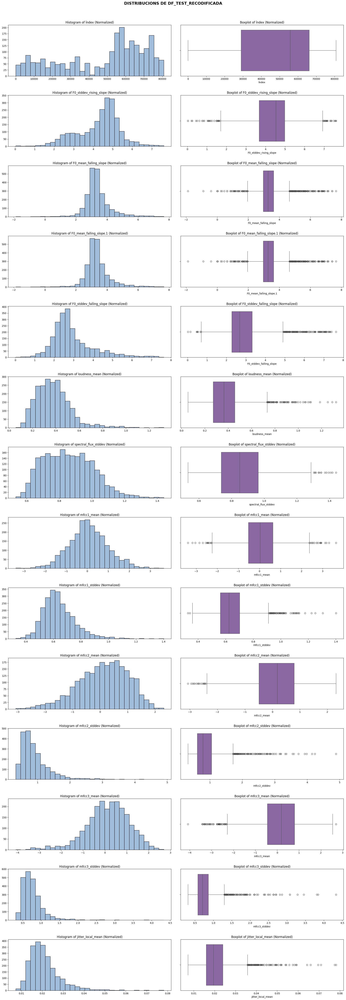

In [105]:
plt.figure(figsize=(20, len(df_test_recodificada.columns[4:18]) * 4))

for i, column in enumerate(df_test_recodificada.columns[4:18]):
    plt.subplot(len(df_test_recodificada.columns[4:18]), 2, 2*i + 1)
    plt.hist(df_test_normalized[column], bins=30, color=c6, edgecolor='black')
    plt.title(f'Histogram of {column} (Normalized)')
    
    plt.subplot(len(df_test_recodificada.columns[4:18]), 2, 2*i + 2)
    sns.boxplot(x=df_test_normalized[column], color=c7)
    plt.title(f'Boxplot of {column} (Normalized)')

plt.suptitle('DISTRIBUCIONS DE DF_TEST_RECODIFICADA', fontsize=16, y=1.00, fontweight='bold')
plt.tight_layout(pad=3)
plt.show()

In [106]:
nan_percentages_test = df_test_normalized.isnull().mean() * 100
nan_percentages_test_filtered = nan_percentages[nan_percentages > 0]
print("\n\033[1mVARIABLES AMB MISSINGS (%):\033[0m")
nan_percentages_test_filtered


VARIABLES AMB MISSINGS (%):


F0_mean_falling_slope      3.120802
F0_mean_falling_slope.1    3.120802
mfcc1_stddev               0.010334
mfcc2_stddev               6.003927
mfcc3_stddev               1.643071
dtype: float64

In [107]:
print(f"\033[1mNOMBRE DE FILES ABANS DE L'ELIMINACIÓ:\033[0m {df_test_normalized.shape[0]}")

df_test_normalized_cleaned = df_test_normalized.dropna(subset=nan_percentages_filtered.index)
print(f"\033[1mNOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ:\033[0m {df_test_normalized_cleaned.shape[0]}")
df_test_normalized_cleaned

NOMBRE DE FILES ABANS DE L'ELIMINACIÓ: 2313
NOMBRE DE FILES DESPRÉS DE L'ELIMINACIÓ: 2160


,Category,UniqueID,Realornot,Combined_ID,Índex,F0_stddev_rising_slope,F0_mean_falling_slope,F0_mean_falling_slope.1,F0_stddev_falling_slope,loudness_mean,...,mfcc3_stddev,jitter_local_mean,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
0,Real,63391,1,arf_07060,63390,4.424141,3.099914,3.099914,2.778213,0.368864,...,0.643615,0.017344,-1.224337,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
1,Real,70424,1,arf_07060,70423,1.774715,3.414940,3.414940,3.204037,0.363564,...,0.742482,0.012599,-0.210430,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
2,Real,57544,1,arf_07060,57543,3.079294,3.275651,3.275651,2.315187,0.359963,...,0.726459,0.012493,-1.062967,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
3,Real,59929,1,arf_07060,59928,4.024564,3.343744,3.343744,2.617218,0.413726,...,0.784841,0.028702,-0.232682,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
4,Real,67778,1,arf_07060,67777,4.103342,3.040767,3.040767,2.191191,0.419007,...,1.286959,0.015524,-1.799456,1.014469,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2367,TTS-StarGAN,48021,0,clm_03349,48020,4.940317,2.932731,2.932731,2.747719,0.553691,...,0.966887,0.023075,-0.743281,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
2368,TTS-StarGAN,48189,0,clm_03349,48188,4.836782,3.301951,3.301951,2.318694,0.496995,...,0.575340,0.034646,-1.219057,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
2369,TTS-StarGAN,52802,0,clm_03349,52801,3.805326,2.715295,2.715295,2.250334,0.610315,...,0.818522,0.017009,-1.678257,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0
2370,TTS-StarGAN,52946,0,clm_03349,52945,4.908016,3.083670,3.083670,2.371211,0.611201,...,0.736578,0.021454,-2.032855,-0.985738,1.0,0.0,1.0,0.0,0.0,0.0


In [108]:
df_test_normalized_cleaned_remove = df_test_normalized_cleaned.drop(columns=variables_to_remove)

print("\033[1m\033[4mCONJUNT DE TEST:\033[0m")
print("\033[1mSHAPE ABANS DE L'ELIMINACIÓ:\033[0m", df_test_normalized_cleaned.shape)
print("\033[1mSHAPE DESPRÉS DE L'ELIMINACIÓ:\033[0m", df_test_normalized_cleaned_remove.shape)

CONJUNT DE TEST:
SHAPE ABANS DE L'ELIMINACIÓ: (2160, 26)
SHAPE DESPRÉS DE L'ELIMINACIÓ: (2160, 18)


In [109]:
df_test_pca = df_test_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])

test_reduced = pca_optimal.transform(df_test_pca)

pca = pd.DataFrame(test_reduced, columns=[f'PC{i+1}' for i in range(n_components_80)], index=df_test_pca.index)

test_components = pd.DataFrame(pca_optimal.components_, 
                                         columns=df_test_pca.columns, 
                                         index=[f'PC{i+1}' for i in range(n_components_80)])

print("\n\033[1mCÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS PEL TEST:\033[0m")
test_components


CÀRREGUES DELS PRIMERS 5 COMPONENTS PRINCIPALS PEL TEST:


,F0_mean_falling_slope,loudness_mean,spectral_flux_stddev,mfcc1_mean,mfcc2_mean,mfcc2_stddev,mfcc3_mean,mfcc3_stddev,slope_500_1500_mean,Combined_Sex_Female,Combined_Sex_Male,Combined_Country_Argentina,Combined_Country_Chile,Combined_Country_Colombia,Combined_Country_Peru,Combined_Country_Venezuela
PC1,-0.056935,0.029011,-0.008382,-0.240010,-0.441272,0.270901,-0.482375,0.167549,0.096081,0.560755,-0.280349,-0.027817,-0.011389,0.014435,-0.040920,0.065691
PC2,-0.033694,-0.042388,0.062176,-0.642395,0.167432,-0.126312,0.151700,-0.076648,0.702711,-0.041617,0.020807,-0.022679,0.002213,0.092470,-0.039524,-0.032479
PC3,0.137180,-0.060085,0.060967,-0.079433,0.456765,-0.229207,0.298115,-0.104174,-0.239722,0.643691,-0.321812,0.113532,-0.033562,-0.070991,0.073566,-0.082545
PC4,0.792401,-0.004467,0.036689,-0.359255,0.074042,-0.024957,-0.265495,0.063751,-0.267627,-0.167441,0.083712,-0.200390,0.087757,0.014944,0.076165,0.021524
PC5,0.583790,0.009808,-0.046612,0.412382,-0.271350,0.169740,0.324166,-0.074152,0.434799,0.131639,-0.065813,0.195974,-0.026656,-0.006929,-0.154601,-0.007788


In [110]:
y_test_svm = svm_best.predict(pca)

df_test_metrics_svm = classification_report(df_test_normalized_cleaned_remove['Realornot'], y_test_svm)
print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(df_test_metrics_svm)


Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.61      0.57      0.58       985
           1       0.65      0.69      0.67      1175

    accuracy                           0.63      2160
   macro avg       0.63      0.63      0.63      2160
weighted avg       0.63      0.63      0.63      2160



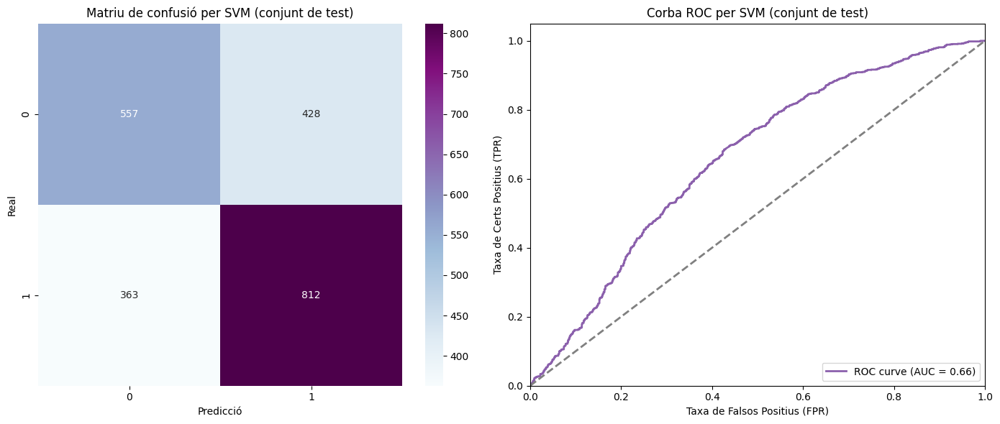

In [111]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per SVM (conjunt de test)
sns.heatmap(confusion_matrix(df_test_normalized_cleaned_remove['Realornot'], y_test_svm), annot=True, fmt="d", cmap="BuPu", ax=ax[0])
ax[0].set_title("Matriu de confusió per SVM (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

y_test_svm = svm_best.predict_proba(pca)[:, 1]

fpr_test, tpr_test, thresholds_test = roc_curve(df_test_normalized_cleaned_remove['Realornot'], y_test_svm)
roc_auc_test = auc(fpr_test, tpr_test)

# Subplot 2: Corba ROC per SVM (conjunt de test)
ax[1].plot(fpr_test, tpr_test, color=c7, lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per SVM (conjunt de test)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

## 5. Implementació dels Models sense PCA

#### 5.1. Model KNN

In [112]:
knn_params = {
    'n_neighbors': [1, 3, 5, 7, 10],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'p': [1, 2, 3]  # Només s'utilitza si la mètrica és 'minkowski'
}

knn = KNeighborsClassifier()

X_train = train_sub_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_train = train_sub_normalized_cleaned_remove['Realornot']

X_val = val_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_val = val_data_normalized_cleaned_remove['Realornot']

X_test = test_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_test = test_data_normalized_cleaned_remove['Realornot']

knn_grid = GridSearchCV(knn, knn_params, cv=5, scoring='accuracy', verbose=1)
knn_grid.fit(X_train, y_train)

print(f"\033[1mMILLORS HIPERPARÀMETRES PER KNN:\033[0m {knn_grid.best_params_}")
knn_best = knn_grid.best_estimator_

results = knn_grid.cv_results_

print("\n\033[1mRESULTATS DE LES DIFERENTS COMBINACIONS D'HIPERPARÀMETRES\033[0m")
for mean, std, params in zip(results['mean_test_score'], results['std_test_score'], results['params']):
    if params == knn_grid.best_params_:
        print(f"\033[1m\033[91m{params}: Mean Accuracy = {mean:.4f} ± {std:.4f} <-- MILLOR COMBINACIÓ!\033[0m")
    else:
        print(f"{params}: Mean Accuracy = {mean:.4f} ± {std:.4f}")

Fitting 5 folds for each of 90 candidates, totalling 450 fits
MILLORS HIPERPARÀMETRES PER KNN: {'metric': 'manhattan', 'n_neighbors': 10, 'p': 1, 'weights': 'distance'}

RESULTATS DE LES DIFERENTS COMBINACIONS D'HIPERPARÀMETRES
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}: Mean Accuracy = 0.7308 ± 0.0061
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 1, 'weights': 'distance'}: Mean Accuracy = 0.7308 ± 0.0061
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 2, 'weights': 'uniform'}: Mean Accuracy = 0.7308 ± 0.0061
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 2, 'weights': 'distance'}: Mean Accuracy = 0.7308 ± 0.0061
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 3, 'weights': 'uniform'}: Mean Accuracy = 0.7308 ± 0.0061
{'metric': 'euclidean', 'n_neighbors': 1, 'p': 3, 'weights': 'distance'}: Mean Accuracy = 0.7308 ± 0.0061
{'metric': 'euclidean', 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}: Mean Accuracy = 0.7480 ± 0.0090
{'metric': 'euclidean', 'n_neighbo

In [113]:
y_train_pred = knn_best.predict(X_train)
y_val_pred = knn_best.predict(X_val)

train_metrics = classification_report(y_train, y_train_pred)
val_metrics = classification_report(y_val, y_val_pred)

print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics)

print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics)


Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4094
           1       1.00      1.00      1.00      4655

    accuracy                           1.00      8749
   macro avg       1.00      1.00      1.00      8749
weighted avg       1.00      1.00      1.00      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.82      0.70      0.76      1768
           1       0.77      0.87      0.81      2006

    accuracy                           0.79      3774
   macro avg       0.80      0.78      0.79      3774
weighted avg       0.79      0.79      0.79      3774



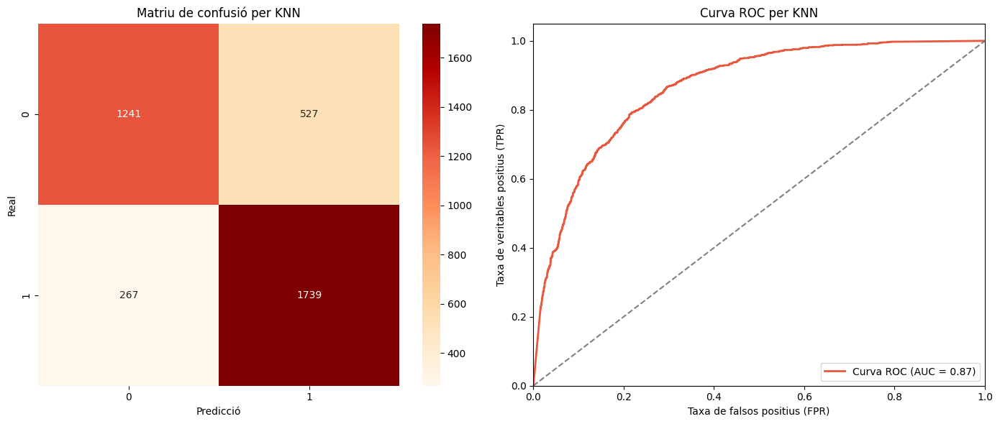

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió
sns.heatmap(confusion_matrix(y_val, y_val_pred), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per KNN")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Curva ROC
fpr, tpr, thresholds = roc_curve(y_val, knn_best.predict_proba(X_val)[:, 1])
roc_auc = auc(fpr, tpr)
ax[1].plot(fpr, tpr, color=c3, lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='gray', linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de veritables positius (TPR)')
ax[1].set_title('Curva ROC per KNN')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

In [115]:
y_test_pred = knn_best.predict(X_test)

test_metrics = classification_report(y_test, y_test_pred)

print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(test_metrics)


Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.82      0.68      0.75      1468
           1       0.75      0.86      0.81      1649

    accuracy                           0.78      3117
   macro avg       0.79      0.77      0.78      3117
weighted avg       0.78      0.78      0.78      3117



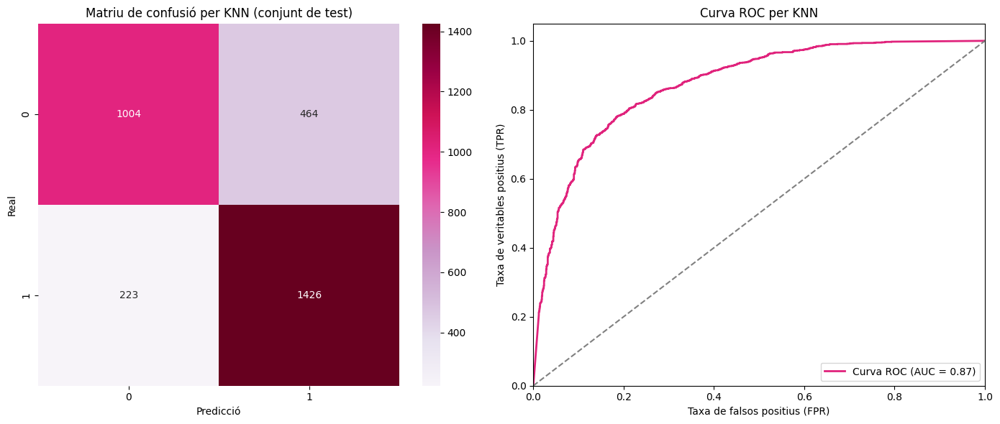

In [116]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió (Conjunt de test)
sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="d", cmap="PuRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per KNN (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Curva ROC
y_test_proba = knn_best.predict_proba(X_test)[:, 1]
fpr_test, tpr_test, thresholds = roc_curve(y_test, y_test_proba)

roc_auc = auc(fpr_test, tpr_test)

ax[1].plot(fpr_test, tpr_test, color=c5, lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='gray', linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de veritables positius (TPR)')
ax[1].set_title('Curva ROC per KNN')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

#### 5.2. Model d'Arbre de Decisió

In [117]:
tree_params = {
    'max_depth': [3, 5, 7, 10, 15, 20, None],
    'min_samples_split': [2, 3, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 5, 10, 20],
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random']
}

tree = DecisionTreeClassifier()

X_train = train_sub_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_train = train_sub_normalized_cleaned_remove['Realornot']

tree_grid = GridSearchCV(tree, tree_params, cv=5, scoring='accuracy', verbose=1)
tree_grid.fit(X_train, y_train)

print(f"\033[1mMillors hiperparàmetres per Arbre de Decisió:\033[0m {tree_grid.best_params_}")
tree_best = tree_grid.best_estimator_

results = tree_grid.cv_results_

print("\n\033[1mResultats de la cerca en graella:\033[0m")
for mean, std, params in zip(results['mean_test_score'], results['std_test_score'], results['params']):
    if params == tree_grid.best_params_:
        print(f"\033[1m\033[91m{params}: Mean Accuracy = {mean:.4f} ± {std:.4f} <-- MILLOR COMBINACIÓ!\033[0m")
    else:
        print(f"{params}: Mean Accuracy = {mean:.4f} ± {std:.4f}")

Fitting 5 folds for each of 840 candidates, totalling 4200 fits
Millors hiperparàmetres per Arbre de Decisió: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'splitter': 'best'}

Resultats de la cerca en graella:
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}: Mean Accuracy = 0.7122 ± 0.0082
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'random'}: Mean Accuracy = 0.6563 ± 0.0368
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3, 'splitter': 'best'}: Mean Accuracy = 0.7122 ± 0.0082
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 3, 'splitter': 'random'}: Mean Accuracy = 0.6738 ± 0.0203
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 5, 'splitter': 'best'}: Mean Accuracy = 0.7122 ± 0.0082
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf

In [118]:
X_val = val_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_val = val_data_normalized_cleaned_remove['Realornot']

y_train_pred_tree = tree_best.predict(X_train)
y_val_pred_tree = tree_best.predict(X_val)

train_metrics_tree = classification_report(y_train, y_train_pred_tree)
val_metrics_tree = classification_report(y_val, y_val_pred_tree)

print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics_tree)

print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics_tree)



Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       0.91      0.80      0.85      4094
           1       0.84      0.93      0.89      4655

    accuracy                           0.87      8749
   macro avg       0.88      0.87      0.87      8749
weighted avg       0.88      0.87      0.87      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.80      0.67      0.73      1768
           1       0.75      0.85      0.80      2006

    accuracy                           0.77      3774
   macro avg       0.78      0.76      0.76      3774
weighted avg       0.77      0.77      0.77      3774



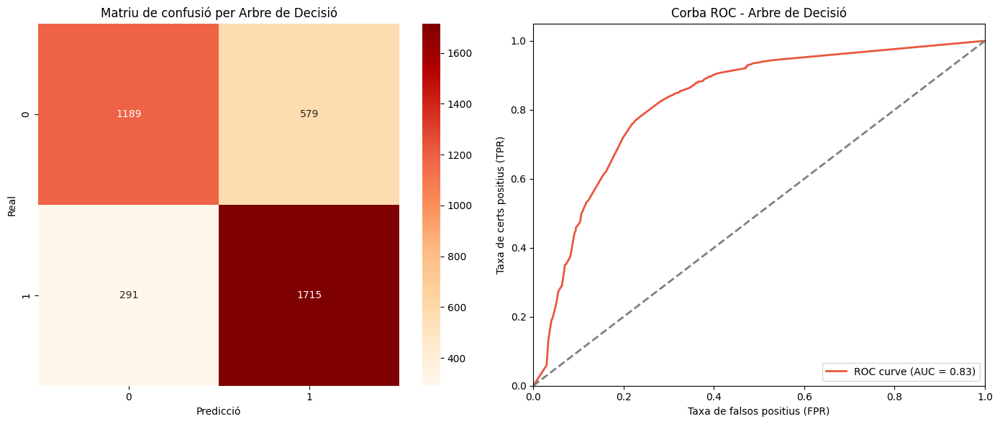

In [119]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per l'arbre de decisió (conjunt de validació)
sns.heatmap(confusion_matrix(y_val, y_val_pred_tree), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per Arbre de Decisió")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Corba ROC per l'arbre de decisió (conjunt de validació)
y_val_proba_tree = tree_best.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_proba_tree)
roc_auc = auc(fpr, tpr)
ax[1].plot(fpr, tpr, color=c3, lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de certs positius (TPR)')
ax[1].set_title('Corba ROC - Arbre de Decisió')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

In [120]:
X_test = test_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_test = test_data_normalized_cleaned_remove['Realornot']

y_test_pred_tree = tree_best.predict(X_test)
y_test_proba_tree = tree_best.predict_proba(X_test)[:, 1]

test_metrics_tree = classification_report(y_test, y_test_pred_tree)

print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(test_metrics_tree)


Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.82      0.68      0.74      1468
           1       0.75      0.87      0.80      1649

    accuracy                           0.78      3117
   macro avg       0.78      0.77      0.77      3117
weighted avg       0.78      0.78      0.78      3117



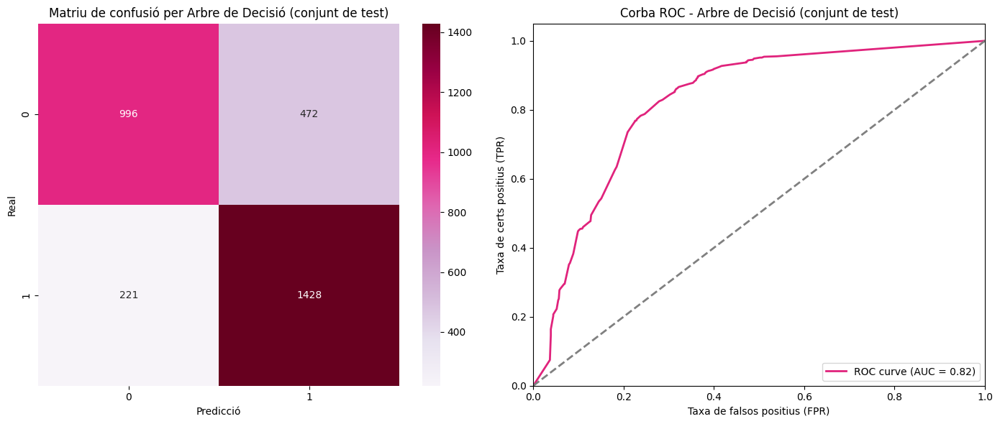

In [121]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per Arbre de Decisió (conjunt de test)
sns.heatmap(confusion_matrix(y_test, y_test_pred_tree), annot=True, fmt="d", cmap="PuRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per Arbre de Decisió (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Corba ROC per Arbre de Decisió (conjunt de test)
fpr_test, tpr_test, thresholds = roc_curve(y_test, y_test_proba_tree)
roc_auc_test = auc(fpr_test, tpr_test)
ax[1].plot(fpr_test, tpr_test, color=c5, lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax[1].plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de falsos positius (FPR)')
ax[1].set_ylabel('Taxa de certs positius (TPR)')
ax[1].set_title('Corba ROC - Arbre de Decisió (conjunt de test)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

#### 5.3. Model SVM

In [122]:
svm_params_optimized = {
    'C': [0.1, 1, 10],               
    'kernel': ['linear', 'rbf'],     
    'gamma': ['scale'],              
}

svm = SVC(probability=True)

X_train = train_sub_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_train = train_sub_normalized_cleaned_remove['Realornot']

svm_grid = GridSearchCV(svm, svm_params_optimized, cv=5, scoring='accuracy', verbose=1)
svm_grid.fit(X_train, y_train)

print(f"\033[1mMillors hiperparàmetres per SVM:\033[0m {svm_grid.best_params_}")
svm_best = svm_grid.best_estimator_

results_df = pd.DataFrame(svm_grid.cv_results_)
results_df = results_df[['param_C', 'param_kernel', 'mean_test_score']]
results_df = results_df.sort_values(by='mean_test_score', ascending=False)
print("\nResultats de les combinacions d'hiperparàmetres:\n")
print(results_df)

print("\n\033[1;31mMillor combinació d'hiperparàmetres:\033[0m")
print(results_df.iloc[0])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Millors hiperparàmetres per SVM: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

Resultats de les combinacions d'hiperparàmetres:

   param_C param_kernel  mean_test_score
5     10.0          rbf         0.829694
3      1.0          rbf         0.782945
1      0.1          rbf         0.725910
4     10.0       linear         0.714480
2      1.0       linear         0.714252
0      0.1       linear         0.710365

Millor combinació d'hiperparàmetres:
param_C                10.0
param_kernel            rbf
mean_test_score    0.829694
Name: 5, dtype: object


In [123]:
X_val = val_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_val = val_data_normalized_cleaned_remove['Realornot']

y_train_pred_svm = svm_best.predict(X_train)
y_val_pred_svm = svm_best.predict(X_val)

train_metrics_svm = classification_report(y_train, y_train_pred_svm)
val_metrics_svm = classification_report(y_val, y_val_pred_svm)

print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics_svm)

print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics_svm)


Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       0.88      0.79      0.83      4094
           1       0.83      0.90      0.87      4655

    accuracy                           0.85      8749
   macro avg       0.85      0.85      0.85      8749
weighted avg       0.85      0.85      0.85      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.85      0.76      0.80      1768
           1       0.81      0.88      0.84      2006

    accuracy                           0.82      3774
   macro avg       0.83      0.82      0.82      3774
weighted avg       0.83      0.82      0.82      3774



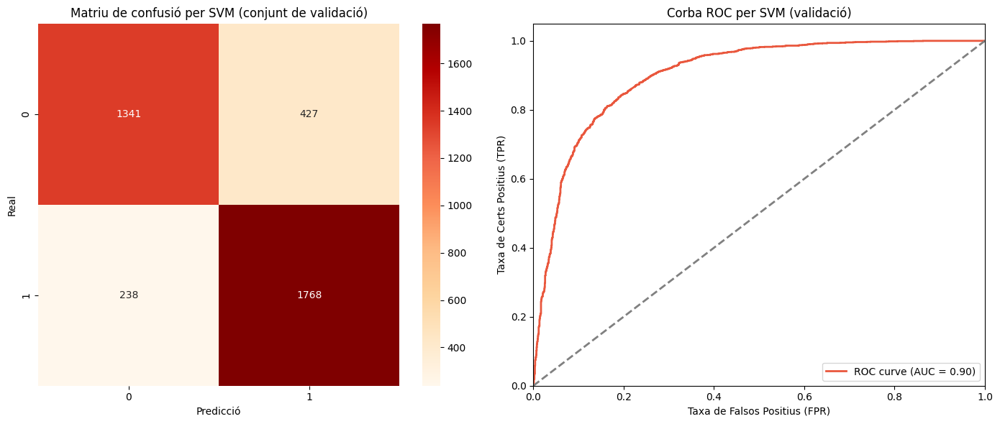

In [124]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per SVM (conjunt de validació)
sns.heatmap(confusion_matrix(y_val, y_val_pred_svm), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per SVM (conjunt de validació)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Corba ROC per SVM (conjunt de validació)
y_val_proba_svm = svm_best.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_proba_svm)
roc_auc = auc(fpr, tpr)
ax[1].plot(fpr, tpr, color=c3, lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per SVM (validació)')
ax[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

In [125]:
X_test = test_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_test = test_data_normalized_cleaned_remove['Realornot']

y_test_pred_svm = svm_best.predict(X_test)
y_test_proba_svm = svm_best.predict_proba(X_test)[:, 1]

test_metrics_svm = classification_report(y_test, y_test_pred_svm)

print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(test_metrics_svm)


Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.86      0.76      0.81      1468
           1       0.80      0.89      0.85      1649

    accuracy                           0.83      3117
   macro avg       0.83      0.82      0.83      3117
weighted avg       0.83      0.83      0.83      3117



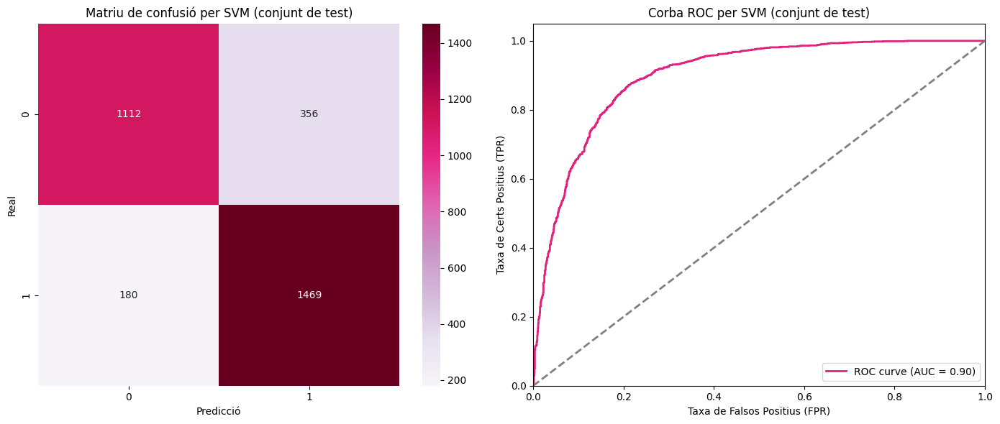

In [126]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per SVM (conjunt de test)
sns.heatmap(confusion_matrix(y_test, y_test_pred_svm), annot=True, fmt="d", cmap="PuRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per SVM (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Corba ROC per SVM (conjunt de test)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_proba_svm)
roc_auc_test = auc(fpr_test, tpr_test)
ax[1].plot(fpr_test, tpr_test, color=c5, lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per SVM (conjunt de test)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

#### 5.4. Selecció i Aplicació del millor model al conjunt de Test Final

In [127]:
def evaluate_model(y_true, y_pred, y_proba=None):
    metrics = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'F1-Score': f1_score(y_true, y_pred, average='weighted'),
        'Precision': precision_score(y_true, y_pred, average='weighted'),
        'Recall': recall_score(y_true, y_pred, average='weighted')
    }
    if y_proba is not None:
        metrics['AUC-ROC'] = roc_auc_score(y_true, y_proba)
    return metrics

models = {
    'KNN': knn_best,
    'Decision Tree': tree_best,
    'SVM': svm_best
}

X_val = val_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_val = val_data_normalized_cleaned_remove['Realornot']

metrics_comparison = {}

for model_name, model in models.items():
    print(f"\033[1mAvaluant {model_name}\033[0m")
    
    y_val_pred = model.predict(X_val)
    y_val_proba = model.predict_proba(X_val)[:, 1] if hasattr(model, "predict_proba") else None
    
    val_metrics = evaluate_model(y_val, y_val_pred, y_val_proba)
    
    metrics_comparison[model_name] = val_metrics
    print(f"Mètriques per {model_name}:\n", val_metrics)
    print("\n")

print("\033[1mComparació de mètriques entre els models\033[0m")
metrics_comparison_df = pd.DataFrame(metrics_comparison).T  
print(metrics_comparison_df)

sorted_models = metrics_comparison_df.sort_values(by='AUC-ROC', ascending=False)

print("\n\033[1mModels ordenats de millor a pitjor basats en l'AUC-ROC:\033[0m")
print(sorted_models)

best_model_name = sorted_models.index[0]
best_model = models[best_model_name]
print(f"\n\033[1;32mEl millor model és {best_model_name} basat en l'AUC-ROC\033[0m")

Avaluant KNN
Mètriques per KNN:
 {'Accuracy': 0.789613142554319, 'F1-Score': 0.7876666795206121, 'Precision': 0.7934375468690836, 'Recall': 0.789613142554319, 'AUC-ROC': np.float64(0.8662835024338749)}


Avaluant Decision Tree
Mètriques per Decision Tree:
 {'Accuracy': 0.7694753577106518, 'F1-Score': 0.7669749483702971, 'Precision': 0.773731709041212, 'Recall': 0.7694753577106518, 'AUC-ROC': np.float64(0.8252035466000189)}


Avaluant SVM
Mètriques per SVM:
 {'Accuracy': 0.823794382617912, 'F1-Score': 0.8227830336519157, 'Precision': 0.8259881007379857, 'Recall': 0.823794382617912, 'AUC-ROC': np.float64(0.9012851152425079)}


Comparació de mètriques entre els models
               Accuracy  F1-Score  Precision    Recall   AUC-ROC
KNN            0.789613  0.787667   0.793438  0.789613  0.866284
Decision Tree  0.769475  0.766975   0.773732  0.769475  0.825204
SVM            0.823794  0.822783   0.825988  0.823794  0.901285

Models ordenats de millor a pitjor basats en l'AUC-ROC:
         

In [128]:
y_test_svm = svm_best.predict(df_test_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID']))

df_test_metrics_svm = classification_report(df_test_normalized_cleaned_remove['Realornot'], y_test_svm)
print("\n\033[1mMètriques per al conjunt de test final:\033[0m")
print(df_test_metrics_svm)


Mètriques per al conjunt de test final:
              precision    recall  f1-score   support

           0       0.74      0.65      0.69       985
           1       0.73      0.81      0.77      1175

    accuracy                           0.74      2160
   macro avg       0.74      0.73      0.73      2160
weighted avg       0.74      0.74      0.74      2160



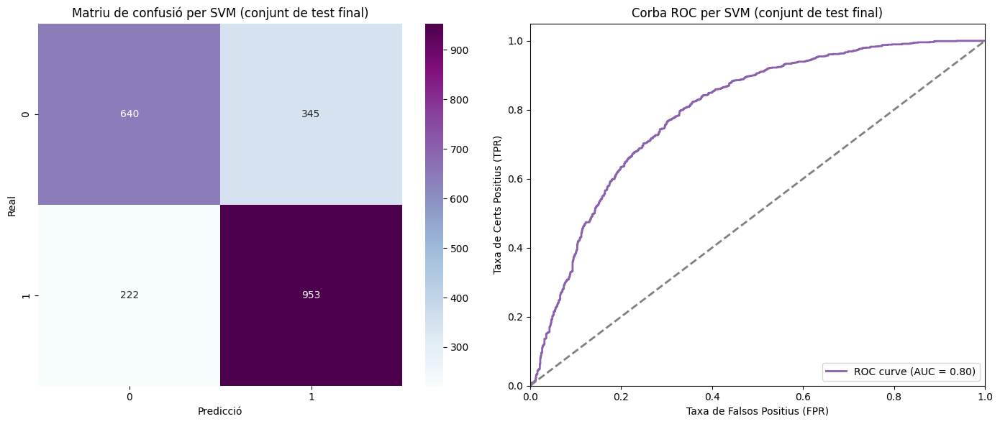

In [129]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per SVM (conjunt de test final)
sns.heatmap(confusion_matrix(df_test_normalized_cleaned_remove['Realornot'], y_test_svm), annot=True, fmt="d", cmap="BuPu", ax=ax[0])
ax[0].set_title("Matriu de confusió per SVM (conjunt de test final)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

y_test_proba_svm = svm_best.predict_proba(df_test_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID']))[:, 1]

fpr_test, tpr_test, thresholds_test = roc_curve(df_test_normalized_cleaned_remove['Realornot'], y_test_proba_svm)
roc_auc_test = auc(fpr_test, tpr_test)

# Subplot 2: Corba ROC per SVM (conjunt de test final)
ax[1].plot(fpr_test, tpr_test, color=c7, lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per SVM (conjunt de test final)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()

## 6. Model Card

In [130]:
model_card_text = """
Model Card
1. Informació General
Persona responsable del desenvolupament del model: Paula Justo Gili
Data de Creació del model: 28 de Desembre de 2024
Versió: 1.0

Aquest model ha estat desenvolupat per classificar mostres com a Real o Sintètic. L’objectiu principal és identificar de manera fiable mostres sintètiques generades mitjançant tècniques d’intel·ligència artificial per a possibles aplicacions futures com la detecció de l’autenticació de veu.

2. Context i Objectius del Model
Objectiu específic: El model està dissenyat per detectar si una mostra d’àudio prové d’una veu real o d’un sistema sintètic generat mitjançant tècniques com TTS o StarGAN. Això és especialment útil en aplicacions d’autenticació, seguretat i detecció de contingut manipulat.
Domini d’aplicació:
Sectors: Seguretat, mitjans de comunicació, recerca en sociolingüística.
Limitacions: No recomanat per àudios de baixa qualitat o dominis no representats en les dades d’entrenament.

3. Descripció del Model
Tipus de Model: SVM (Support Vector Machine) amb kernel radial bàsic (RBF).
Arquitectura:
Hiperparàmetres:
C: 10.0
kernel: RBF
gamma: Scale
Llenguatge i Eines Utilitzades: Python amb Sacikit-learn

4. Dades Utilitzades
Descripció del Conjunt de Dades:
Inclou característiques acústiques com mfcc_mean i loudness_mean, i metadades com sexe i país.
Categorització de les variables categòriques Combined_Sex i Combined_Country mitjançant One-Hot-Encoding.
Distribució de les dades:
Proporció de classes: 54.44% classe 1 (Real) i 45.60% classe 2 (Sintètic)
Mostres totals: Entrenament (80%), Test (20%)
Partició del conjunt d’Entrenament: Entrenament (70%), Validació (30%)
Preprocessament:
Imputació de missings amb la mediana.
Normalització logarítmica (per a les variables amb distribució exponencial) i normalització amb StandardScaler (per la resta de variables) per garantir que totes les variables estiguin en la mateixa escala.
Orígens de les Dades: Dades recopilades a partir d’un corpus de veus reals i sintètiques.

5. Mètriques d’Avaluació
Mètriques Utilitzades:
Accuracy
Precision
Recall
F1-Score
AUC-ROC
Resultats sense PCA:
Validació: AUC-ROC = 0.90; Accuracy = 82%
Test Final: AUC-ROC = 0.80; Accuracy = 80%
Comparació amb PCA i sense PCA:
Amb PCA: AUC-ROC = 0.66; Accuracy = 70%
Sense PCA: AUC-ROC = 0.80; Accuracy = 80%

6. Anàlisi de Rendiment
Capacitat de Generalització:
El model sense PCA mostra una millora substancial en la separació de classes i una millor explotació de les dades originals.
Cost Computacional:
Sense PCA: temps d’entrenament lleugerament superior.
Escenaris d’Error:
Baixa efectivitat en mostres de baixa qualitat o dominis geogràfics poc representats.

7. Anàlisi de Biaix i Equitat
Biaixos Potencials:
Sexe i país són variables que podrien introduir biaixos. S’han equilibrat les dades, però caldria més anàlisi de precisió per subgrups.
Estratègies de Mitigació:
Validació creuada estratificada.

8. Robustessa i Explicabilitat
Explicabilitat:
Mètodes com SHAP o LIME es podrien utilitzar per entendre millor les prediccions.
Robustesa a Condicions Adverses:
No avaluat explícitament, però s’espera un rendiment inferior en condicions d’àudio amb soroll o degradació.

9. Comparació amb Models Alternatius
Comparativa amb PCA:
L’absència de PCA permet millorar considerablement les mètriques sense sacrificar consistència.
Altres Models Considerats: KNN i arbres de decisió van ser menys precisos en AUC-ROC i generalització.

10. Conclusió
Millores Sense PCA:
Increment notable en AUC-ROC (de 0.66 a 0.80) i Accuracy (de 70% a 80%).
Consideracions de Temps:
L’ús de totes les variables implica un cost computacional lleugerament superior, però la millora en rendiment ho justifica plenament.

Aquest model, optimitzat sense reducció dimensional, demostra ser una eina robusta i fiable per a la classificació d’àudios com a reals o sintètics.

11. Recomanacions d’Ús i Manteniment
Guia d’Ús: Utilitzar dades preprocessades de manera consistent amb l’entrenament.
Actualitzacions: Retunejar preiòdicament amb dades noves per mantenir la rellevància.

12. Referències i Anexos
Sacikit-learn: https://scikit-learn.org
OpenSMILE: https://audeering.github.io/opensmile
Codi complet en el notebook
"""

file_name = "Model_Card_SVM.txt"
with open(file_name, "w") as file:
    file.write(model_card_text)

print(f"Model Card guardat en el fitxer: {file_name}")

Model Card guardat en el fitxer: Model_Card_SVM.txt


## Bonus 1

In [131]:
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.model_selection import GridSearchCV

# Preparar les dades d'entrenament, validació i test
X_train = train_sub_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_train = train_sub_normalized_cleaned_remove['Realornot']

X_val = val_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_val = val_data_normalized_cleaned_remove['Realornot']

X_test = test_data_normalized_cleaned_remove.drop(columns=['Realornot', 'UniqueID'])
y_test = test_data_normalized_cleaned_remove['Realornot']

# Definir un conjunt més petit d'hiperparàmetres
ebm_params_reduced = {
    'max_bins': [128],  # Fixem un valor únic
    'learning_rate': [0.01, 0.05],  # Provem només 2 valors
    'min_samples_leaf': [2, 10],  # Provem valors clau
    'max_leaves': [3, 5]  # Nombre màxim de fulles
}

# Inicialitzar el model ebm
ebm = ExplainableBoostingClassifier()

# Inicialitzar la cerca en graella amb menys combinacions
ebm_grid = GridSearchCV(ebm, ebm_params_reduced, cv=3, scoring='accuracy', verbose=1)
ebm_grid.fit(X_train, y_train)

# Millors hiperparàmetres i resultats
print(f"\033[1mMillors hiperparàmetres per EBM:\033[0m {ebm_grid.best_params_}")
ebm_best = ebm_grid.best_estimator_

# Resultats de la cerca en graella
results = ebm_grid.cv_results_

print("\n\033[1mResultats de la cerca en graella:\033[0m")
for mean, std, params in zip(results['mean_test_score'], results['std_test_score'], results['params']):
    if params == ebm_grid.best_params_:
        print(f"\033[1m\033[91m{params}: Mean Accuracy = {mean:.4f} ± {std:.4f} <-- MILLOR COMBINACIÓ!\033[0m")
    else:
        print(f"{params}: Mean Accuracy = {mean:.4f} ± {std:.4f}")

# Prediccions per al conjunt de validació amb el millor model
y_val_pred_ebm = ebm_best.predict(X_val)

# Avaluació amb mètriques de classificació
accuracy = accuracy_score(y_val, y_val_pred_ebm)
auc_roc = roc_auc_score(y_val, y_val_pred_ebm)
f1 = f1_score(y_val, y_val_pred_ebm)

print(f"\n\033[1mMètriques per al conjunt de validació amb el millor model EBM:\033[0m")
print(f"Accuracy: {accuracy:.4f}")
print(f"AUC-ROC: {auc_roc:.4f}")
print(f"F1 Score: {f1:.4f}")


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Millors hiperparàmetres per EBM: {'learning_rate': 0.05, 'max_bins': 128, 'max_leaves': 3, 'min_samples_leaf': 10}

Resultats de la cerca en graella:
{'learning_rate': 0.01, 'max_bins': 128, 'max_leaves': 3, 'min_samples_leaf': 2}: Mean Accuracy = 0.8201 ± 0.0060
{'learning_rate': 0.01, 'max_bins': 128, 'max_leaves': 3, 'min_samples_leaf': 10}: Mean Accuracy = 0.8198 ± 0.0062
{'learning_rate': 0.01, 'max_bins': 128, 'max_leaves': 5, 'min_samples_leaf': 2}: Mean Accuracy = 0.8150 ± 0.0043
{'learning_rate': 0.01, 'max_bins': 128, 'max_leaves': 5, 'min_samples_leaf': 10}: Mean Accuracy = 0.8130 ± 0.0052
{'learning_rate': 0.05, 'max_bins': 128, 'max_leaves': 3, 'min_samples_leaf': 2}: Mean Accuracy = 0.8203 ± 0.0046
{'learning_rate': 0.05, 'max_bins': 128, 'max_leaves': 3, 'min_samples_leaf': 10}: Mean Accuracy = 0.8219 ± 0.0041 <-- MILLOR COMBINACIÓ!
{'learning_rate': 0.05, 'max_bins': 128, 'max_leaves': 5, 'min_samples_leaf': 2}

In [132]:
y_train_pred_ebm = ebm_best.predict(X_train)
y_val_pred_ebm = ebm_best.predict(X_val)

train_metrics_ebm = classification_report(y_train, y_train_pred_ebm)
print("\n\033[1mMètriques per al conjunt d'entrenament:\033[0m")
print(train_metrics_ebm)

val_metrics_ebm = classification_report(y_val, y_val_pred_ebm)
print("\n\033[1mMètriques per al conjunt de validació:\033[0m")
print(val_metrics_ebm)


Mètriques per al conjunt d'entrenament:
              precision    recall  f1-score   support

           0       0.90      0.83      0.86      4094
           1       0.86      0.92      0.89      4655

    accuracy                           0.87      8749
   macro avg       0.88      0.87      0.87      8749
weighted avg       0.88      0.87      0.87      8749


Mètriques per al conjunt de validació:
              precision    recall  f1-score   support

           0       0.84      0.76      0.80      1768
           1       0.80      0.87      0.84      2006

    accuracy                           0.82      3774
   macro avg       0.82      0.81      0.82      3774
weighted avg       0.82      0.82      0.82      3774



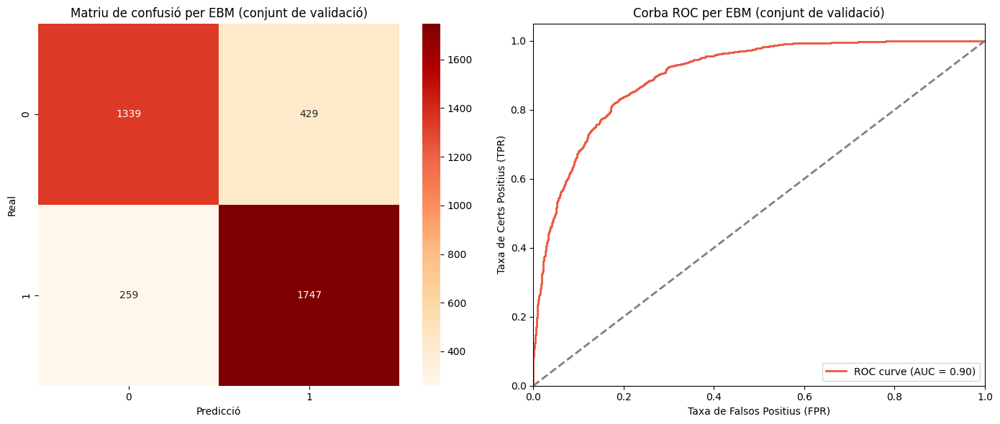

In [133]:
from sklearn.metrics import confusion_matrix, roc_curve, auc

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per EBM (conjunt de validació)
sns.heatmap(confusion_matrix(y_val, y_val_pred_ebm), annot=True, fmt="d", cmap="OrRd", ax=ax[0])
ax[0].set_title("Matriu de confusió per EBM (conjunt de validació)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Corba ROC per EBM (conjunt de validació)
y_val_proba_EBM = ebm_best.predict_proba(X_val)[:, 1]
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_proba_EBM)
roc_auc_val = auc(fpr_val, tpr_val)

ax[1].plot(fpr_val, tpr_val, color=c3, lw=2, label=f'ROC curve (AUC = {roc_auc_val:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per EBM (conjunt de validació)')
ax[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

In [134]:
y_test_pred_ebm = ebm_best.predict(X_test)

test_metrics_ebc = classification_report(y_test, y_test_pred_ebm)
print("\n\033[1mMètriques per al conjunt de test:\033[0m")
print(test_metrics_ebc)



Mètriques per al conjunt de test:
              precision    recall  f1-score   support

           0       0.85      0.76      0.80      1468
           1       0.80      0.88      0.84      1649

    accuracy                           0.82      3117
   macro avg       0.83      0.82      0.82      3117
weighted avg       0.83      0.82      0.82      3117



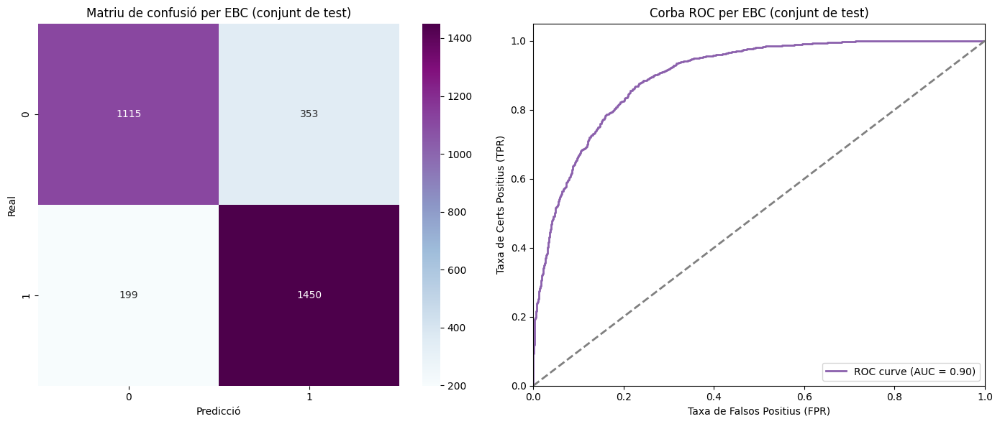

In [135]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Subplot 1: Matriu de confusió per EBC (conjunt de test)
sns.heatmap(confusion_matrix(y_test, y_test_pred_ebm), annot=True, fmt="d", cmap="BuPu", ax=ax[0])
ax[0].set_title("Matriu de confusió per EBC (conjunt de test)")
ax[0].set_xlabel("Predicció")
ax[0].set_ylabel("Real")

# Subplot 2: Corba ROC per EBC (conjunt de test)
y_test_proba_ebc = ebm_best.predict_proba(X_test)[:, 1]
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_proba_ebc)
roc_auc_test = auc(fpr_test, tpr_test)

ax[1].plot(fpr_test, tpr_test, color=c7, lw=2, label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax[1].plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
ax[1].set_xlim([0.0, 1.0])
ax[1].set_ylim([0.0, 1.05])
ax[1].set_xlabel('Taxa de Falsos Positius (FPR)')
ax[1].set_ylabel('Taxa de Certs Positius (TPR)')
ax[1].set_title('Corba ROC per EBC (conjunt de test)')
ax[1].legend(loc="lower right")

plt.tight_layout()
plt.show()
